# Testing notebook for nifty fit on atmosphere TODs directly (no image)

# Try to add a nifty model for sampling the input map

numpy version: 2.1.1


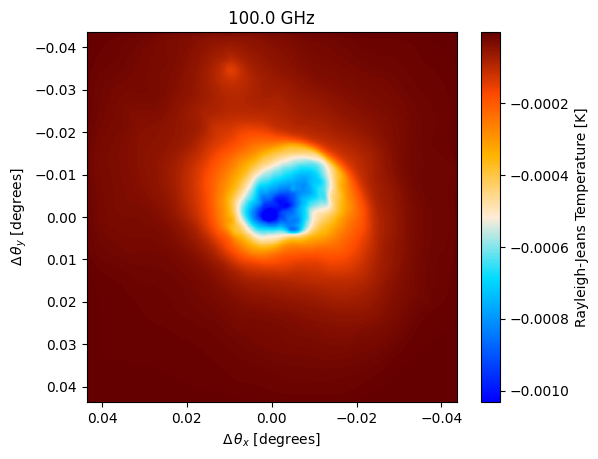

In [1]:
import numpy as np
print(f"numpy version: {np.__version__}")
import matplotlib.pyplot as plt
import maria
import sys
import os

# Relative import of sample_maps for now
sys.path.append(os.path.abspath('../python'))
import mapsampling_jax
from mapsampling_jax import sample_maps

map_filename = maria.io.fetch("maps/cluster.fits")

# load in the map from a fits file
input_map = maria.map.read_fits(filename=map_filename, #filename
                                resolution=-8.714e-05, #pixel size in degrees
                                index=0, #index for fits file
                                center=(150, 10), # position in the sky
                                units='Jy/pixel' # Units of the input map 
                               )

input_map.to(units="K_RJ").plot()

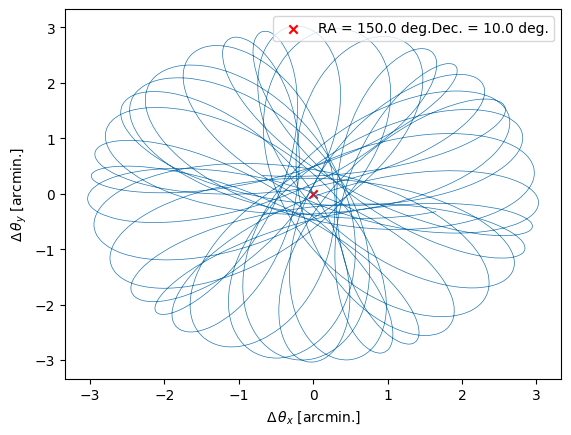

In [2]:
#load the map into maria
plan = maria.get_plan(scan_pattern="daisy", # scanning pattern
                      scan_options={"radius": 0.05, "speed": 0.01}, # in degrees
                      duration=600, # integration time in seconds
                      # duration=300, # integration time in seconds
                      sample_rate=50, # in Hz
                      scan_center=(150, 10), # position in the sky
                      frame="ra_dec")

plan.plot()

2024-10-08 13:45:32.221 INFO: Constructed instrument.
2024-10-08 13:45:32.222 INFO: Constructed plan.
2024-10-08 13:45:32.222 INFO: Constructed site.
2024-10-08 13:45:32.796 INFO: Constructed boresight.
2024-10-08 13:45:33.203 INFO: Constructed offsets.


Initialized base in 982 ms.


Generating noise: 100%|██████████| 1/1 [00:00<00:00,  2.15it/s]
Generating atmosphere: 4it [00:00,  4.15it/s]
Sampling map (m2/f093): 100%|██████████| 1/1 [00:03<00:00,  3.37s/it]


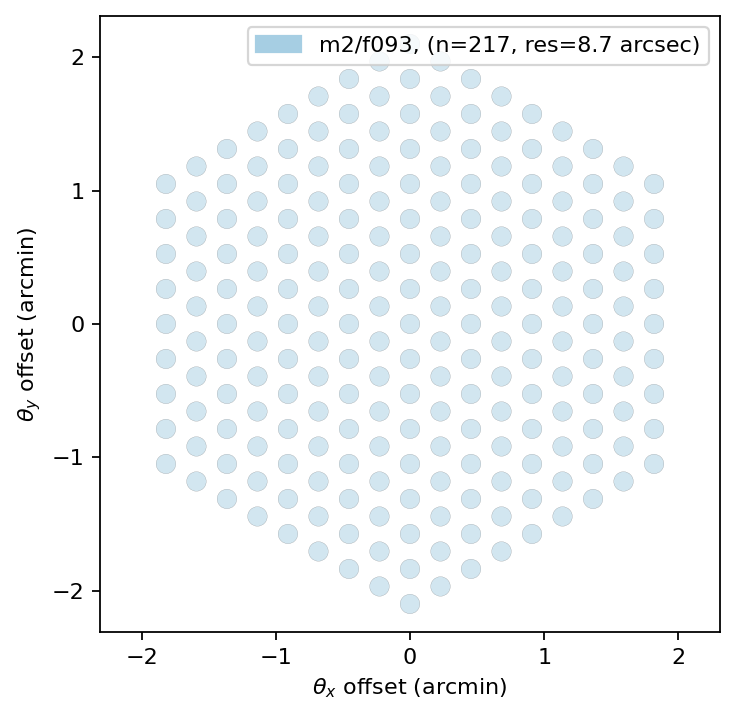

In [3]:
# instrument = maria.get_instrument('MUSTANG-2')
instrument = mapsampling_jax.instrument
instrument.plot()

sim_truthmap = maria.Simulation(instrument, 
                                plan=plan,
                                site="llano_de_chajnantor", 
                                map=input_map,
                                # noise=False,
                                atmosphere="2d",
                                # cmb="generate",
                                )

tod_truthmap = sim_truthmap.run()

In [4]:
dx, dy = sim_truthmap.coords.offsets(frame=sim_truthmap.map.frame, center=sim_truthmap.map.center)
dx = dx.compute()
dy = dy.compute()

dx

array([[-1.96240674e-04, -1.92984337e-04, -1.89692580e-04, ...,
         4.73482881e-04,  4.76804706e-04,  4.79748222e-04],
       [-2.45368526e-04, -2.42112447e-04, -2.38820937e-04, ...,
         4.28128111e-04,  4.31449653e-04,  4.34392909e-04],
       [-1.21051829e-04, -1.17795545e-04, -1.14503848e-04, ...,
         5.49360377e-04,  5.52682161e-04,  5.55625640e-04],
       ...,
       [ 1.21593319e-04,  1.24851773e-04,  1.28145564e-04, ...,
         7.60443498e-04,  7.63767623e-04,  7.66713254e-04],
       [-4.04728598e-04, -4.01469776e-04, -3.98175566e-04, ...,
         2.29301026e-04,  2.32625438e-04,  2.35571327e-04],
       [-7.45629448e-04, -7.42373311e-04, -7.39081689e-04, ...,
        -7.24916352e-05, -6.91701295e-05, -6.62269115e-05]])

Running mapper (m2/f093): 100%|██████████| 1/1 [00:05<00:00,  5.75s/it]


mapdata_truth shape: (1, 1000, 1000)
mapdata_truth mean: -8.726028151723567e-05


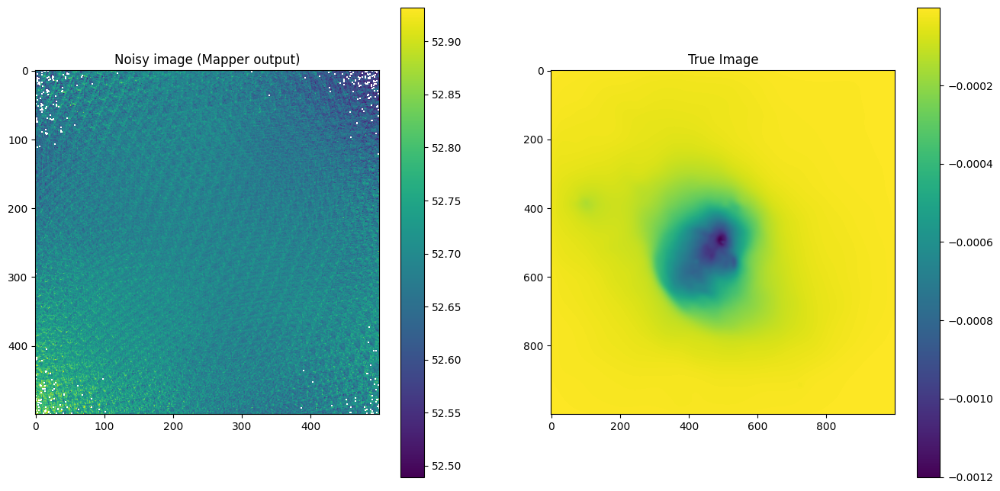

In [5]:
from maria.map.mappers import BinMapper

# Run mapper without any filtering to get noisy mimge
mapper_truthmap = BinMapper(center=(150, 10), frame="ra_dec", width=0.1, height=0.1, resolution=2e-4, map_postprocessing={"gaussian_filter": {"sigma": 0}} )
mapper_truthmap.add_tods(tod_truthmap)
output_truthmap = mapper_truthmap.run()

mapdata_truth = np.float64(sim_truthmap.map.data)
mapdata_truth = np.nan_to_num(mapdata_truth, nan=np.nanmean(mapdata_truth)) # replace nan value by img mean

print("mapdata_truth shape:", mapdata_truth.shape)
print("mapdata_truth mean:", mapdata_truth.mean())

fig, axes = plt.subplots(1, 2, figsize=(16, 8))

im0 = axes[0].imshow(output_truthmap.data[0].T)
fig.colorbar(im0)
axes[0].title.set_text("Noisy image (Mapper output)")

im1 = axes[1].imshow(mapdata_truth[0])
fig.colorbar(im1)
axes[1].title.set_text("True Image")

plt.show()

# Re-implement map sampling in JAX for nifty response function:

In [6]:
os.environ['CUDA_VISIBLE_DEVICES'] = '2'

import jax
from jax import random
import jax.numpy as jnp

import nifty8.re as jft
import matplotlib.pyplot as plt

import numpy as np

from functools import reduce
from operator import or_

seed = 42
key = random.PRNGKey(seed)

2024-10-08 13:45:53.080 INFO: Unable to initialize backend 'rocm': module 'jaxlib.xla_extension' has no attribute 'GpuAllocatorConfig'
2024-10-08 13:45:53.082 INFO: Unable to initialize backend 'tpu': INTERNAL: Failed to open libtpu.so: libtpu.so: cannot open shared object file: No such file or directory


# Test TOD agreement:

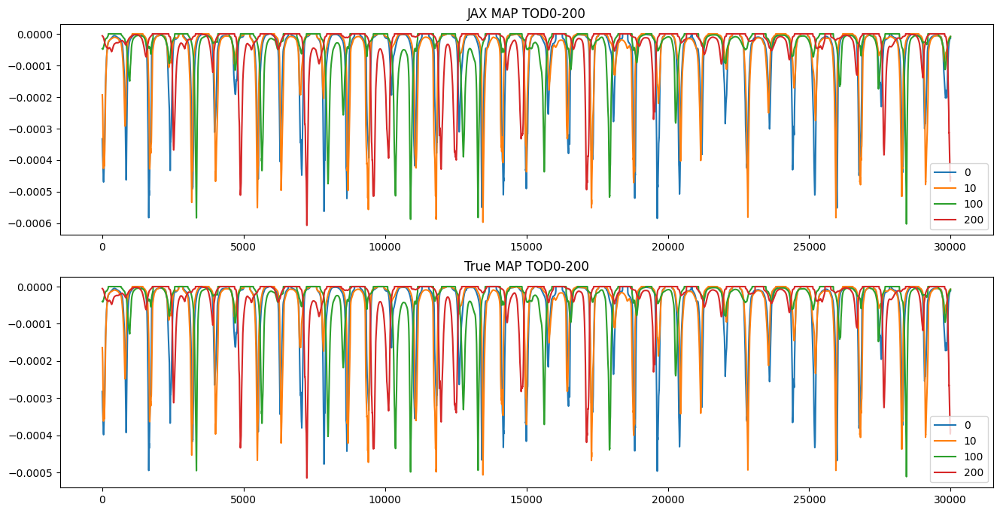

In [7]:
jax_tods_map = sample_maps(mapdata_truth, dx, dy, sim_truthmap.map.resolution, sim_truthmap.map.x_side, sim_truthmap.map.y_side)

fig, axes = plt.subplots(2, 1, figsize=(16, 8))

for i in [0, 10, 100, 200]:
    im0 = axes[0].plot(jax_tods_map[i], label=i)

    tods_map = np.float64(tod_truthmap.components['map'].compute())
    im1 = axes[1].plot(tods_map[i], label=i)
    
axes[0].title.set_text(f'JAX MAP TOD0-{i}')
axes[0].legend()
axes[1].title.set_text(f'True MAP TOD0-{i}')
axes[1].legend()

plt.show()

# Smooth atmosphere TODs:

In [8]:
import scipy as sp

jax_tods_atmos = tod_truthmap.components['atmosphere']
jax_tods_atmos_smooth = np.zeros(jax_tods_atmos.shape)

for i in range(jax_tods_atmos.shape[0]):
    jax_tods_atmos_smooth[i] = sp.ndimage.gaussian_filter1d(jax_tods_atmos[i], sigma=2e2)

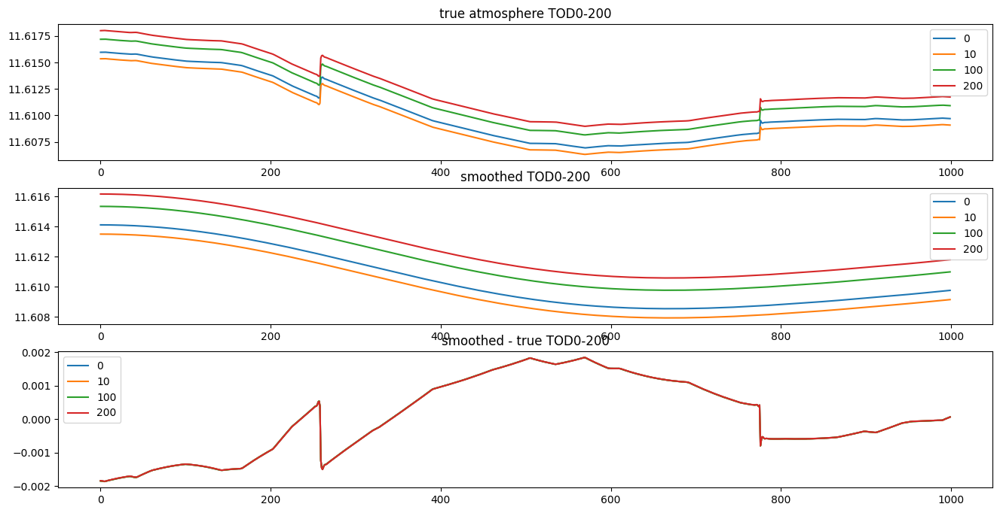

In [9]:
# plot smoothed atmos:

fig, axes = plt.subplots(3, 1, figsize=(16, 8))

for i in [0, 10, 100, 200]:
    im0 = axes[0].plot(jax_tods_atmos[i, 0:1000], label=i)
    im1 = axes[1].plot(jax_tods_atmos_smooth[i, 0:1000], label=i)
    im2 = axes[2].plot(jax_tods_atmos_smooth[i, 0:1000] - jax_tods_atmos[i, 0:1000], label=i)
    
axes[0].title.set_text(f'true atmosphere TOD0-{i}')
axes[0].legend()
axes[1].title.set_text(f'smoothed TOD0-{i}')
axes[1].legend()
axes[2].title.set_text(f'smoothed - true TOD0-{i}')
axes[2].legend()

plt.show()

# Prepare noised input TODs:

Noise stddev: 0.00025149685


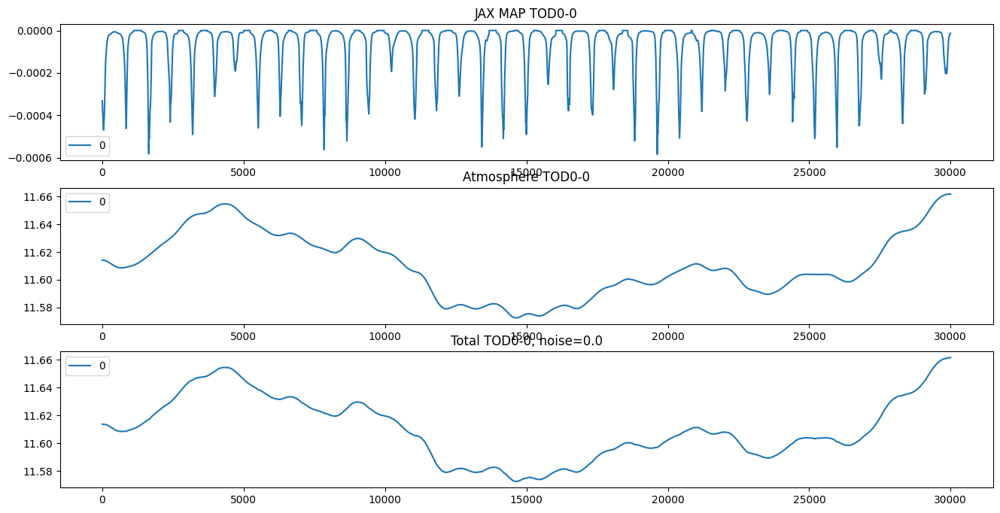

In [10]:
# Pick noise level for rest of run:
noiselevel = 0.0
# noiselevel = 0.1
# noiselevel = 0.5
# noiselevel = 1.0

# Add n TODs for atmos:
n = 1
# n = noised_jax_tod.shape[0]

jax_tods_atmos = tod_truthmap.components['atmosphere']
# noised_jax_tod = np.float64(jax_tods_map) + np.float64(jax_tods_atmos) + np.float64(tod_truthmap.components['noise']*noiselevel)

noised_jax_tod = np.float64(jax_tods_map) + np.float64(tod_truthmap.components['noise']*noiselevel)
noised_jax_tod[:n] += np.float64(jax_tods_atmos_smooth[:n]) 
# noised_jax_tod[:n] = np.float64(jax_tods_atmos_smooth[:n])

print("Noise stddev:", np.std(tod_truthmap.components['noise'].compute()))

fig, axes = plt.subplots(3, 1, figsize=(16, 8))

# for i in [0, 10, 100, 200]:
for i in [0]:
    im0 = axes[0].plot(jax_tods_map[i], label=i)
    # im1 = axes[1].plot(jax_tods_atmos[i], label=i)
    im1 = axes[1].plot(jax_tods_atmos_smooth[i], label=i)
    im2 = axes[2].plot(noised_jax_tod[i], label=i)
    
axes[0].title.set_text(f'JAX MAP TOD0-{i}')
axes[0].legend()
axes[1].title.set_text(f'Atmosphere TOD0-{i}')
axes[1].legend()
axes[2].title.set_text(f'Total TOD0-{i}, noise={noiselevel}')
axes[2].legend()

plt.show()

# Next, initialise nifty prior model

Start with the atmosphere TOD model:

In [11]:
dims_atmos = (jax_tods_atmos.shape[1] + 2000,)
padding_atmos = dims_atmos[0] - jax_tods_atmos.shape[1]

# correlated field zero mode GP offset and stddev
# cf_zm_tod = dict(offset_mean=jax_tods_atmos.mean().compute(), offset_std=(0.001, 0.1))
cf_zm_tod = dict(offset_mean=jax_tods_atmos.mean().compute(), offset_std=(0.0005, 0.001))

# correlated field fluctuations (mostly don't need tuning)
# fluctuations: y-offset in power spectrum in fourier space (zero mode)
# loglogavgslope: power-spectrum slope in log-log space in frequency domain (Fourier space) Jakob: -4 -- -2
# flexibility=(1.5e0, 5e-1), # deviation from simple power-law
# asperity=(5e-1, 5e-2), # small scale features in power-law
cf_fl_tod = dict(
    fluctuations=(0.005, 0.005), 
    loglogavgslope=(-3, 0.5), 
    flexibility=None,
    asperity=None,
)

# put together in correlated field model
cfm_tod = jft.CorrelatedFieldMaker("")
cfm_tod.set_amplitude_total_offset(**cf_zm_tod)
cfm_tod.add_fluctuations(
    dims_atmos, distances=1.0 / dims_atmos[0], **cf_fl_tod, prefix="tod ", non_parametric_kind="power"
)
# gp_tod = cfm_tod.finalize()

## Add one Correlated field per TOD with shared flucts and zero-mean

In [12]:
# init params for each TOD:

gps_tods = []
for i in range(n):
    cfmi = jft.CorrelatedFieldMaker(f'tod{i} ')
    # cfmi.set_amplitude_total_offset(**cf_zm_tod)
    cfmi._azm = cfm_tod._azm
    cfmi._offset_mean = cfm_tod._offset_mean
    cfmi._parameter_tree['zeromode'] = jft.ShapeWithDtype(())

    cfmi._fluctuations.append(cfm_tod._fluctuations[0])
    cfmi._target_grids.append(cfm_tod._target_grids[0])
    cfmi._parameter_tree.update(cfm_tod._fluctuations[0].domain)
    gps_tods.append(cfmi.finalize())

## Now for the map model:

In [13]:
dims_map = (1000, 1000)

# Map model

# correlated field zero mode GP offset and stddev
# cf_zm_map = dict(offset_mean=mapdata_truth.mean(), offset_std=(1e-7, 1e-6))
cf_zm_map = dict(offset_mean=mapdata_truth.mean(), offset_std=(1e-8, 1e-7))
# correlated field fluctuations (mostly don't need tuning)
cf_fl_map = dict(
    fluctuations=(1e-6, 1e-6), # fluctuations: y-offset in power spectrum in fourier space (zero mode)
    loglogavgslope=(-2.5e0, 5e-1), # power-spectrum slope in log-log space in frequency domain (Fourier space) Jakob: -4 -- -2
    flexibility=None,
    asperity=None,
    # flexibility=(1.5e0, 5e-1), # deviation from simple power-law
    # asperity=(5e-1, 5e-2), # small scale features in power-law
)

# put together in correlated field model
cfm_map = jft.CorrelatedFieldMaker("cfmap")
cfm_map.set_amplitude_total_offset(**cf_zm_map)
cfm_map.add_fluctuations(
    dims_map, distances=1.0 / dims_map[0], **cf_fl_map, prefix="ax1", non_parametric_kind="power"
)
gp_map = cfm_map.finalize()

In [14]:
# only tod:
# class Signal_TOD(jft.Model):
#     def __init__(self, gps_tods):
#         # self.gp_tod = gp_tod
#         # super().__init__(init=self.gp_tod.init, domain=jft.Vector(gp_tod.domain))
#         self.gps_tods = gps_tods
#         self.tgt = (len(gps_tods), gps_tods[0].target.size)
#         # self.gp_map = gp_map
#         # super().__init__(init=reduce(or_, [gp.init for gp in gps_tods] + [gp_map.init]), domain=reduce(or_, [gp.domain for gp in gps_tods] + [gp_map.domain]))
#         super().__init__(init=reduce(or_, [gp.init for gp in gps_tods]), domain=reduce(or_, [gp.domain for gp in gps_tods]))
    
#     def __call__(self, x):
#         res_tods = jnp.zeros(self.tgt)
#         for i, gp in enumerate(self.gps_tods):
#             res_tods = res_tods.at[i].set(gp(x))
        
#         return res_tods[:, padding_atmos//2:-padding_atmos//2]

#         # res_map = sample_maps(jax.numpy.broadcast_to(self.gp_map(x), (1, dims_map[0], dims_map[1])), dx, dy, sim_truthmap.map.resolution, sim_truthmap.map.x_side, sim_truthmap.map.y_side)

#         # # Only add first n atmosphere tods, otherwise use map
#         # modified_res_map = res_map.at[:n, :].add(res_tods[:, padding_atmos//2:-padding_atmos//2])

#         # return modified_res_map

# signal_response_tod = Signal_TOD(gps_tods)

# # map only:
# class Signal_TOD(jft.Model):
#     def __init__(self, gp_map):
#         # self.gp_tod = gp_tod
#         # super().__init__(init=self.gp_tod.init, domain=jft.Vector(gp_tod.domain))
#         # self.gps_tods = gps_tods
#         # self.tgt = (len(gps_tods), gps_tods[0].target.size)
#         self.gp_map = gp_map
#         # super().__init__(init=reduce(or_, [gp.init for gp in gps_tods] + [gp_map.init]), domain=reduce(or_, [gp.domain for gp in gps_tods] + [gp_map.domain]))
#         super().__init__(init=gp_map.init, domain=gp_map.domain)
    
#     def __call__(self, x):
#         # res_tods = jnp.zeros(self.tgt)
#         # for i, gp in enumerate(self.gps_tods):
#         #     res_tods = res_tods.at[i].set(gp(x))
        
#         res_map = sample_maps(jax.numpy.broadcast_to(self.gp_map(x), (1, dims_map[0], dims_map[1])), dx, dy, sim_truthmap.map.resolution, sim_truthmap.map.x_side, sim_truthmap.map.y_side)
#         return res_map

#         # Only add first n atmosphere tods, otherwise use map
#         # modified_res_map = res_map.at[:n, :].add(res_tods[:, padding_atmos//2:-padding_atmos//2])

#         # return modified_res_map
#         # return res_tods[:, padding_atmos//2:-padding_atmos//2] + res_map
#         # return res_tods[:, padding_atmos//2:-padding_atmos//2] + res_map[:n]
  
# signal_response_tod = Signal_TOD(gp_map)

In [15]:
# Define simple signal model with added map sampling
class Signal_TOD(jft.Model):
    def __init__(self, gps_tods, gp_map):
        # self.gp_tod = gp_tod
        # super().__init__(init=self.gp_tod.init, domain=jft.Vector(gp_tod.domain))
        self.gps_tods = gps_tods
        self.tgt = (len(gps_tods), gps_tods[0].target.size)
        self.gp_map = gp_map
        super().__init__(init=reduce(or_, [gp.init for gp in gps_tods] + [gp_map.init]), domain=reduce(or_, [gp.domain for gp in gps_tods] + [gp_map.domain]))
    
    def __call__(self, x):
        res_tods = jnp.zeros(self.tgt)
        for i, gp in enumerate(self.gps_tods):
            res_tods = res_tods.at[i].set(gp(x))
        
        res_map = sample_maps(jax.numpy.broadcast_to(self.gp_map(x), (1, dims_map[0], dims_map[1])), dx, dy, sim_truthmap.map.resolution, sim_truthmap.map.x_side, sim_truthmap.map.y_side)

        # Only add first n atmosphere tods, otherwise use map
        modified_res_map = res_map.at[:n, :].add(res_tods[:, padding_atmos//2:-padding_atmos//2])

        return modified_res_map
        # return res_tods[:, padding_atmos//2:-padding_atmos//2] + res_map
        # return res_tods[:, padding_atmos//2:-padding_atmos//2] + res_map[:n]

signal_response_tod = Signal_TOD(gps_tods, gp_map)

# Define noise covariance
# if noiselevel == 0.0: noise_cov_inv_tod = lambda x: 2.5e-4**-2 * x
if noiselevel == 0.0: noise_cov_inv_tod = lambda x: 1e-8**-2 * x
elif noiselevel == 0.1: noise_cov_inv_tod = lambda x: 1e-4**-2 * x
elif noiselevel == 0.5: noise_cov_inv_tod = lambda x: 1e-4**-2 * x
elif noiselevel == 1.0: noise_cov_inv_tod = lambda x: 2.5e-4**-2 * x

# Combine in likelihood - only fit 0th TOD for now!
# truth = noised_jax_tod[:n]
truth = noised_jax_tod
lh_tod = jft.Gaussian( truth, noise_cov_inv_tod).amend(signal_response_tod)

# lh = lh_tod + lh_map
# lh = lh_map
lh = lh_tod

# lh_map_grad = jax.grad(lh_map)
lh_tod_grad = jax.grad(lh_tod)

assuming a diagonal covariance matrix;
setting `std_inv` to `cov_inv(ones_like(data))**0.5`


In [16]:
signal_response_tod

Signal_TOD(
	<bound method Signal_TOD.__call__>,
	domain={'cfmapax1fluctuations': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'cfmapax1loglogavgslope': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'cfmapxi': ShapeWithDtype(shape=(1000, 1000), dtype=<class 'jax.numpy.float64'>),
	 'cfmapzeromode': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'tod fluctuations': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'tod loglogavgslope': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'tod0 xi': ShapeWithDtype(shape=(32000,), dtype=<class 'jax.numpy.float64'>),
	 'zeromode': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>)},
	init=Initializer(
		{'cfmapax1fluctuations': functools.partial(<function random_like at 0x7f49293cd800>, primals=ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>)),
		 'cfmapax1loglogavgslope': functools.partial(<function random_like at 0x7f49293cd800>, primals=ShapeWi

# Draw Prior sample

(217, 30000)


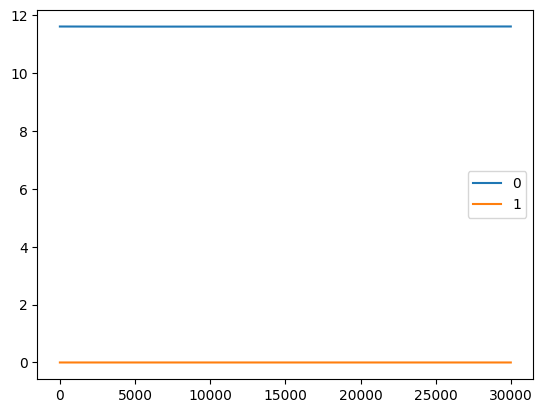

In [17]:
key, sub = jax.random.split(key)
xi = jft.random_like(sub, signal_response_tod.domain)
res = signal_response_tod(xi)
print(res.shape)

# for i in range(res.shape[0]):
for i in [0, 1]:
    plt.plot(np.arange(0, res.shape[1]), res[i], label=i)
plt.legend()
plt.show()

# MAP fit

In [18]:
n_it = 1
# delta = 1e-4 # default
# delta = 1e-8 # map
# tod
if noiselevel == 0.0: delta = 1e-4
elif noiselevel == 0.1: delta = 1e-10
elif noiselevel == 0.5: delta = 1e-10
elif noiselevel == 1.0: delta = 1e-4

n_samples = 0 # no samples -> maximum aposteriory posterior

key, k_i, k_o = random.split(key, 3)

samples, state = jft.optimize_kl(
    lh, # likelihood
    jft.Vector(lh.init(k_i)), # initial position in model space (initialisation)
    n_total_iterations=n_it, # no of optimisation steps (global)
    n_samples=n_samples, # draw samples
    key=k_o, # random jax init
    draw_linear_kwargs=dict( # sampling parameters
        cg_name="SL",
        cg_kwargs=dict(absdelta=delta * jft.size(lh.domain) / 10.0, maxiter=60),
    ),
    nonlinearly_update_kwargs=dict( # map from multivariate gaussian to more compl. distribution (coordinate transformations)
        minimize_kwargs=dict(
            name="SN",
            xtol=delta,
            cg_kwargs=dict(name=None),
            maxiter=5,
        )
    ),
    kl_kwargs=dict( # shift transformed multivar gauss to best match true posterior
        minimize_kwargs=dict(
            # name="M", xtol=delta, cg_kwargs=dict(name=None), maxiter=60 # map
            name="M", xtol=delta, cg_kwargs=dict(name=None), maxiter=20 # map
        )
    ),
    sample_mode="nonlinear_resample", # how steps are combined (samples + nonlin + KL)
)

OPTIMIZE_KL: Starting 0001
M: →:0.5 ↺:False #∇²:06 |↘|:6.120197e+01 ➽:1.032006e+02
M: Iteration 1 ⛰:+5.295774e+16 Δ⛰:1.847185e+16
OPTIMIZE_KL: Iteration 0001 ⛰:+5.2958e+16
OPTIMIZE_KL: #(KL minimization steps) 1
OPTIMIZE_KL: Likelihood residual(s):
'reduced χ²: 1.6e+10±     0.0, avg: -1.9e+01±     0.0, #dof:6510000'

OPTIMIZE_KL: Prior residual(s):
cfmapax1fluctuations    :: 'reduced χ²:    0.17±     0.0, avg:    -0.42±     0.0, #dof:      1'
cfmapax1loglogavgslope  :: 'reduced χ²:    0.27±     0.0, avg:    -0.52±     0.0, #dof:      1'
cfmapxi                 :: 'reduced χ²:     1.0±     0.0, avg: +0.00066±     0.0, #dof:1000000'
cfmapzeromode           :: 'reduced χ²:    0.17±     0.0, avg:    -0.41±     0.0, #dof:      1'
tod fluctuations        :: 'reduced χ²:     3.6±     0.0, avg:     +1.9±     0.0, #dof:      1'
tod loglogavgslope      :: 'reduced χ²:    0.85±     0.0, avg:    -0.92±     0.0, #dof:      1'
tod0 xi                 :: 'reduced χ²:     1.0±     0.0, avg:   -0.006± 

In [19]:
samples.pos

Vector(
	{'cfmapax1fluctuations': Array(-0.415048, dtype=float64),
	 'cfmapax1loglogavgslope': Array(-0.51528572, dtype=float64),
	 'cfmapxi': Array([[-1.03499179, -0.0772872 ,  0.74864795, ..., -0.94528711,
	         1.08377455,  0.06872998],
	       [ 0.07869563,  2.25444559,  1.14279996, ..., -0.19685443,
	         0.0557066 , -0.12721345],
	       [ 0.74716051,  1.02091328, -1.10063199, ...,  1.24385782,
	         0.51507764,  1.30358941],
	       ...,
	       [-1.62013872, -0.25574683, -1.48432503, ..., -0.63248276,
	         1.63143611, -1.20232163],
	       [ 1.17536213,  0.66615405, -0.7986735 , ...,  0.5495784 ,
	         0.35166289,  1.33431606],
	       [-0.51298915,  0.63752547, -0.81396167, ...,  0.6048838 ,
	        -0.24832555, -0.50236009]], dtype=float64),
	 'cfmapzeromode': Array(-0.40877757, dtype=float64),
	 'tod fluctuations': Array(1.88917465, dtype=float64),
	 'tod loglogavgslope': Array(-0.92320178, dtype=float64),
	 'tod0 xi': Array([-0.07517887,  0.56693152, -

In [20]:
def printfitresults():
    print("Fit Results (res, init, std)")

    print("\nTODs:")
    print(f"\tfluctuations: {jft.LogNormalPrior(*cf_fl_tod['fluctuations'])(samples.pos['tod fluctuations'])}, {cf_fl_tod['fluctuations'][0]}, {cf_fl_tod['fluctuations'][1]}")
    print(f"\tloglogvarslope: {jft.NormalPrior(*cf_fl_tod['loglogavgslope'])(samples.pos['tod loglogavgslope'])}, {cf_fl_tod['loglogavgslope'][0]}, {cf_fl_tod['loglogavgslope'][1]}")
    print(f"\tzeromode std (LogNormal): {jft.LogNormalPrior(*cf_zm_tod['offset_std'])(samples.pos['zeromode'])}, {cf_zm_tod['offset_std'][0]}, {cf_zm_tod['offset_std'][1]}")

    # If custom zeromode per TOD:
    # for i in range(n):
    #     test = samples.pos[f"tod{i} zeromode"]
    #     print(f"tod{i} zeromode: {jft.LogNormalPrior(cf_zm_tod['offset_mean'], cf_zm_tod['offset_std'][0])(test)}, {cf_zm_tod['offset_mean']}, {cf_zm_tod['offset_std'][0]}")
    
    print("map:")
    print(f"\tfluctuations: {jft.LogNormalPrior(*cf_fl_map['fluctuations'])(samples.pos['cfmapax1fluctuations'])}, {cf_fl_map['fluctuations'][0]}, {cf_fl_map['fluctuations'][1]}")
    print(f"\tloglogvarslope: {jft.NormalPrior(*cf_fl_map['loglogavgslope'])(samples.pos['cfmapax1loglogavgslope'])}, {cf_fl_map['loglogavgslope'][0]}, {cf_fl_map['loglogavgslope'][1]}")
    print(f"\tzeromode std (LogNormal): {jft.LogNormalPrior(*cf_zm_map['offset_std'])(samples.pos['cfmapzeromode'])}, {cf_zm_map['offset_std'][0]}, {cf_zm_map['offset_std'][1]}")
    
    
printfitresults()

Fit Results (res, init, std)

TODs:
	fluctuations: 0.01704241759763061, 0.005, 0.005
	loglogvarslope: -3.461600892338199, -3, 0.5
	zeromode std (LogNormal): 2.227807693978487e-05, 0.0005, 0.001
map:
	fluctuations: 5.005119950407112e-07, 1e-06, 1e-06
	loglogvarslope: -2.7576428595479605, -2.5, 0.5
	zeromode std (LogNormal): 4.134804157784485e-10, 1e-08, 1e-07


(217, 30000)


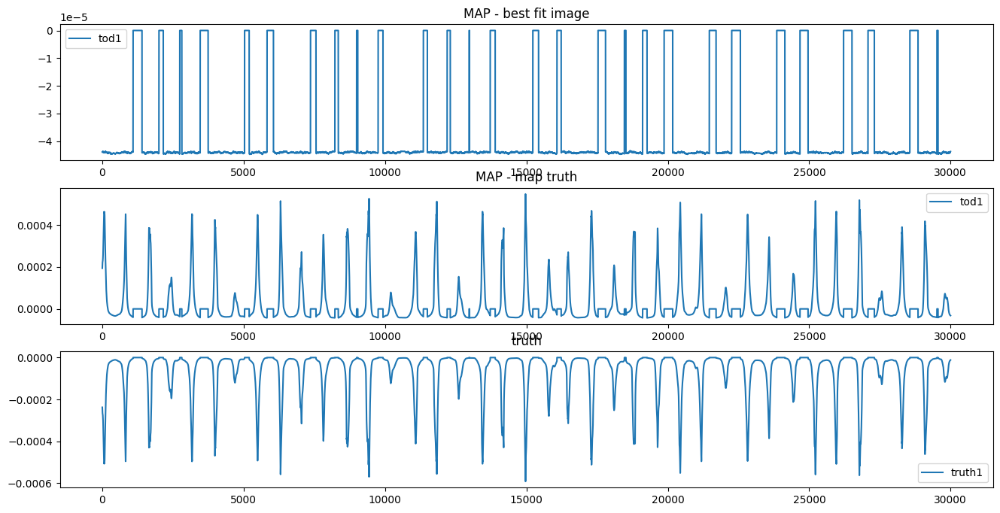

In [21]:
res = signal_response_tod(samples.pos)
print(res.shape)

fig, axes = plt.subplots(3, 1, figsize=(16, 8))

# for i in range(0, res.shape[0], res.shape[0]//10):
for i in [1]:
    im0 = axes[0].plot(np.arange(0, res.shape[1]), res[i], label=f"tod{i}")
    im1 = axes[1].plot(np.arange(0, res.shape[1]), res[i] - truth[i], label=f"tod{i}")
    im2 = axes[2].plot(truth[i], label=f"truth{i}")

axes[0].title.set_text('MAP - best fit image')
axes[0].legend()
axes[1].title.set_text('MAP - map truth')
axes[1].legend()
axes[2].title.set_text('truth')
axes[2].legend()

plt.show()

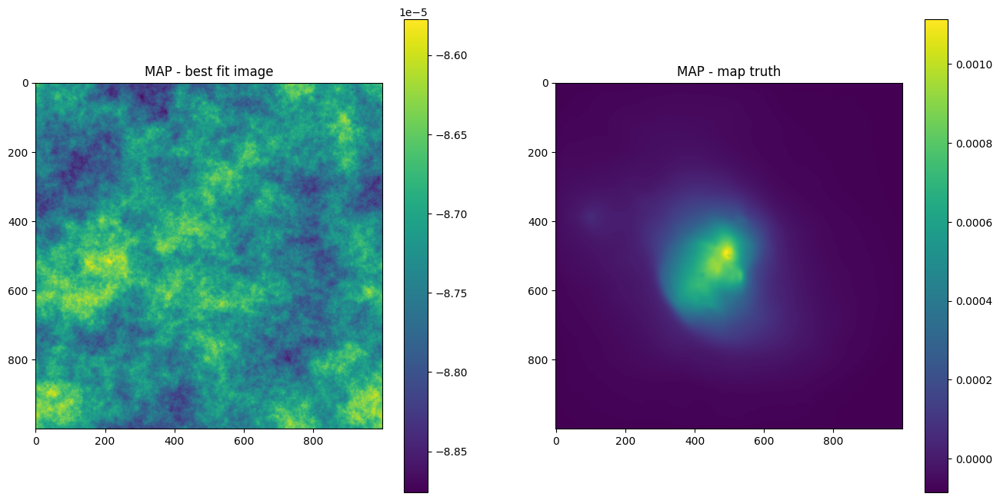

In [22]:
# plot maximum of posterior (mode)
sig_map = gp_map(samples.pos) # when splitting up in different field models

fig, axes = plt.subplots(1, 2, figsize=(16, 8))

im0 = axes[0].imshow(sig_map)
axes[0].title.set_text('MAP - best fit image')
fig.colorbar(im0)

im1 = axes[1].imshow( sig_map - mapdata_truth[0] )
axes[1].title.set_text('MAP - map truth')
# im1 = axes[1].imshow( (sig_map - mapdata_truth) )
# axes[1].title.set_text('diff prediction - map truth')
fig.colorbar(im1)

plt.show()

In [23]:
# assert False

## Full nifty fit:

OPTIMIZE_KL: Starting 0001
SL: Iteration 0 ⛰:+1.1811e+13 Δ⛰:inf ➽:1.0320e+01
SL: Iteration 1 ⛰:+5.1863e+12 Δ⛰:6.6251e+12 ➽:1.0320e+01
SL: Iteration 2 ⛰:+1.2729e+12 Δ⛰:3.9135e+12 ➽:1.0320e+01
SL: Iteration 3 ⛰:+1.0168e+12 Δ⛰:2.5608e+11 ➽:1.0320e+01
SL: Iteration 4 ⛰:+6.3597e+11 Δ⛰:3.8084e+11 ➽:1.0320e+01
SL: Iteration 5 ⛰:+4.2141e+11 Δ⛰:2.1456e+11 ➽:1.0320e+01
SL: Iteration 6 ⛰:+3.1366e+11 Δ⛰:1.0775e+11 ➽:1.0320e+01
SL: Iteration 7 ⛰:+2.4640e+11 Δ⛰:6.7259e+10 ➽:1.0320e+01
SL: Iteration 8 ⛰:+1.8820e+11 Δ⛰:5.8199e+10 ➽:1.0320e+01
SL: Iteration 9 ⛰:+1.2995e+11 Δ⛰:5.8250e+10 ➽:1.0320e+01
SL: Iteration 10 ⛰:+1.0249e+11 Δ⛰:2.7454e+10 ➽:1.0320e+01
SL: Iteration 11 ⛰:+5.3360e+10 Δ⛰:4.9133e+10 ➽:1.0320e+01
SL: Iteration 12 ⛰:+5.2568e+10 Δ⛰:7.9269e+08 ➽:1.0320e+01
SL: Iteration 13 ⛰:+4.3612e+10 Δ⛰:8.9554e+09 ➽:1.0320e+01
SL: Iteration 14 ⛰:+4.2769e+10 Δ⛰:8.4375e+08 ➽:1.0320e+01
SL: Iteration 15 ⛰:+3.4854e+10 Δ⛰:7.9142e+09 ➽:1.0320e+01
SL: Iteration 16 ⛰:+2.7868e+10 Δ⛰:6.9864e+09 ➽:1.0320e+01
SL: 

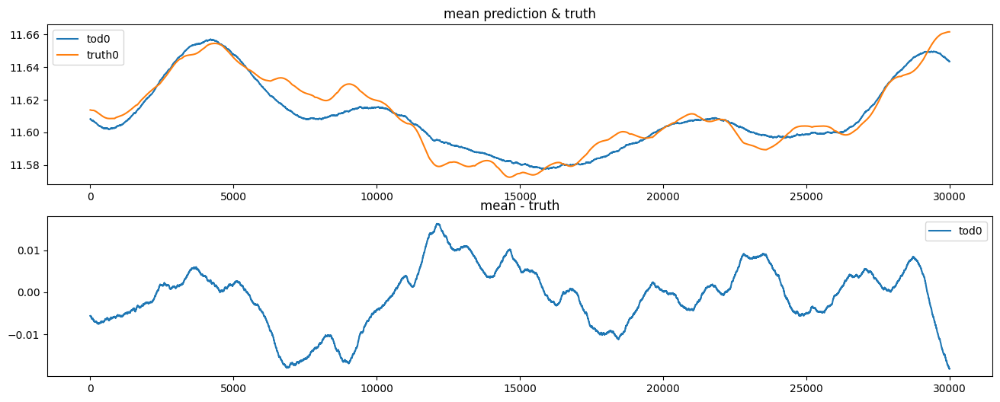

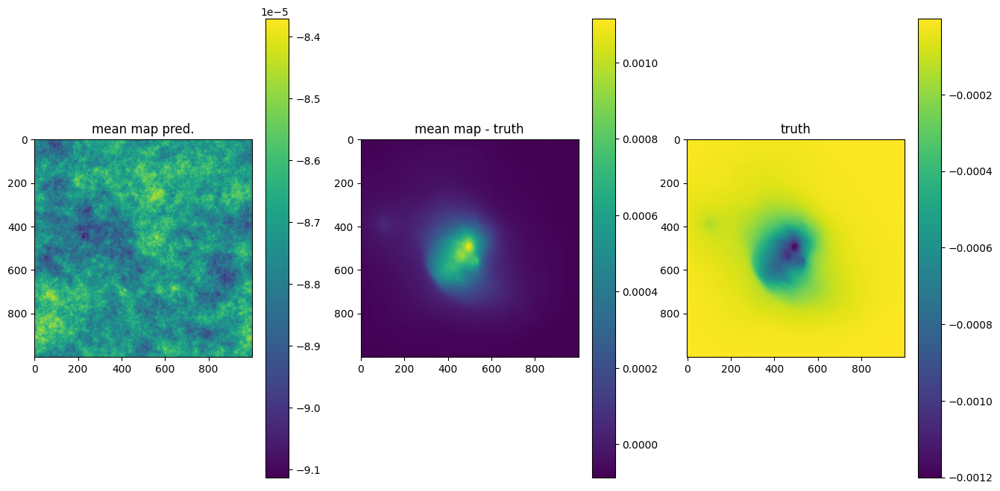

OPTIMIZE_KL: Starting 0002
SL: Iteration 0 ⛰:+9.8151e+15 Δ⛰:inf ➽:1.0320e+01
SL: Iteration 1 ⛰:+7.2929e+15 Δ⛰:2.5222e+15 ➽:1.0320e+01
SL: Iteration 2 ⛰:+2.9955e+14 Δ⛰:6.9933e+15 ➽:1.0320e+01
SL: Iteration 3 ⛰:+2.2552e+14 Δ⛰:7.4029e+13 ➽:1.0320e+01
SL: Iteration 4 ⛰:+1.4476e+14 Δ⛰:8.0763e+13 ➽:1.0320e+01
SL: Iteration 5 ⛰:+1.0949e+14 Δ⛰:3.5275e+13 ➽:1.0320e+01
SL: Iteration 6 ⛰:+7.4304e+13 Δ⛰:3.5182e+13 ➽:1.0320e+01
SL: Iteration 7 ⛰:+7.2120e+13 Δ⛰:2.1831e+12 ➽:1.0320e+01
SL: Iteration 8 ⛰:+5.8440e+13 Δ⛰:1.3680e+13 ➽:1.0320e+01
SL: Iteration 9 ⛰:+3.7723e+13 Δ⛰:2.0718e+13 ➽:1.0320e+01
SL: Iteration 10 ⛰:+3.0644e+13 Δ⛰:7.0787e+12 ➽:1.0320e+01
SL: Iteration 11 ⛰:+2.2876e+13 Δ⛰:7.7677e+12 ➽:1.0320e+01
SL: Iteration 12 ⛰:+2.2332e+13 Δ⛰:5.4394e+11 ➽:1.0320e+01
SL: Iteration 13 ⛰:+2.1916e+13 Δ⛰:4.1653e+11 ➽:1.0320e+01
SL: Iteration 14 ⛰:+1.6535e+13 Δ⛰:5.3808e+12 ➽:1.0320e+01
SL: Iteration 15 ⛰:+1.4212e+13 Δ⛰:2.3225e+12 ➽:1.0320e+01
SL: Iteration 16 ⛰:+1.1663e+13 Δ⛰:2.5490e+12 ➽:1.0320e+01
SL: 

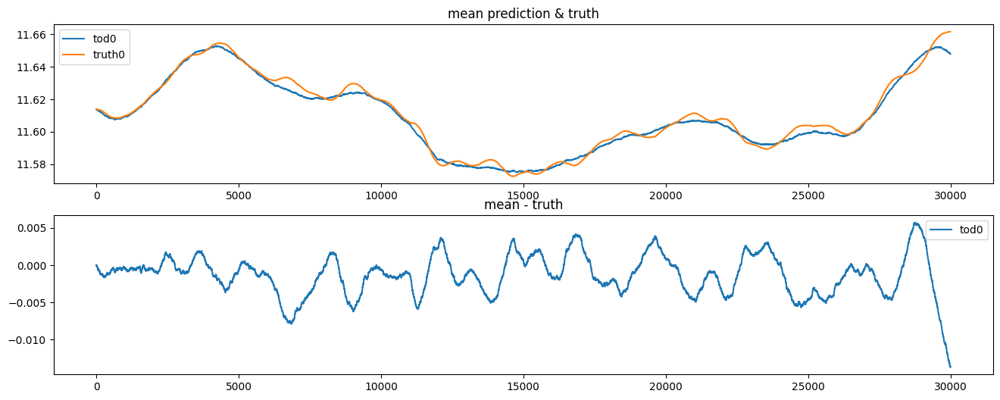

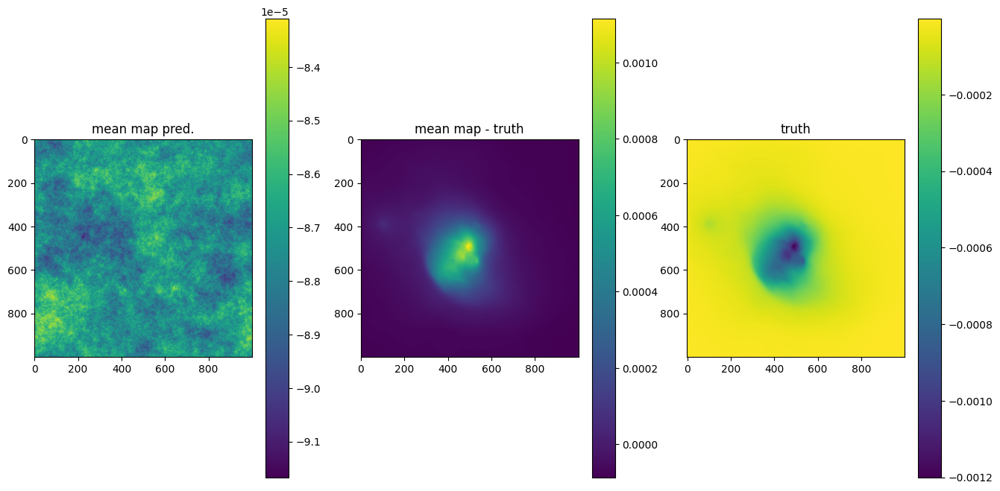

OPTIMIZE_KL: Starting 0003
SL: Iteration 0 ⛰:+1.4773e+15 Δ⛰:inf ➽:1.0320e+01
SL: Iteration 1 ⛰:+1.1268e+15 Δ⛰:3.5051e+14 ➽:1.0320e+01
SL: Iteration 2 ⛰:+4.7216e+14 Δ⛰:6.5466e+14 ➽:1.0320e+01
SL: Iteration 3 ⛰:+1.5251e+14 Δ⛰:3.1964e+14 ➽:1.0320e+01
SL: Iteration 4 ⛰:+7.1020e+13 Δ⛰:8.1494e+13 ➽:1.0320e+01
SL: Iteration 5 ⛰:+4.9782e+13 Δ⛰:2.1238e+13 ➽:1.0320e+01
SL: Iteration 6 ⛰:+3.3279e+13 Δ⛰:1.6503e+13 ➽:1.0320e+01
SL: Iteration 7 ⛰:+3.3264e+13 Δ⛰:1.4794e+10 ➽:1.0320e+01
SL: Iteration 8 ⛰:+2.8901e+13 Δ⛰:4.3625e+12 ➽:1.0320e+01
SL: Iteration 9 ⛰:+2.1294e+13 Δ⛰:7.6070e+12 ➽:1.0320e+01
SL: Iteration 10 ⛰:+1.6742e+13 Δ⛰:4.5523e+12 ➽:1.0320e+01
SL: Iteration 11 ⛰:+1.6205e+13 Δ⛰:5.3745e+11 ➽:1.0320e+01
SL: Iteration 12 ⛰:+1.5379e+13 Δ⛰:8.2558e+11 ➽:1.0320e+01
SL: Iteration 13 ⛰:+1.5375e+13 Δ⛰:4.2037e+09 ➽:1.0320e+01
SL: Iteration 14 ⛰:+1.2802e+13 Δ⛰:2.5729e+12 ➽:1.0320e+01
SL: Iteration 15 ⛰:+1.1420e+13 Δ⛰:1.3821e+12 ➽:1.0320e+01
SL: Iteration 16 ⛰:+9.9129e+12 Δ⛰:1.5068e+12 ➽:1.0320e+01
SL: 

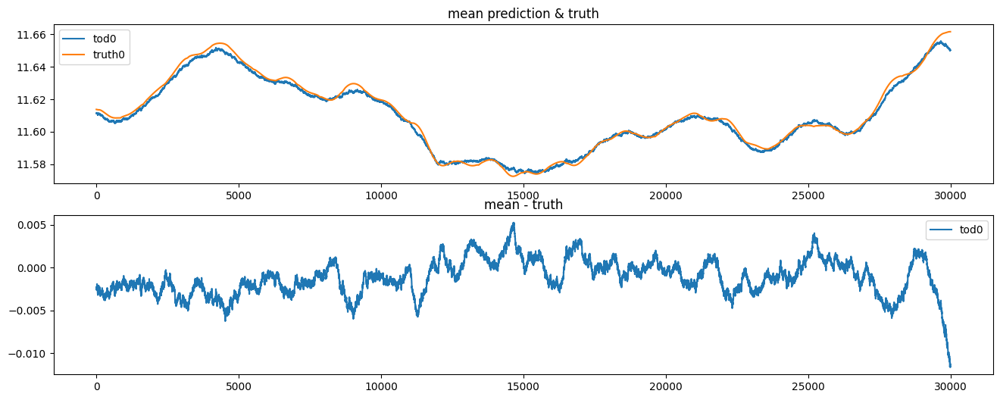

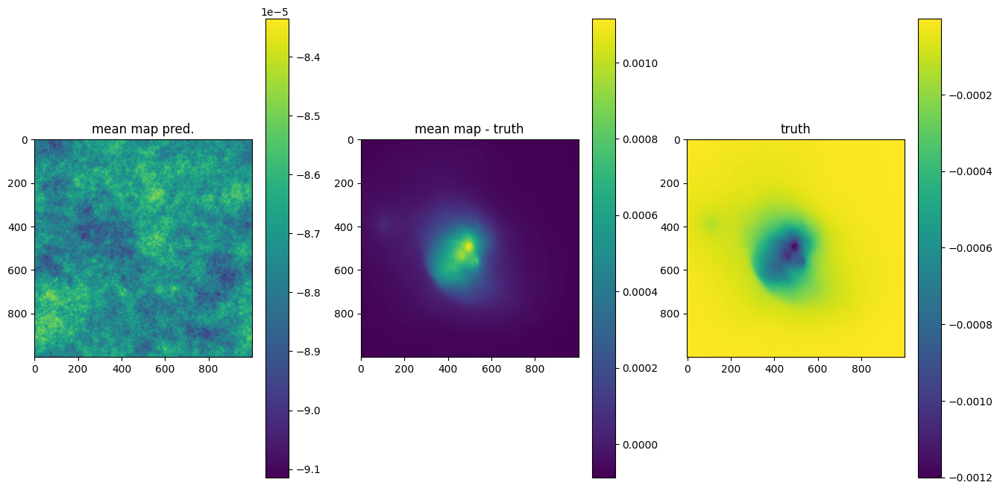

OPTIMIZE_KL: Starting 0004
SL: Iteration 0 ⛰:+1.0923e+16 Δ⛰:inf ➽:1.0320e+01
SL: Iteration 1 ⛰:+6.9586e+15 Δ⛰:3.9642e+15 ➽:1.0320e+01
SL: Iteration 2 ⛰:+3.7479e+14 Δ⛰:6.5838e+15 ➽:1.0320e+01
SL: Iteration 3 ⛰:+2.3455e+14 Δ⛰:1.4024e+14 ➽:1.0320e+01
SL: Iteration 4 ⛰:+1.4619e+14 Δ⛰:8.8364e+13 ➽:1.0320e+01
SL: Iteration 5 ⛰:+1.0319e+14 Δ⛰:4.3003e+13 ➽:1.0320e+01
SL: Iteration 6 ⛰:+8.2532e+13 Δ⛰:2.0654e+13 ➽:1.0320e+01
SL: Iteration 7 ⛰:+8.2186e+13 Δ⛰:3.4651e+11 ➽:1.0320e+01
SL: Iteration 8 ⛰:+7.0922e+13 Δ⛰:1.1264e+13 ➽:1.0320e+01
SL: Iteration 9 ⛰:+5.4345e+13 Δ⛰:1.6577e+13 ➽:1.0320e+01
SL: Iteration 10 ⛰:+4.6520e+13 Δ⛰:7.8255e+12 ➽:1.0320e+01
SL: Iteration 11 ⛰:+4.5148e+13 Δ⛰:1.3720e+12 ➽:1.0320e+01
SL: Iteration 12 ⛰:+4.1518e+13 Δ⛰:3.6297e+12 ➽:1.0320e+01
SL: Iteration 13 ⛰:+4.1507e+13 Δ⛰:1.1266e+10 ➽:1.0320e+01
SL: Iteration 14 ⛰:+3.3092e+13 Δ⛰:8.4147e+12 ➽:1.0320e+01
SL: Iteration 15 ⛰:+2.8703e+13 Δ⛰:4.3890e+12 ➽:1.0320e+01
SL: Iteration 16 ⛰:+2.6075e+13 Δ⛰:2.6278e+12 ➽:1.0320e+01
SL: 

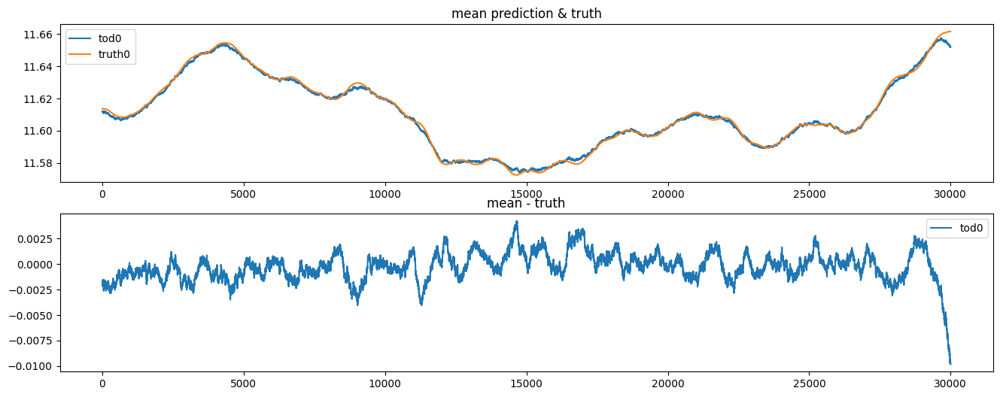

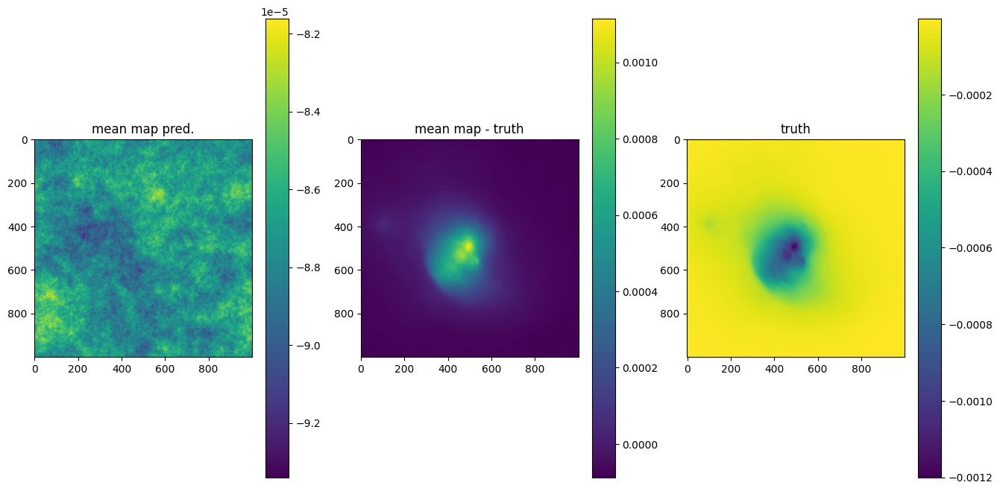

OPTIMIZE_KL: Starting 0005
SL: Iteration 0 ⛰:+6.4658e+15 Δ⛰:inf ➽:1.0320e+01
SL: Iteration 1 ⛰:+3.9377e+15 Δ⛰:2.5281e+15 ➽:1.0320e+01
SL: Iteration 2 ⛰:+5.8841e+14 Δ⛰:3.3493e+15 ➽:1.0320e+01
SL: Iteration 3 ⛰:+3.1456e+14 Δ⛰:2.7385e+14 ➽:1.0320e+01
SL: Iteration 4 ⛰:+1.7300e+14 Δ⛰:1.4156e+14 ➽:1.0320e+01
SL: Iteration 5 ⛰:+1.4203e+14 Δ⛰:3.0973e+13 ➽:1.0320e+01
SL: Iteration 6 ⛰:+1.1198e+14 Δ⛰:3.0051e+13 ➽:1.0320e+01
SL: Iteration 7 ⛰:+1.1179e+14 Δ⛰:1.8968e+11 ➽:1.0320e+01
SL: Iteration 8 ⛰:+7.3962e+13 Δ⛰:3.7824e+13 ➽:1.0320e+01
SL: Iteration 9 ⛰:+6.4168e+13 Δ⛰:9.7940e+12 ➽:1.0320e+01
SL: Iteration 10 ⛰:+4.7778e+13 Δ⛰:1.6390e+13 ➽:1.0320e+01
SL: Iteration 11 ⛰:+4.1349e+13 Δ⛰:6.4294e+12 ➽:1.0320e+01
SL: Iteration 12 ⛰:+4.1161e+13 Δ⛰:1.8773e+11 ➽:1.0320e+01
SL: Iteration 13 ⛰:+4.1156e+13 Δ⛰:4.7477e+09 ➽:1.0320e+01
SL: Iteration 14 ⛰:+3.6509e+13 Δ⛰:4.6476e+12 ➽:1.0320e+01
SL: Iteration 15 ⛰:+3.0660e+13 Δ⛰:5.8488e+12 ➽:1.0320e+01
SL: Iteration 16 ⛰:+2.6062e+13 Δ⛰:4.5975e+12 ➽:1.0320e+01
SL: 

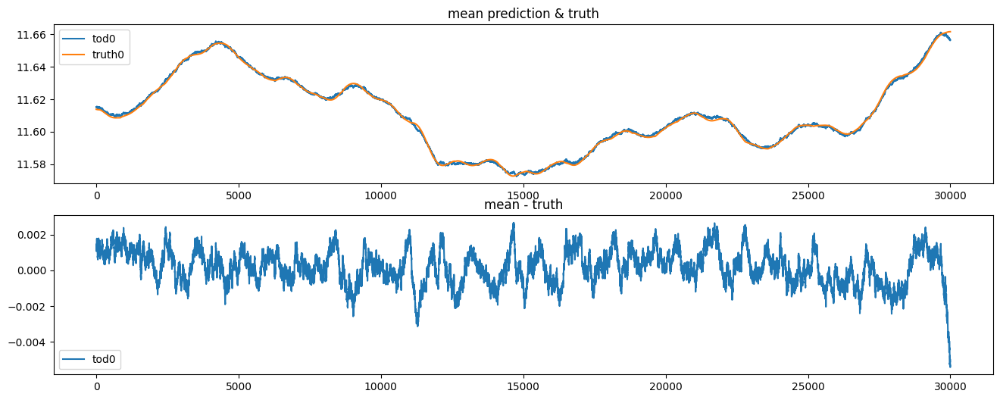

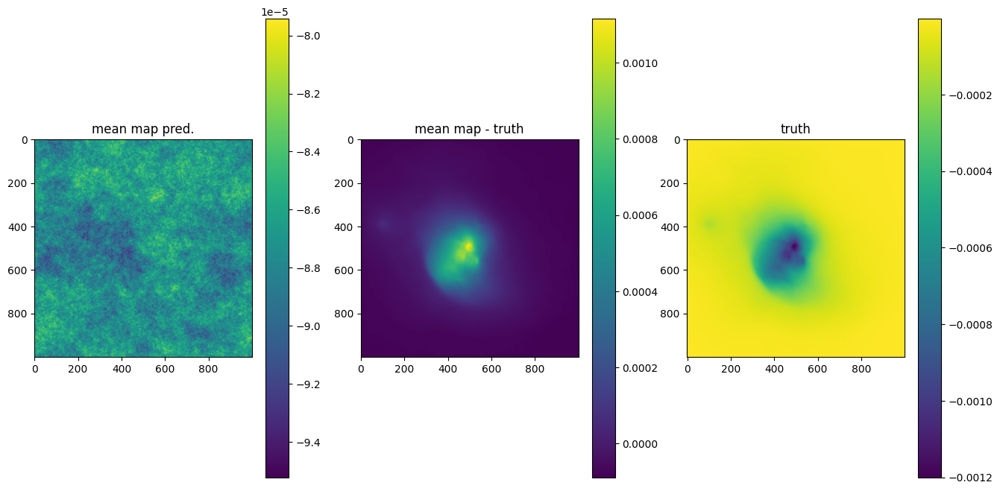

OPTIMIZE_KL: Starting 0006
SL: Iteration 0 ⛰:+1.5160e+17 Δ⛰:inf ➽:1.0320e+01
SL: Iteration 1 ⛰:+1.8262e+15 Δ⛰:1.4977e+17 ➽:1.0320e+01
SL: Iteration 2 ⛰:+1.1368e+15 Δ⛰:6.8942e+14 ➽:1.0320e+01
SL: Iteration 3 ⛰:+7.9622e+14 Δ⛰:3.4060e+14 ➽:1.0320e+01
SL: Iteration 4 ⛰:+4.1540e+14 Δ⛰:3.8082e+14 ➽:1.0320e+01
SL: Iteration 5 ⛰:+2.1951e+14 Δ⛰:1.9589e+14 ➽:1.0320e+01
SL: Iteration 6 ⛰:+9.6472e+13 Δ⛰:1.2304e+14 ➽:1.0320e+01
SL: Iteration 7 ⛰:+9.6431e+13 Δ⛰:4.0777e+10 ➽:1.0320e+01
SL: Iteration 8 ⛰:+8.1950e+13 Δ⛰:1.4481e+13 ➽:1.0320e+01
SL: Iteration 9 ⛰:+7.3149e+13 Δ⛰:8.8006e+12 ➽:1.0320e+01
SL: Iteration 10 ⛰:+5.7938e+13 Δ⛰:1.5211e+13 ➽:1.0320e+01
SL: Iteration 11 ⛰:+4.7974e+13 Δ⛰:9.9640e+12 ➽:1.0320e+01
SL: Iteration 12 ⛰:+4.7770e+13 Δ⛰:2.0369e+11 ➽:1.0320e+01
SL: Iteration 13 ⛰:+4.7756e+13 Δ⛰:1.3954e+10 ➽:1.0320e+01
SL: Iteration 14 ⛰:+4.2017e+13 Δ⛰:5.7388e+12 ➽:1.0320e+01
SL: Iteration 15 ⛰:+3.7853e+13 Δ⛰:4.1640e+12 ➽:1.0320e+01
SL: Iteration 16 ⛰:+3.2125e+13 Δ⛰:5.7281e+12 ➽:1.0320e+01
SL: 

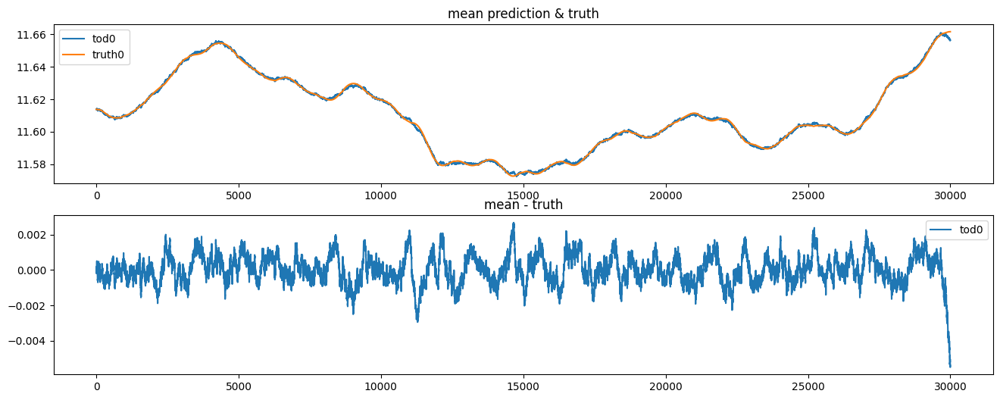

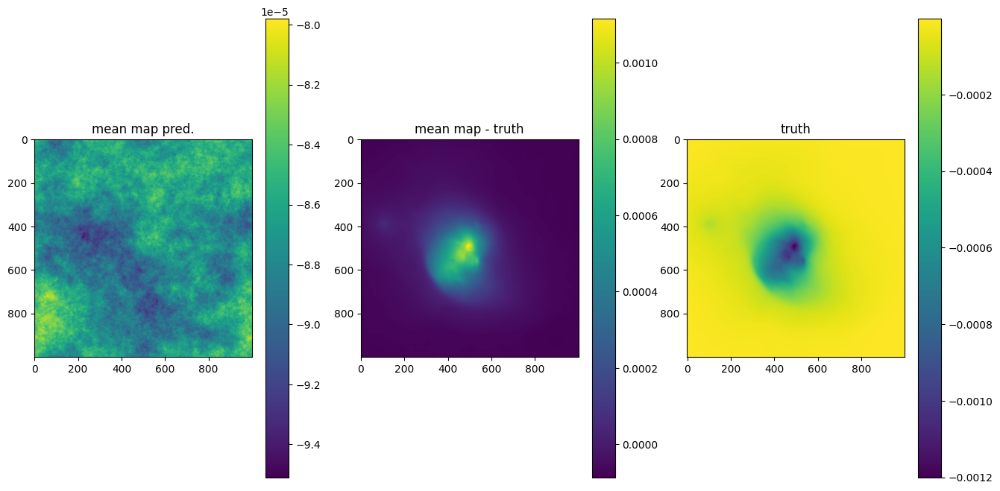

OPTIMIZE_KL: Starting 0007
SL: Iteration 0 ⛰:+4.1477e+15 Δ⛰:inf ➽:1.0320e+01
SL: Iteration 1 ⛰:+3.1682e+15 Δ⛰:9.7947e+14 ➽:1.0320e+01
SL: Iteration 2 ⛰:+5.6525e+14 Δ⛰:2.6030e+15 ➽:1.0320e+01
SL: Iteration 3 ⛰:+3.1307e+14 Δ⛰:2.5218e+14 ➽:1.0320e+01
SL: Iteration 4 ⛰:+2.3744e+14 Δ⛰:7.5626e+13 ➽:1.0320e+01
SL: Iteration 5 ⛰:+1.1649e+14 Δ⛰:1.2095e+14 ➽:1.0320e+01
SL: Iteration 6 ⛰:+9.7003e+13 Δ⛰:1.9487e+13 ➽:1.0320e+01
SL: Iteration 7 ⛰:+8.8664e+13 Δ⛰:8.3392e+12 ➽:1.0320e+01
SL: Iteration 8 ⛰:+7.0150e+13 Δ⛰:1.8514e+13 ➽:1.0320e+01
SL: Iteration 9 ⛰:+6.0784e+13 Δ⛰:9.3669e+12 ➽:1.0320e+01
SL: Iteration 10 ⛰:+5.1945e+13 Δ⛰:8.8385e+12 ➽:1.0320e+01
SL: Iteration 11 ⛰:+4.6622e+13 Δ⛰:5.3234e+12 ➽:1.0320e+01
SL: Iteration 12 ⛰:+4.1920e+13 Δ⛰:4.7018e+12 ➽:1.0320e+01
SL: Iteration 13 ⛰:+4.1604e+13 Δ⛰:3.1613e+11 ➽:1.0320e+01
SL: Iteration 14 ⛰:+4.0926e+13 Δ⛰:6.7817e+11 ➽:1.0320e+01
SL: Iteration 15 ⛰:+3.4234e+13 Δ⛰:6.6918e+12 ➽:1.0320e+01
SL: Iteration 16 ⛰:+2.9184e+13 Δ⛰:5.0494e+12 ➽:1.0320e+01
SL: 

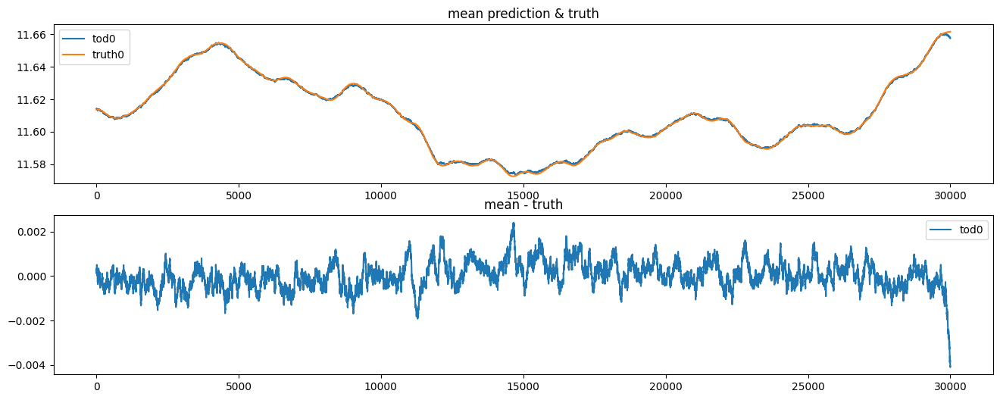

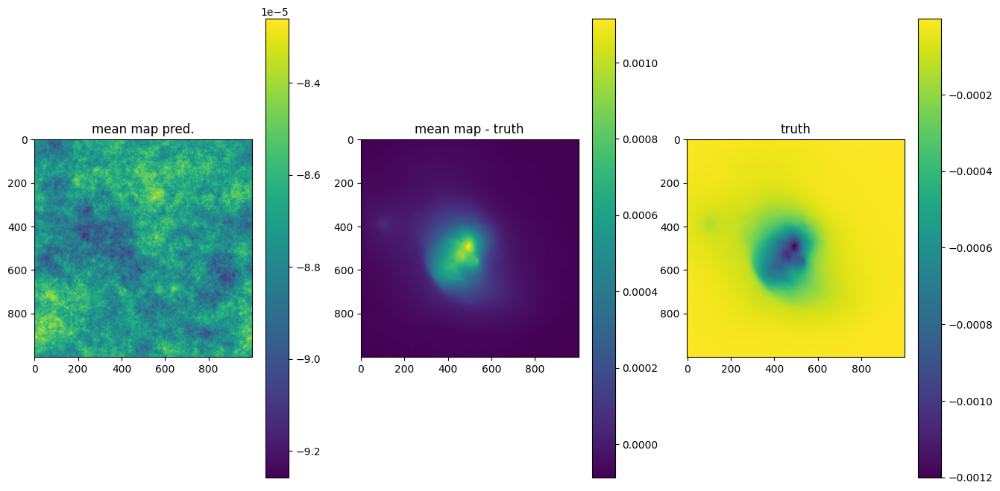

OPTIMIZE_KL: Starting 0008
SL: Iteration 0 ⛰:+4.0870e+15 Δ⛰:inf ➽:1.0320e+01
SL: Iteration 1 ⛰:+9.3372e+14 Δ⛰:3.1533e+15 ➽:1.0320e+01
SL: Iteration 2 ⛰:+7.1243e+14 Δ⛰:2.2129e+14 ➽:1.0320e+01
SL: Iteration 3 ⛰:+5.2112e+14 Δ⛰:1.9132e+14 ➽:1.0320e+01
SL: Iteration 4 ⛰:+3.1372e+14 Δ⛰:2.0739e+14 ➽:1.0320e+01
SL: Iteration 5 ⛰:+2.2352e+14 Δ⛰:9.0207e+13 ➽:1.0320e+01
SL: Iteration 6 ⛰:+1.3325e+14 Δ⛰:9.0261e+13 ➽:1.0320e+01
SL: Iteration 7 ⛰:+1.0253e+14 Δ⛰:3.0725e+13 ➽:1.0320e+01
SL: Iteration 8 ⛰:+8.1453e+13 Δ⛰:2.1076e+13 ➽:1.0320e+01
SL: Iteration 9 ⛰:+5.8005e+13 Δ⛰:2.3448e+13 ➽:1.0320e+01
SL: Iteration 10 ⛰:+5.2679e+13 Δ⛰:5.3259e+12 ➽:1.0320e+01
SL: Iteration 11 ⛰:+4.1851e+13 Δ⛰:1.0828e+13 ➽:1.0320e+01
SL: Iteration 12 ⛰:+3.6347e+13 Δ⛰:5.5041e+12 ➽:1.0320e+01
SL: Iteration 13 ⛰:+3.6307e+13 Δ⛰:4.0033e+10 ➽:1.0320e+01
SL: Iteration 14 ⛰:+3.6240e+13 Δ⛰:6.7075e+10 ➽:1.0320e+01
SL: Iteration 15 ⛰:+3.0361e+13 Δ⛰:5.8793e+12 ➽:1.0320e+01
SL: Iteration 16 ⛰:+2.5941e+13 Δ⛰:4.4200e+12 ➽:1.0320e+01
SL: 

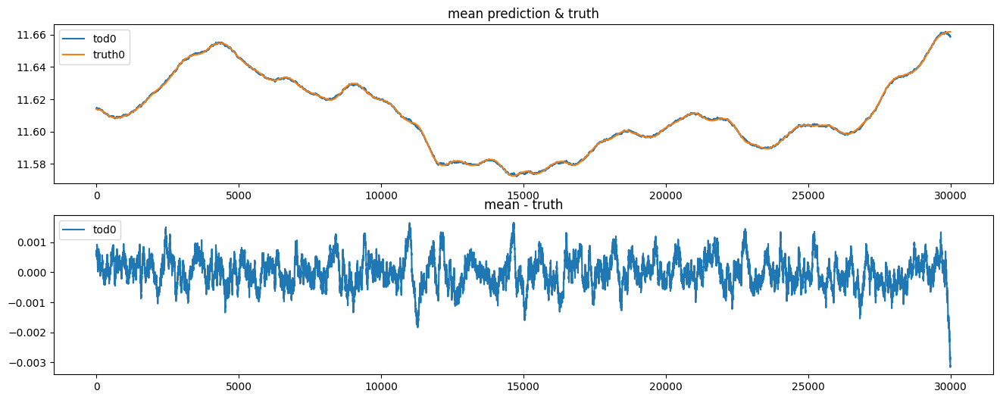

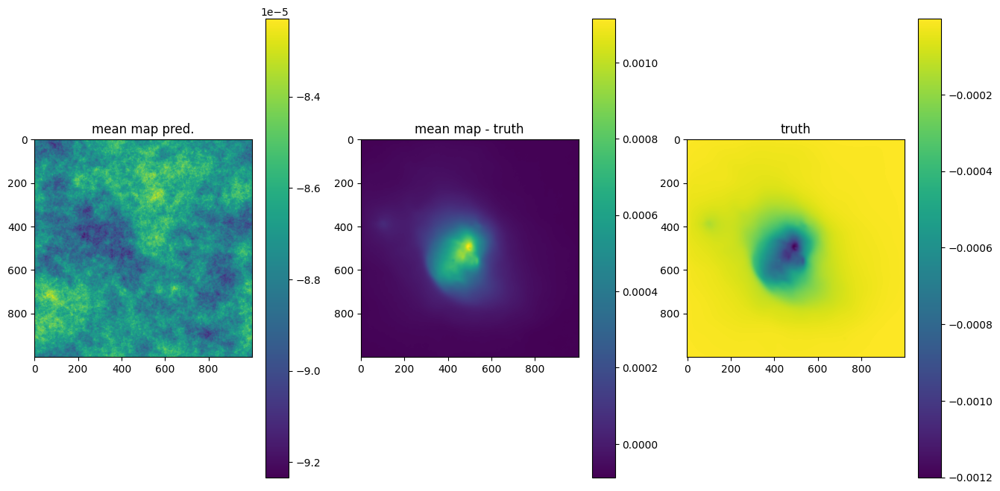

OPTIMIZE_KL: Starting 0009
SL: Iteration 0 ⛰:+1.0720e+16 Δ⛰:inf ➽:1.0320e+01
SL: Iteration 1 ⛰:+2.9171e+15 Δ⛰:7.8028e+15 ➽:1.0320e+01
SL: Iteration 2 ⛰:+1.0312e+15 Δ⛰:1.8859e+15 ➽:1.0320e+01
SL: Iteration 3 ⛰:+3.7487e+14 Δ⛰:6.5634e+14 ➽:1.0320e+01
SL: Iteration 4 ⛰:+2.8441e+14 Δ⛰:9.0459e+13 ➽:1.0320e+01
SL: Iteration 5 ⛰:+1.6059e+14 Δ⛰:1.2382e+14 ➽:1.0320e+01
SL: Iteration 6 ⛰:+1.0981e+14 Δ⛰:5.0775e+13 ➽:1.0320e+01
SL: Iteration 7 ⛰:+1.0880e+14 Δ⛰:1.0117e+12 ➽:1.0320e+01
SL: Iteration 8 ⛰:+8.0835e+13 Δ⛰:2.7967e+13 ➽:1.0320e+01
SL: Iteration 9 ⛰:+6.3926e+13 Δ⛰:1.6909e+13 ➽:1.0320e+01
SL: Iteration 10 ⛰:+5.1126e+13 Δ⛰:1.2800e+13 ➽:1.0320e+01
SL: Iteration 11 ⛰:+4.2200e+13 Δ⛰:8.9261e+12 ➽:1.0320e+01
SL: Iteration 12 ⛰:+4.1934e+13 Δ⛰:2.6633e+11 ➽:1.0320e+01
SL: Iteration 13 ⛰:+4.1859e+13 Δ⛰:7.4960e+10 ➽:1.0320e+01
SL: Iteration 14 ⛰:+3.6115e+13 Δ⛰:5.7438e+12 ➽:1.0320e+01
SL: Iteration 15 ⛰:+2.8041e+13 Δ⛰:8.0742e+12 ➽:1.0320e+01
SL: Iteration 16 ⛰:+2.3600e+13 Δ⛰:4.4410e+12 ➽:1.0320e+01
SL: 

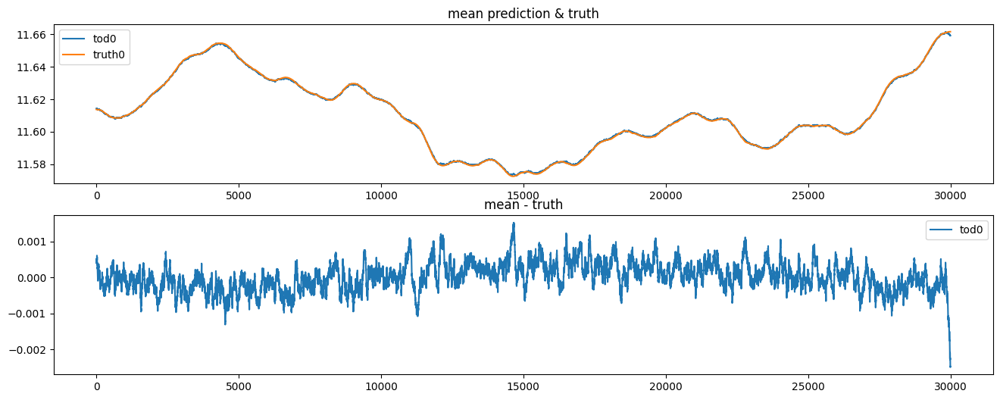

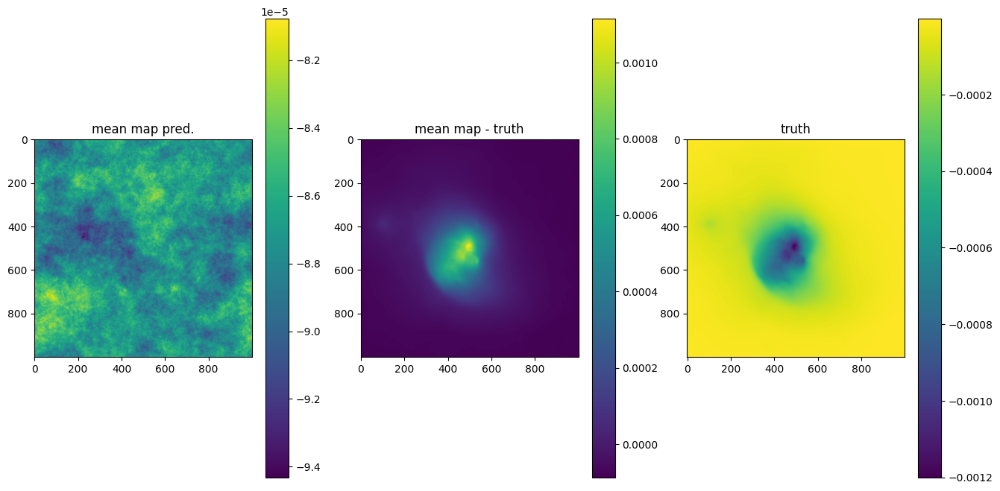

OPTIMIZE_KL: Starting 0010
SL: Iteration 0 ⛰:+4.0548e+16 Δ⛰:inf ➽:1.0320e+01
SL: Iteration 1 ⛰:+7.0141e+14 Δ⛰:3.9846e+16 ➽:1.0320e+01
SL: Iteration 2 ⛰:+3.9888e+14 Δ⛰:3.0253e+14 ➽:1.0320e+01
SL: Iteration 3 ⛰:+3.1929e+14 Δ⛰:7.9586e+13 ➽:1.0320e+01
SL: Iteration 4 ⛰:+1.2991e+14 Δ⛰:1.8938e+14 ➽:1.0320e+01
SL: Iteration 5 ⛰:+1.1500e+14 Δ⛰:1.4919e+13 ➽:1.0320e+01
SL: Iteration 6 ⛰:+9.2457e+13 Δ⛰:2.2539e+13 ➽:1.0320e+01
SL: Iteration 7 ⛰:+7.6761e+13 Δ⛰:1.5696e+13 ➽:1.0320e+01
SL: Iteration 8 ⛰:+7.2089e+13 Δ⛰:4.6719e+12 ➽:1.0320e+01
SL: Iteration 9 ⛰:+5.2420e+13 Δ⛰:1.9669e+13 ➽:1.0320e+01
SL: Iteration 10 ⛰:+4.5758e+13 Δ⛰:6.6621e+12 ➽:1.0320e+01
SL: Iteration 11 ⛰:+4.2891e+13 Δ⛰:2.8665e+12 ➽:1.0320e+01
SL: Iteration 12 ⛰:+4.2444e+13 Δ⛰:4.4728e+11 ➽:1.0320e+01
SL: Iteration 13 ⛰:+3.3653e+13 Δ⛰:8.7911e+12 ➽:1.0320e+01
SL: Iteration 14 ⛰:+3.3442e+13 Δ⛰:2.1133e+11 ➽:1.0320e+01
SL: Iteration 15 ⛰:+2.2790e+13 Δ⛰:1.0652e+13 ➽:1.0320e+01
SL: Iteration 16 ⛰:+1.8628e+13 Δ⛰:4.1621e+12 ➽:1.0320e+01
SL: 

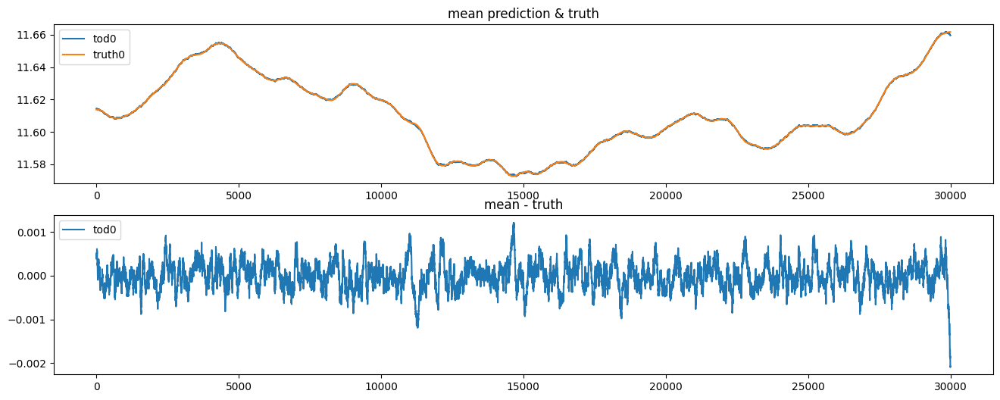

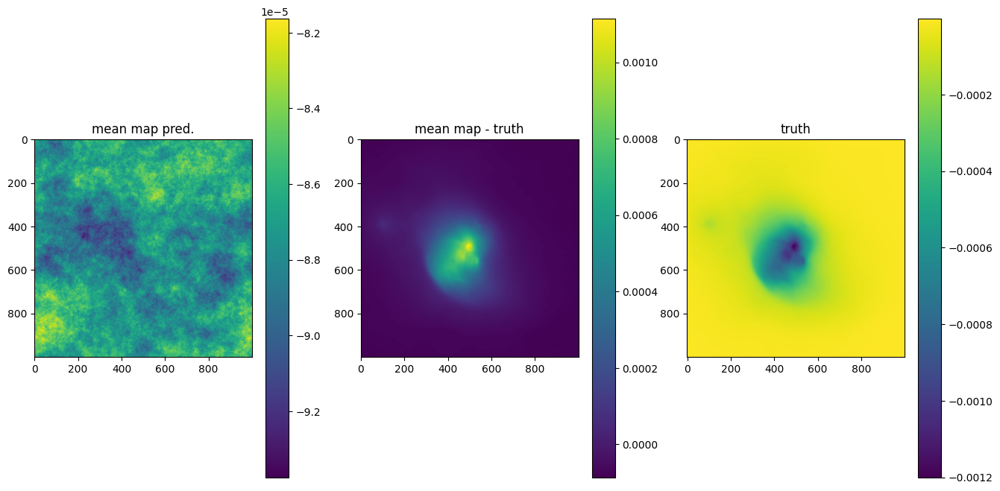

OPTIMIZE_KL: Starting 0011
SL: Iteration 0 ⛰:+3.4924e+16 Δ⛰:inf ➽:1.0320e+01
SL: Iteration 1 ⛰:+5.5443e+15 Δ⛰:2.9380e+16 ➽:1.0320e+01
SL: Iteration 2 ⛰:+8.6292e+14 Δ⛰:4.6814e+15 ➽:1.0320e+01
SL: Iteration 3 ⛰:+5.4860e+14 Δ⛰:3.1432e+14 ➽:1.0320e+01
SL: Iteration 4 ⛰:+3.6660e+14 Δ⛰:1.8200e+14 ➽:1.0320e+01
SL: Iteration 5 ⛰:+1.8401e+14 Δ⛰:1.8259e+14 ➽:1.0320e+01
SL: Iteration 6 ⛰:+1.1334e+14 Δ⛰:7.0669e+13 ➽:1.0320e+01
SL: Iteration 7 ⛰:+1.0835e+14 Δ⛰:4.9857e+12 ➽:1.0320e+01
SL: Iteration 8 ⛰:+7.4087e+13 Δ⛰:3.4264e+13 ➽:1.0320e+01
SL: Iteration 9 ⛰:+6.0478e+13 Δ⛰:1.3609e+13 ➽:1.0320e+01
SL: Iteration 10 ⛰:+4.4101e+13 Δ⛰:1.6377e+13 ➽:1.0320e+01
SL: Iteration 11 ⛰:+3.8365e+13 Δ⛰:5.7358e+12 ➽:1.0320e+01
SL: Iteration 12 ⛰:+3.7337e+13 Δ⛰:1.0286e+12 ➽:1.0320e+01
SL: Iteration 13 ⛰:+3.3129e+13 Δ⛰:4.2077e+12 ➽:1.0320e+01
SL: Iteration 14 ⛰:+2.8764e+13 Δ⛰:4.3652e+12 ➽:1.0320e+01
SL: Iteration 15 ⛰:+2.4315e+13 Δ⛰:4.4482e+12 ➽:1.0320e+01
SL: Iteration 16 ⛰:+2.1351e+13 Δ⛰:2.9640e+12 ➽:1.0320e+01
SL: 

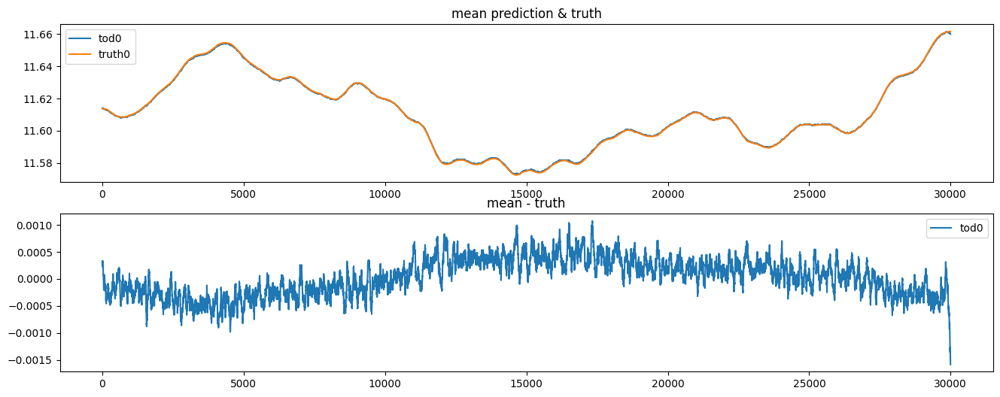

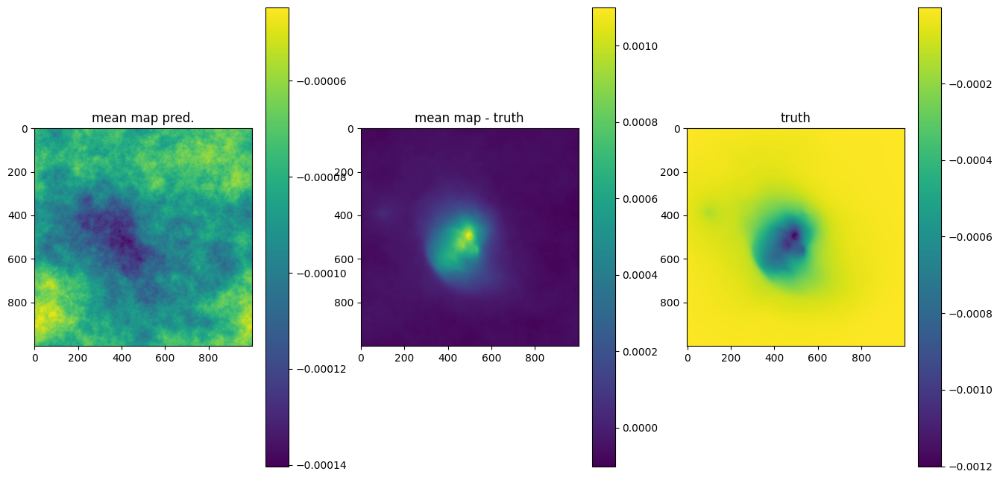

OPTIMIZE_KL: Starting 0012
SL: Iteration 0 ⛰:+4.6748e+16 Δ⛰:inf ➽:1.0320e+01
SL: Iteration 1 ⛰:+2.9735e+15 Δ⛰:4.3774e+16 ➽:1.0320e+01
SL: Iteration 2 ⛰:+5.7926e+14 Δ⛰:2.3942e+15 ➽:1.0320e+01
SL: Iteration 3 ⛰:+4.5930e+14 Δ⛰:1.1996e+14 ➽:1.0320e+01
SL: Iteration 4 ⛰:+2.0650e+14 Δ⛰:2.5280e+14 ➽:1.0320e+01
SL: Iteration 5 ⛰:+1.5498e+14 Δ⛰:5.1516e+13 ➽:1.0320e+01
SL: Iteration 6 ⛰:+9.4435e+13 Δ⛰:6.0549e+13 ➽:1.0320e+01
SL: Iteration 7 ⛰:+8.7852e+13 Δ⛰:6.5831e+12 ➽:1.0320e+01
SL: Iteration 8 ⛰:+7.3524e+13 Δ⛰:1.4328e+13 ➽:1.0320e+01
SL: Iteration 9 ⛰:+5.2411e+13 Δ⛰:2.1113e+13 ➽:1.0320e+01
SL: Iteration 10 ⛰:+3.6131e+13 Δ⛰:1.6280e+13 ➽:1.0320e+01
SL: Iteration 11 ⛰:+2.7511e+13 Δ⛰:8.6204e+12 ➽:1.0320e+01
SL: Iteration 12 ⛰:+2.2008e+13 Δ⛰:5.5023e+12 ➽:1.0320e+01
SL: Iteration 13 ⛰:+2.1834e+13 Δ⛰:1.7439e+11 ➽:1.0320e+01
SL: Iteration 14 ⛰:+2.1761e+13 Δ⛰:7.3160e+10 ➽:1.0320e+01
SL: Iteration 15 ⛰:+1.9162e+13 Δ⛰:2.5985e+12 ➽:1.0320e+01
SL: Iteration 16 ⛰:+1.6304e+13 Δ⛰:2.8579e+12 ➽:1.0320e+01
SL: 

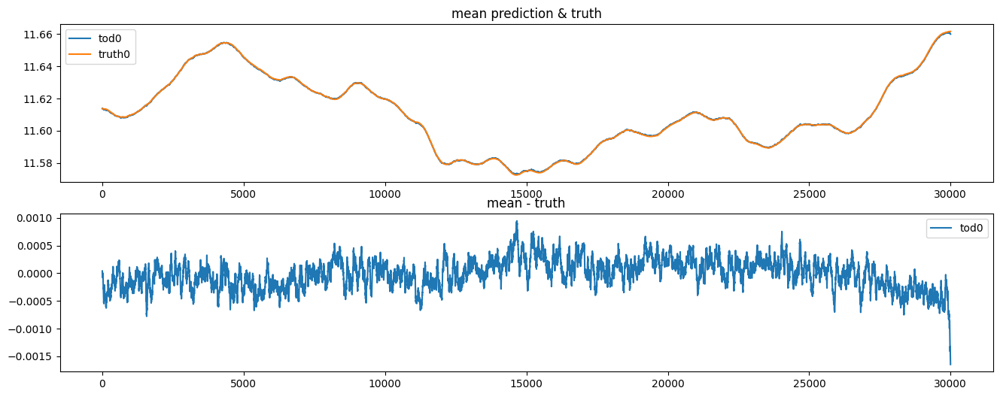

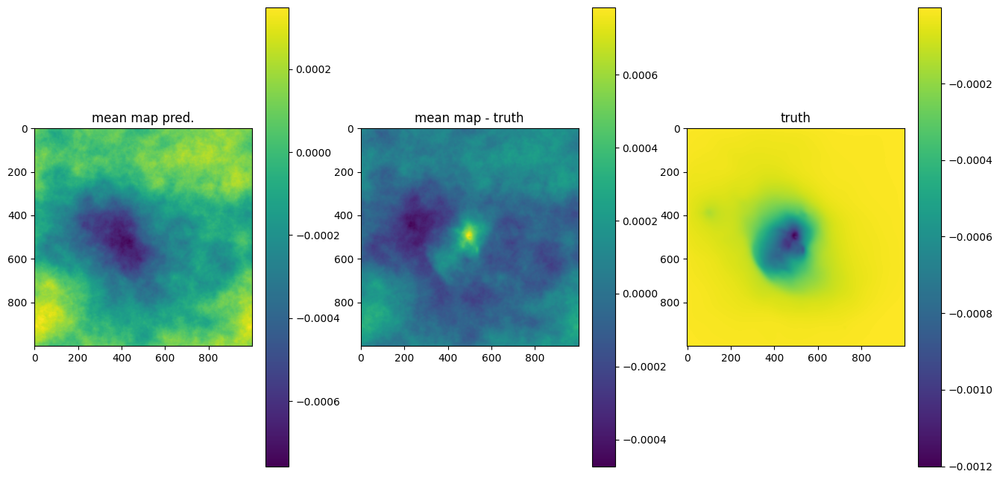

OPTIMIZE_KL: Starting 0013
SL: Iteration 0 ⛰:+2.9285e+15 Δ⛰:inf ➽:1.0320e+01
SL: Iteration 1 ⛰:+2.0213e+15 Δ⛰:9.0726e+14 ➽:1.0320e+01
SL: Iteration 2 ⛰:+1.1759e+15 Δ⛰:8.4540e+14 ➽:1.0320e+01
SL: Iteration 3 ⛰:+7.5132e+14 Δ⛰:4.2457e+14 ➽:1.0320e+01
SL: Iteration 4 ⛰:+3.6863e+14 Δ⛰:3.8269e+14 ➽:1.0320e+01
SL: Iteration 5 ⛰:+2.6854e+14 Δ⛰:1.0008e+14 ➽:1.0320e+01
SL: Iteration 6 ⛰:+2.1412e+14 Δ⛰:5.4419e+13 ➽:1.0320e+01
SL: Iteration 7 ⛰:+1.3169e+14 Δ⛰:8.2439e+13 ➽:1.0320e+01
SL: Iteration 8 ⛰:+1.3160e+14 Δ⛰:8.5486e+10 ➽:1.0320e+01
SL: Iteration 9 ⛰:+1.0318e+14 Δ⛰:2.8418e+13 ➽:1.0320e+01
SL: Iteration 10 ⛰:+8.4691e+13 Δ⛰:1.8491e+13 ➽:1.0320e+01
SL: Iteration 11 ⛰:+5.2381e+13 Δ⛰:3.2310e+13 ➽:1.0320e+01
SL: Iteration 12 ⛰:+4.4147e+13 Δ⛰:8.2340e+12 ➽:1.0320e+01
SL: Iteration 13 ⛰:+4.3712e+13 Δ⛰:4.3529e+11 ➽:1.0320e+01
SL: Iteration 14 ⛰:+4.3563e+13 Δ⛰:1.4854e+11 ➽:1.0320e+01
SL: Iteration 15 ⛰:+3.7551e+13 Δ⛰:6.0123e+12 ➽:1.0320e+01
SL: Iteration 16 ⛰:+3.2049e+13 Δ⛰:5.5022e+12 ➽:1.0320e+01
SL: 

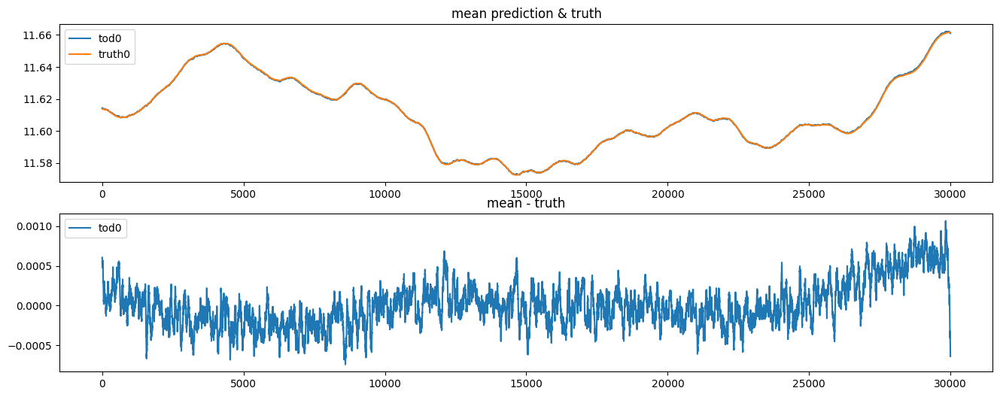

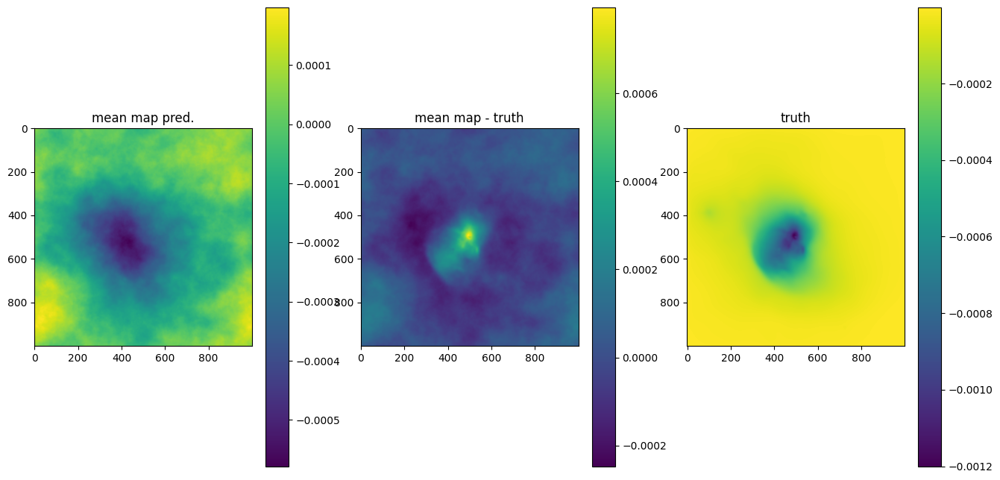

OPTIMIZE_KL: Starting 0014
SL: Iteration 0 ⛰:+6.2022e+16 Δ⛰:inf ➽:1.0320e+01
SL: Iteration 1 ⛰:+2.8779e+15 Δ⛰:5.9144e+16 ➽:1.0320e+01
SL: Iteration 2 ⛰:+3.3629e+14 Δ⛰:2.5416e+15 ➽:1.0320e+01
SL: Iteration 3 ⛰:+2.6416e+14 Δ⛰:7.2136e+13 ➽:1.0320e+01
SL: Iteration 4 ⛰:+1.5058e+14 Δ⛰:1.1358e+14 ➽:1.0320e+01
SL: Iteration 5 ⛰:+1.2598e+14 Δ⛰:2.4601e+13 ➽:1.0320e+01
SL: Iteration 6 ⛰:+9.7750e+13 Δ⛰:2.8225e+13 ➽:1.0320e+01
SL: Iteration 7 ⛰:+9.5917e+13 Δ⛰:1.8331e+12 ➽:1.0320e+01
SL: Iteration 8 ⛰:+7.2490e+13 Δ⛰:2.3427e+13 ➽:1.0320e+01
SL: Iteration 9 ⛰:+5.9627e+13 Δ⛰:1.2863e+13 ➽:1.0320e+01
SL: Iteration 10 ⛰:+4.0707e+13 Δ⛰:1.8920e+13 ➽:1.0320e+01
SL: Iteration 11 ⛰:+3.5231e+13 Δ⛰:5.4759e+12 ➽:1.0320e+01
SL: Iteration 12 ⛰:+3.3213e+13 Δ⛰:2.0182e+12 ➽:1.0320e+01
SL: Iteration 13 ⛰:+3.3146e+13 Δ⛰:6.6752e+10 ➽:1.0320e+01
SL: Iteration 14 ⛰:+3.2986e+13 Δ⛰:1.6033e+11 ➽:1.0320e+01
SL: Iteration 15 ⛰:+2.6961e+13 Δ⛰:6.0250e+12 ➽:1.0320e+01
SL: Iteration 16 ⛰:+2.2776e+13 Δ⛰:4.1848e+12 ➽:1.0320e+01
SL: 

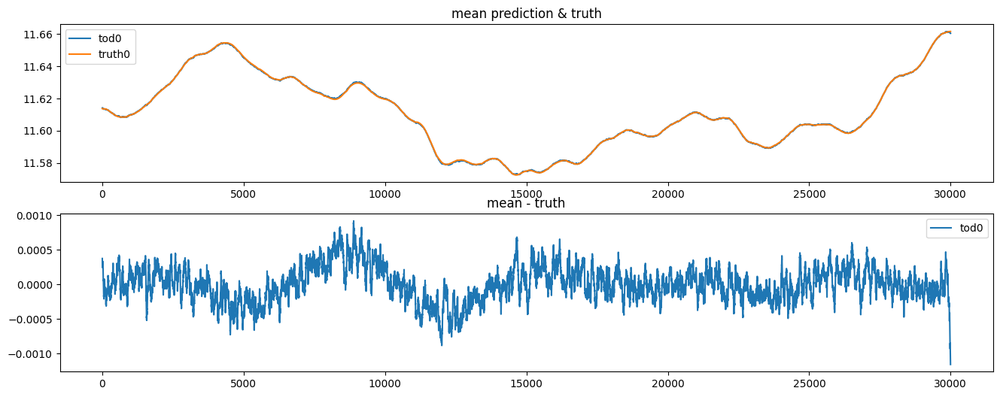

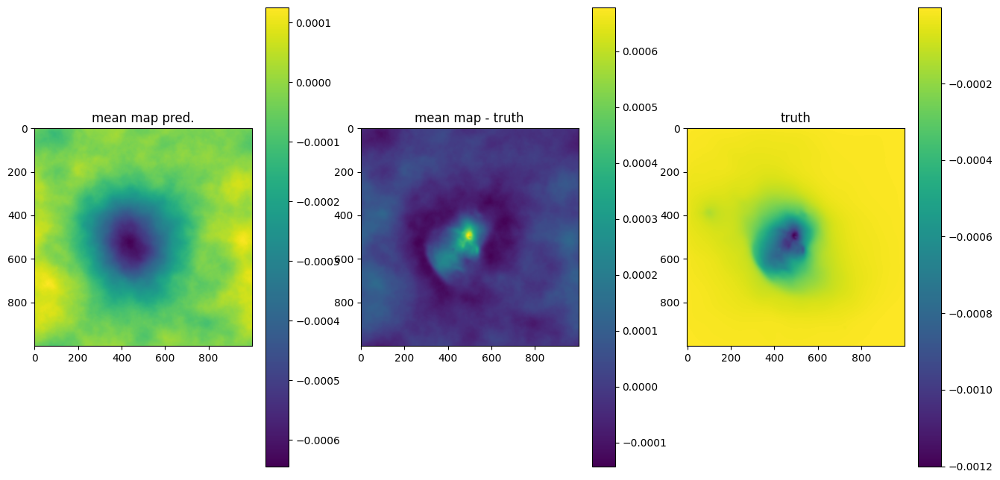

OPTIMIZE_KL: Starting 0015
SL: Iteration 0 ⛰:+4.7619e+15 Δ⛰:inf ➽:1.0320e+01
SL: Iteration 1 ⛰:+4.1004e+15 Δ⛰:6.6146e+14 ➽:1.0320e+01
SL: Iteration 2 ⛰:+1.1598e+15 Δ⛰:2.9406e+15 ➽:1.0320e+01
SL: Iteration 3 ⛰:+4.9559e+14 Δ⛰:6.6420e+14 ➽:1.0320e+01
SL: Iteration 4 ⛰:+2.7142e+14 Δ⛰:2.2417e+14 ➽:1.0320e+01
SL: Iteration 5 ⛰:+1.9349e+14 Δ⛰:7.7931e+13 ➽:1.0320e+01
SL: Iteration 6 ⛰:+1.1112e+14 Δ⛰:8.2371e+13 ➽:1.0320e+01
SL: Iteration 7 ⛰:+8.4990e+13 Δ⛰:2.6127e+13 ➽:1.0320e+01
SL: Iteration 8 ⛰:+8.4266e+13 Δ⛰:7.2385e+11 ➽:1.0320e+01
SL: Iteration 9 ⛰:+6.6068e+13 Δ⛰:1.8197e+13 ➽:1.0320e+01
SL: Iteration 10 ⛰:+3.9083e+13 Δ⛰:2.6986e+13 ➽:1.0320e+01
SL: Iteration 11 ⛰:+3.6411e+13 Δ⛰:2.6712e+12 ➽:1.0320e+01
SL: Iteration 12 ⛰:+3.1138e+13 Δ⛰:5.2735e+12 ➽:1.0320e+01
SL: Iteration 13 ⛰:+3.0371e+13 Δ⛰:7.6714e+11 ➽:1.0320e+01
SL: Iteration 14 ⛰:+2.7358e+13 Δ⛰:3.0125e+12 ➽:1.0320e+01
SL: Iteration 15 ⛰:+2.6901e+13 Δ⛰:4.5751e+11 ➽:1.0320e+01
SL: Iteration 16 ⛰:+2.1832e+13 Δ⛰:5.0691e+12 ➽:1.0320e+01
SL: 

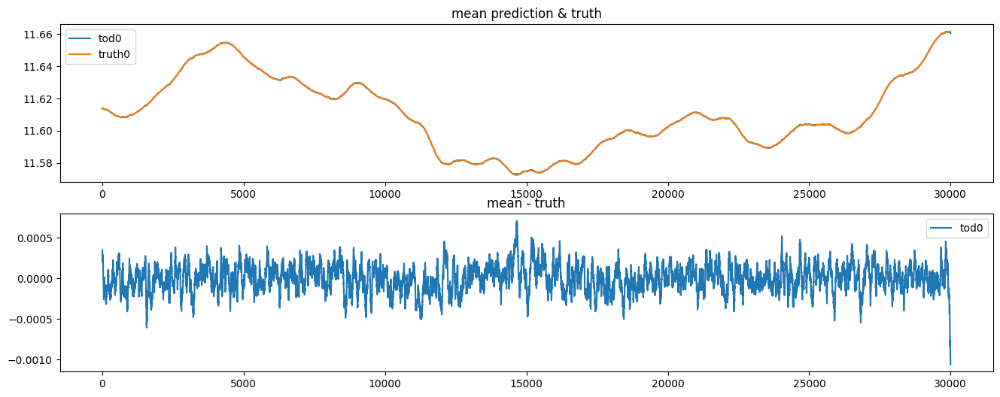

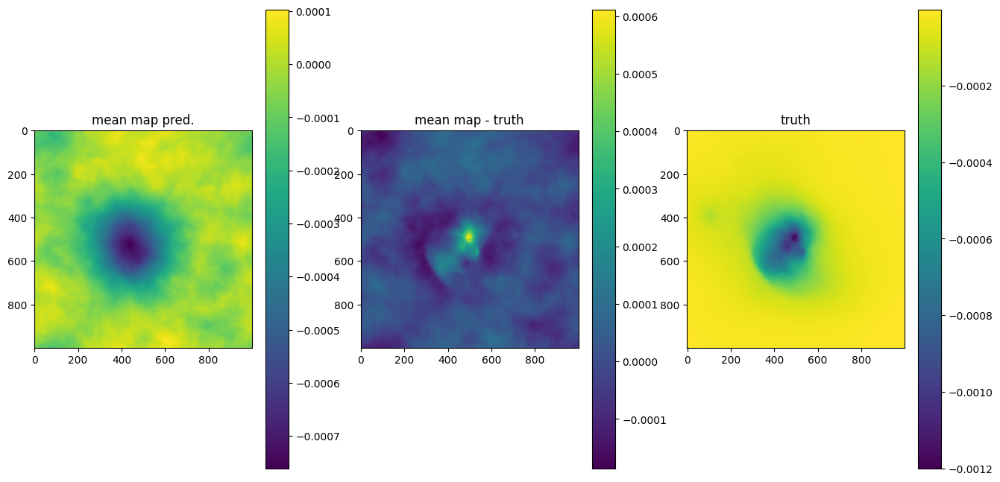

OPTIMIZE_KL: Starting 0016
SL: Iteration 0 ⛰:+1.8985e+16 Δ⛰:inf ➽:1.0320e+01
SL: Iteration 1 ⛰:+5.6510e+15 Δ⛰:1.3334e+16 ➽:1.0320e+01
SL: Iteration 2 ⛰:+1.5751e+15 Δ⛰:4.0759e+15 ➽:1.0320e+01
SL: Iteration 3 ⛰:+4.9149e+14 Δ⛰:1.0836e+15 ➽:1.0320e+01
SL: Iteration 4 ⛰:+2.2399e+14 Δ⛰:2.6750e+14 ➽:1.0320e+01
SL: Iteration 5 ⛰:+1.8959e+14 Δ⛰:3.4399e+13 ➽:1.0320e+01
SL: Iteration 6 ⛰:+1.3298e+14 Δ⛰:5.6610e+13 ➽:1.0320e+01
SL: Iteration 7 ⛰:+6.5513e+13 Δ⛰:6.7466e+13 ➽:1.0320e+01
SL: Iteration 8 ⛰:+6.5318e+13 Δ⛰:1.9443e+11 ➽:1.0320e+01
SL: Iteration 9 ⛰:+5.8710e+13 Δ⛰:6.6081e+12 ➽:1.0320e+01
SL: Iteration 10 ⛰:+4.3889e+13 Δ⛰:1.4821e+13 ➽:1.0320e+01
SL: Iteration 11 ⛰:+3.6017e+13 Δ⛰:7.8722e+12 ➽:1.0320e+01
SL: Iteration 12 ⛰:+3.3225e+13 Δ⛰:2.7913e+12 ➽:1.0320e+01
SL: Iteration 13 ⛰:+3.2906e+13 Δ⛰:3.1959e+11 ➽:1.0320e+01
SL: Iteration 14 ⛰:+3.1826e+13 Δ⛰:1.0797e+12 ➽:1.0320e+01
SL: Iteration 15 ⛰:+2.6296e+13 Δ⛰:5.5297e+12 ➽:1.0320e+01
SL: Iteration 16 ⛰:+2.1161e+13 Δ⛰:5.1350e+12 ➽:1.0320e+01
SL: 

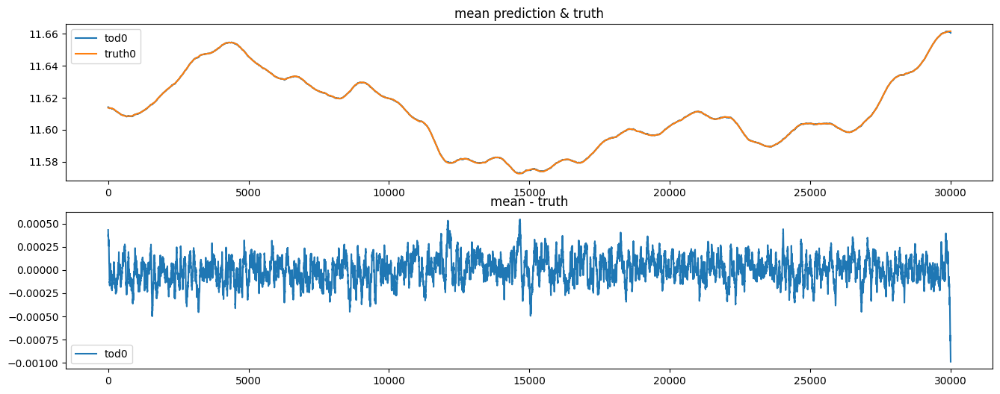

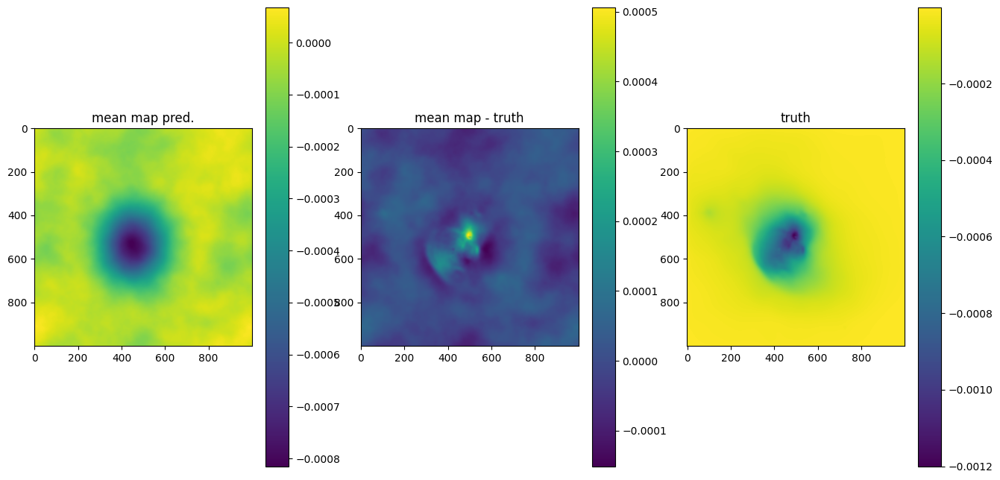

OPTIMIZE_KL: Starting 0017
SL: Iteration 0 ⛰:+2.4322e+17 Δ⛰:inf ➽:1.0320e+01
SL: Iteration 1 ⛰:+7.1564e+14 Δ⛰:2.4250e+17 ➽:1.0320e+01
SL: Iteration 2 ⛰:+4.9502e+14 Δ⛰:2.2062e+14 ➽:1.0320e+01
SL: Iteration 3 ⛰:+3.4032e+14 Δ⛰:1.5470e+14 ➽:1.0320e+01
SL: Iteration 4 ⛰:+1.8477e+14 Δ⛰:1.5556e+14 ➽:1.0320e+01
SL: Iteration 5 ⛰:+1.6218e+14 Δ⛰:2.2591e+13 ➽:1.0320e+01
SL: Iteration 6 ⛰:+1.1271e+14 Δ⛰:4.9468e+13 ➽:1.0320e+01
SL: Iteration 7 ⛰:+1.0041e+14 Δ⛰:1.2300e+13 ➽:1.0320e+01
SL: Iteration 8 ⛰:+9.0639e+13 Δ⛰:9.7696e+12 ➽:1.0320e+01
SL: Iteration 9 ⛰:+6.4799e+13 Δ⛰:2.5840e+13 ➽:1.0320e+01
SL: Iteration 10 ⛰:+4.7552e+13 Δ⛰:1.7247e+13 ➽:1.0320e+01
SL: Iteration 11 ⛰:+4.1648e+13 Δ⛰:5.9046e+12 ➽:1.0320e+01
SL: Iteration 12 ⛰:+3.4040e+13 Δ⛰:7.6075e+12 ➽:1.0320e+01
SL: Iteration 13 ⛰:+3.2519e+13 Δ⛰:1.5207e+12 ➽:1.0320e+01
SL: Iteration 14 ⛰:+3.2280e+13 Δ⛰:2.3993e+11 ➽:1.0320e+01
SL: Iteration 15 ⛰:+2.7218e+13 Δ⛰:5.0612e+12 ➽:1.0320e+01
SL: Iteration 16 ⛰:+2.1233e+13 Δ⛰:5.9851e+12 ➽:1.0320e+01
SL: 

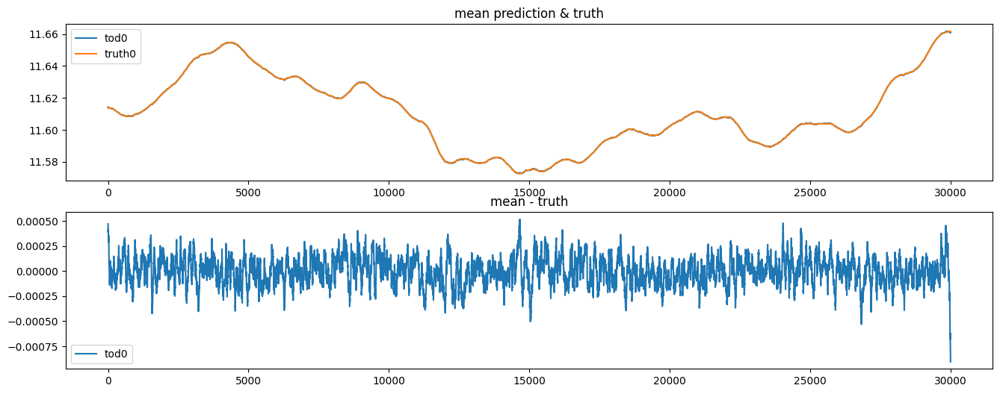

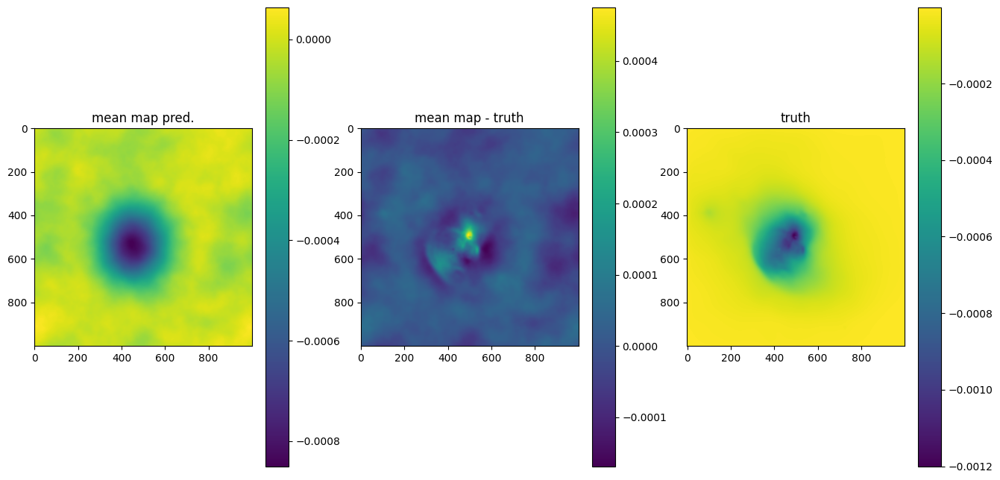

OPTIMIZE_KL: Starting 0018
SL: Iteration 0 ⛰:+2.1399e+16 Δ⛰:inf ➽:1.0320e+01
SL: Iteration 1 ⛰:+1.5175e+15 Δ⛰:1.9882e+16 ➽:1.0320e+01
SL: Iteration 2 ⛰:+8.7963e+14 Δ⛰:6.3783e+14 ➽:1.0320e+01
SL: Iteration 3 ⛰:+4.5665e+14 Δ⛰:4.2298e+14 ➽:1.0320e+01
SL: Iteration 4 ⛰:+2.6225e+14 Δ⛰:1.9441e+14 ➽:1.0320e+01
SL: Iteration 5 ⛰:+2.4056e+14 Δ⛰:2.1684e+13 ➽:1.0320e+01
SL: Iteration 6 ⛰:+1.2182e+14 Δ⛰:1.1875e+14 ➽:1.0320e+01
SL: Iteration 7 ⛰:+9.0509e+13 Δ⛰:3.1310e+13 ➽:1.0320e+01
SL: Iteration 8 ⛰:+9.0223e+13 Δ⛰:2.8565e+11 ➽:1.0320e+01
SL: Iteration 9 ⛰:+6.1539e+13 Δ⛰:2.8684e+13 ➽:1.0320e+01
SL: Iteration 10 ⛰:+4.2905e+13 Δ⛰:1.8635e+13 ➽:1.0320e+01
SL: Iteration 11 ⛰:+3.7448e+13 Δ⛰:5.4562e+12 ➽:1.0320e+01
SL: Iteration 12 ⛰:+2.4137e+13 Δ⛰:1.3311e+13 ➽:1.0320e+01
SL: Iteration 13 ⛰:+2.4061e+13 Δ⛰:7.6121e+10 ➽:1.0320e+01
SL: Iteration 14 ⛰:+2.3908e+13 Δ⛰:1.5228e+11 ➽:1.0320e+01
SL: Iteration 15 ⛰:+1.9731e+13 Δ⛰:4.1778e+12 ➽:1.0320e+01
SL: Iteration 16 ⛰:+1.8683e+13 Δ⛰:1.0480e+12 ➽:1.0320e+01
SL: 

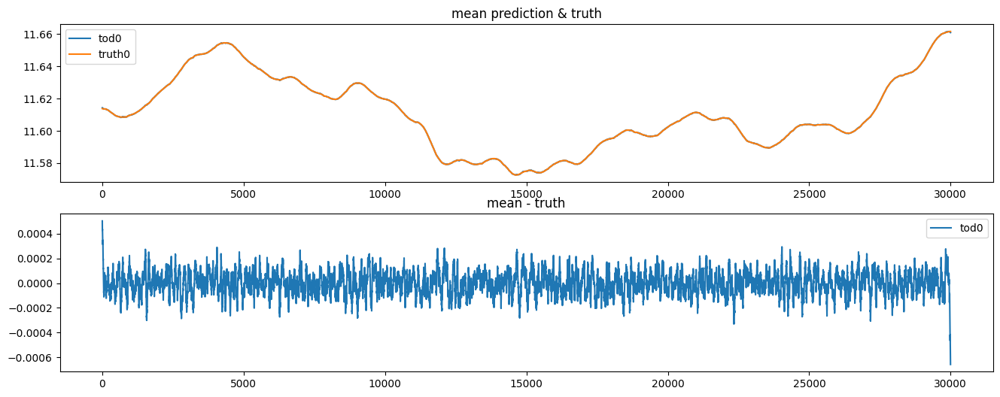

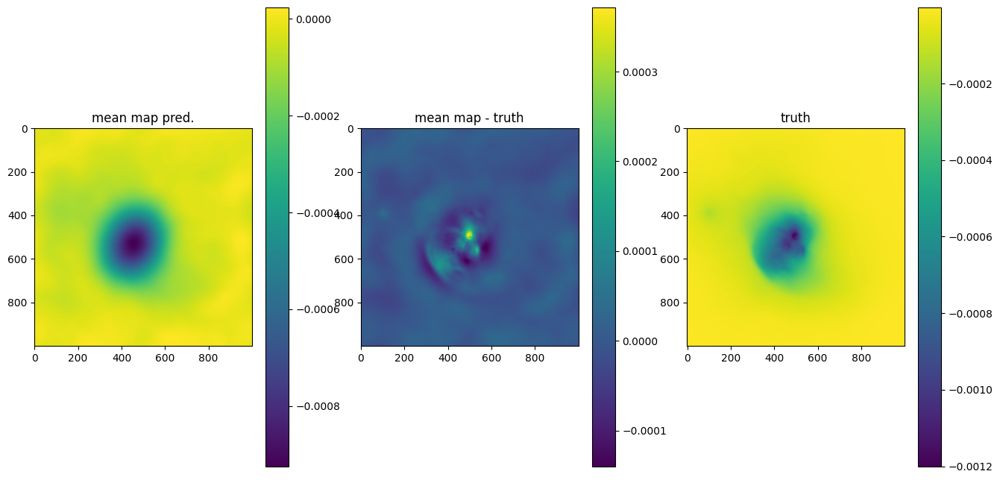

OPTIMIZE_KL: Starting 0019
SL: Iteration 0 ⛰:+3.7109e+15 Δ⛰:inf ➽:1.0320e+01
SL: Iteration 1 ⛰:+2.8934e+15 Δ⛰:8.1748e+14 ➽:1.0320e+01
SL: Iteration 2 ⛰:+1.1432e+15 Δ⛰:1.7502e+15 ➽:1.0320e+01
SL: Iteration 3 ⛰:+2.5156e+14 Δ⛰:8.9164e+14 ➽:1.0320e+01
SL: Iteration 4 ⛰:+1.8475e+14 Δ⛰:6.6802e+13 ➽:1.0320e+01
SL: Iteration 5 ⛰:+1.4123e+14 Δ⛰:4.3521e+13 ➽:1.0320e+01
SL: Iteration 6 ⛰:+9.7584e+13 Δ⛰:4.3649e+13 ➽:1.0320e+01
SL: Iteration 7 ⛰:+6.6100e+13 Δ⛰:3.1484e+13 ➽:1.0320e+01
SL: Iteration 8 ⛰:+6.6070e+13 Δ⛰:3.0285e+10 ➽:1.0320e+01
SL: Iteration 9 ⛰:+4.7605e+13 Δ⛰:1.8465e+13 ➽:1.0320e+01
SL: Iteration 10 ⛰:+4.0753e+13 Δ⛰:6.8512e+12 ➽:1.0320e+01
SL: Iteration 11 ⛰:+2.8989e+13 Δ⛰:1.1764e+13 ➽:1.0320e+01
SL: Iteration 12 ⛰:+2.3896e+13 Δ⛰:5.0930e+12 ➽:1.0320e+01
SL: Iteration 13 ⛰:+2.3818e+13 Δ⛰:7.8303e+10 ➽:1.0320e+01
SL: Iteration 14 ⛰:+2.3747e+13 Δ⛰:7.0525e+10 ➽:1.0320e+01
SL: Iteration 15 ⛰:+2.0724e+13 Δ⛰:3.0231e+12 ➽:1.0320e+01
SL: Iteration 16 ⛰:+1.8489e+13 Δ⛰:2.2350e+12 ➽:1.0320e+01
SL: 

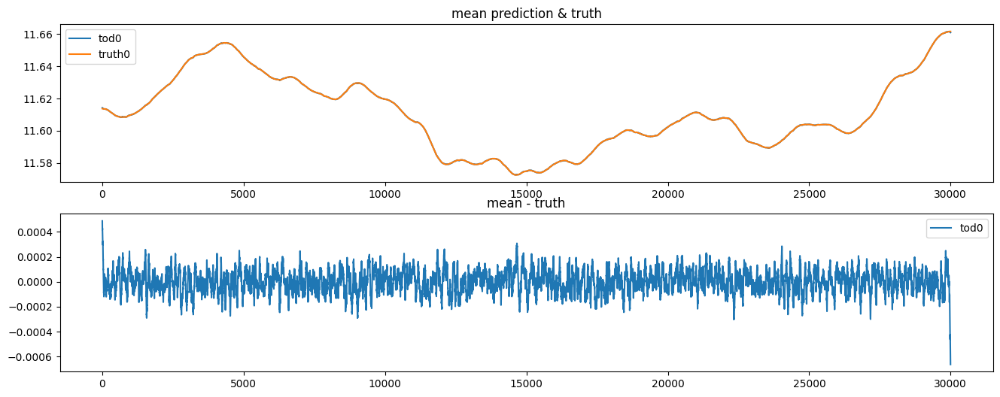

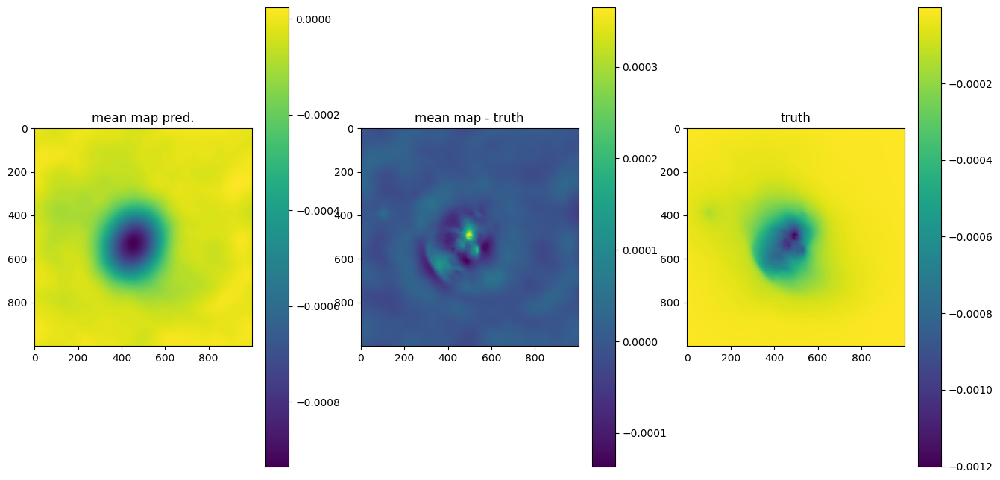

OPTIMIZE_KL: Starting 0020
SL: Iteration 0 ⛰:+5.3903e+15 Δ⛰:inf ➽:1.0320e+01
SL: Iteration 1 ⛰:+3.7728e+15 Δ⛰:1.6175e+15 ➽:1.0320e+01
SL: Iteration 2 ⛰:+1.8053e+15 Δ⛰:1.9675e+15 ➽:1.0320e+01
SL: Iteration 3 ⛰:+7.3025e+14 Δ⛰:1.0751e+15 ➽:1.0320e+01
SL: Iteration 4 ⛰:+2.6508e+14 Δ⛰:4.6517e+14 ➽:1.0320e+01
SL: Iteration 5 ⛰:+2.2888e+14 Δ⛰:3.6200e+13 ➽:1.0320e+01
SL: Iteration 6 ⛰:+1.3111e+14 Δ⛰:9.7766e+13 ➽:1.0320e+01
SL: Iteration 7 ⛰:+9.5638e+13 Δ⛰:3.5472e+13 ➽:1.0320e+01
SL: Iteration 8 ⛰:+9.5473e+13 Δ⛰:1.6541e+11 ➽:1.0320e+01
SL: Iteration 9 ⛰:+5.8439e+13 Δ⛰:3.7034e+13 ➽:1.0320e+01
SL: Iteration 10 ⛰:+4.8354e+13 Δ⛰:1.0085e+13 ➽:1.0320e+01
SL: Iteration 11 ⛰:+3.7608e+13 Δ⛰:1.0746e+13 ➽:1.0320e+01
SL: Iteration 12 ⛰:+2.9254e+13 Δ⛰:8.3539e+12 ➽:1.0320e+01
SL: Iteration 13 ⛰:+2.8347e+13 Δ⛰:9.0687e+11 ➽:1.0320e+01
SL: Iteration 14 ⛰:+2.5456e+13 Δ⛰:2.8913e+12 ➽:1.0320e+01
SL: Iteration 15 ⛰:+2.3580e+13 Δ⛰:1.8763e+12 ➽:1.0320e+01
SL: Iteration 16 ⛰:+2.0830e+13 Δ⛰:2.7492e+12 ➽:1.0320e+01
SL: 

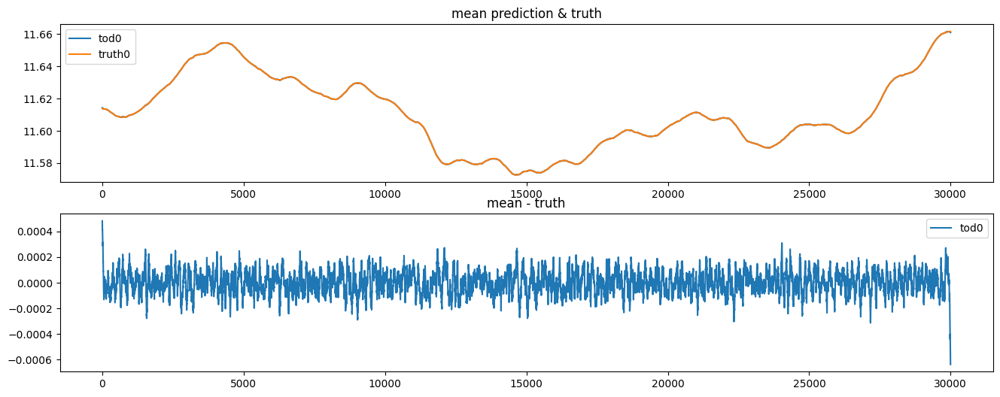

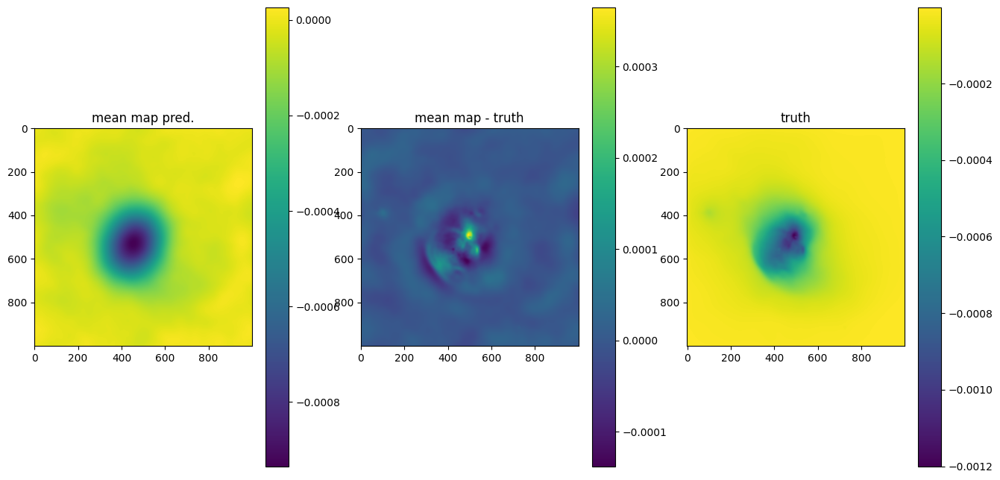

OPTIMIZE_KL: Starting 0021
SL: Iteration 0 ⛰:+8.8750e+15 Δ⛰:inf ➽:1.0320e+01
SL: Iteration 1 ⛰:+1.9330e+15 Δ⛰:6.9420e+15 ➽:1.0320e+01
SL: Iteration 2 ⛰:+1.3065e+15 Δ⛰:6.2649e+14 ➽:1.0320e+01
SL: Iteration 3 ⛰:+7.5214e+14 Δ⛰:5.5432e+14 ➽:1.0320e+01
SL: Iteration 4 ⛰:+2.1252e+14 Δ⛰:5.3962e+14 ➽:1.0320e+01
SL: Iteration 5 ⛰:+1.8639e+14 Δ⛰:2.6130e+13 ➽:1.0320e+01
SL: Iteration 6 ⛰:+1.2553e+14 Δ⛰:6.0864e+13 ➽:1.0320e+01
SL: Iteration 7 ⛰:+8.6796e+13 Δ⛰:3.8731e+13 ➽:1.0320e+01
SL: Iteration 8 ⛰:+8.6738e+13 Δ⛰:5.7797e+10 ➽:1.0320e+01
SL: Iteration 9 ⛰:+5.9593e+13 Δ⛰:2.7145e+13 ➽:1.0320e+01
SL: Iteration 10 ⛰:+4.3898e+13 Δ⛰:1.5695e+13 ➽:1.0320e+01
SL: Iteration 11 ⛰:+3.1549e+13 Δ⛰:1.2349e+13 ➽:1.0320e+01
SL: Iteration 12 ⛰:+2.5701e+13 Δ⛰:5.8484e+12 ➽:1.0320e+01
SL: Iteration 13 ⛰:+2.5623e+13 Δ⛰:7.7885e+10 ➽:1.0320e+01
SL: Iteration 14 ⛰:+2.2009e+13 Δ⛰:3.6145e+12 ➽:1.0320e+01
SL: Iteration 15 ⛰:+2.1995e+13 Δ⛰:1.3392e+10 ➽:1.0320e+01
SL: Iteration 16 ⛰:+2.0072e+13 Δ⛰:1.9237e+12 ➽:1.0320e+01
SL: 

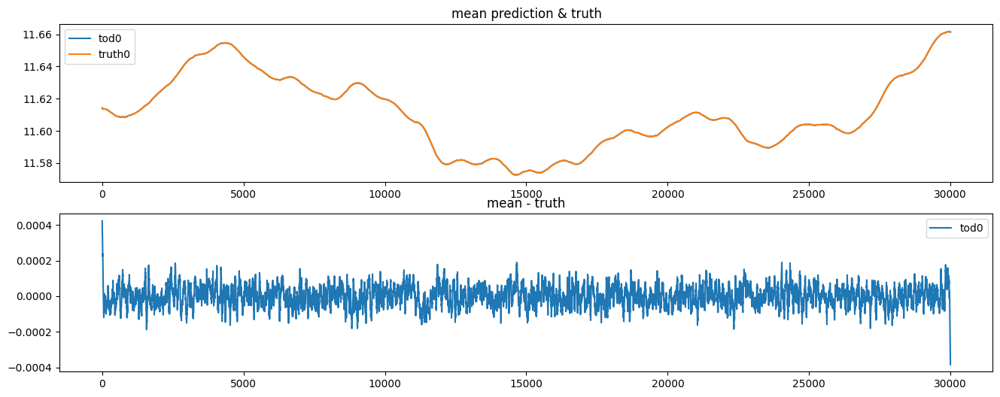

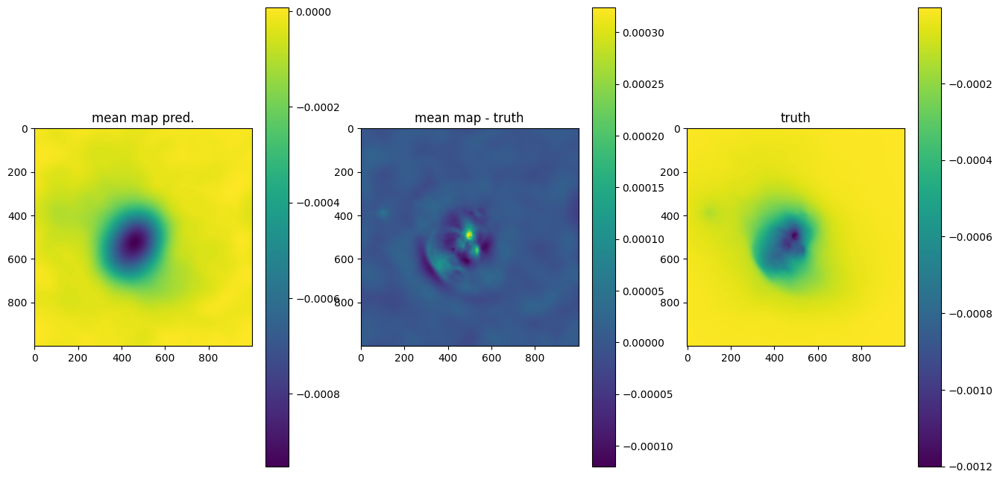

OPTIMIZE_KL: Starting 0022
SL: Iteration 0 ⛰:+1.3131e+17 Δ⛰:inf ➽:1.0320e+01
SL: Iteration 1 ⛰:+8.3284e+14 Δ⛰:1.3047e+17 ➽:1.0320e+01
SL: Iteration 2 ⛰:+5.8124e+14 Δ⛰:2.5160e+14 ➽:1.0320e+01
SL: Iteration 3 ⛰:+3.8581e+14 Δ⛰:1.9543e+14 ➽:1.0320e+01
SL: Iteration 4 ⛰:+1.5802e+14 Δ⛰:2.2780e+14 ➽:1.0320e+01
SL: Iteration 5 ⛰:+1.4337e+14 Δ⛰:1.4644e+13 ➽:1.0320e+01
SL: Iteration 6 ⛰:+1.1014e+14 Δ⛰:3.3230e+13 ➽:1.0320e+01
SL: Iteration 7 ⛰:+8.0652e+13 Δ⛰:2.9490e+13 ➽:1.0320e+01
SL: Iteration 8 ⛰:+7.0086e+13 Δ⛰:1.0566e+13 ➽:1.0320e+01
SL: Iteration 9 ⛰:+5.0516e+13 Δ⛰:1.9570e+13 ➽:1.0320e+01
SL: Iteration 10 ⛰:+3.5503e+13 Δ⛰:1.5013e+13 ➽:1.0320e+01
SL: Iteration 11 ⛰:+2.2852e+13 Δ⛰:1.2651e+13 ➽:1.0320e+01
SL: Iteration 12 ⛰:+2.0499e+13 Δ⛰:2.3532e+12 ➽:1.0320e+01
SL: Iteration 13 ⛰:+2.0438e+13 Δ⛰:6.0647e+10 ➽:1.0320e+01
SL: Iteration 14 ⛰:+1.9824e+13 Δ⛰:6.1447e+11 ➽:1.0320e+01
SL: Iteration 15 ⛰:+1.6513e+13 Δ⛰:3.3105e+12 ➽:1.0320e+01
SL: Iteration 16 ⛰:+1.5413e+13 Δ⛰:1.1002e+12 ➽:1.0320e+01
SL: 

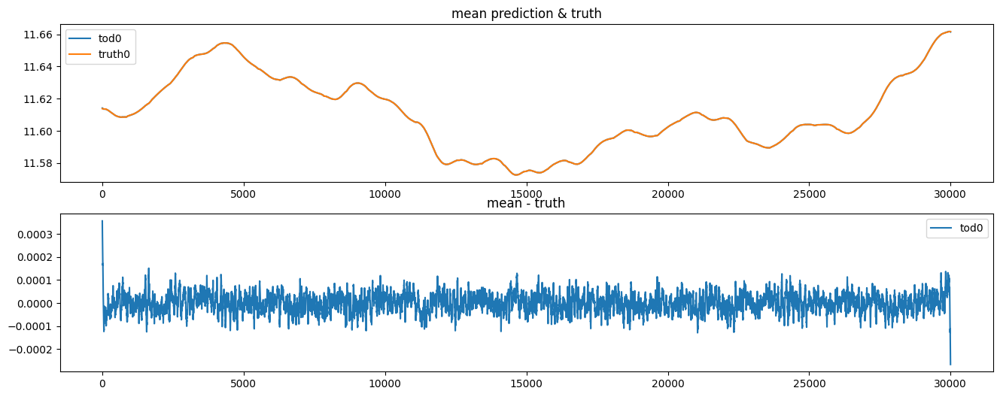

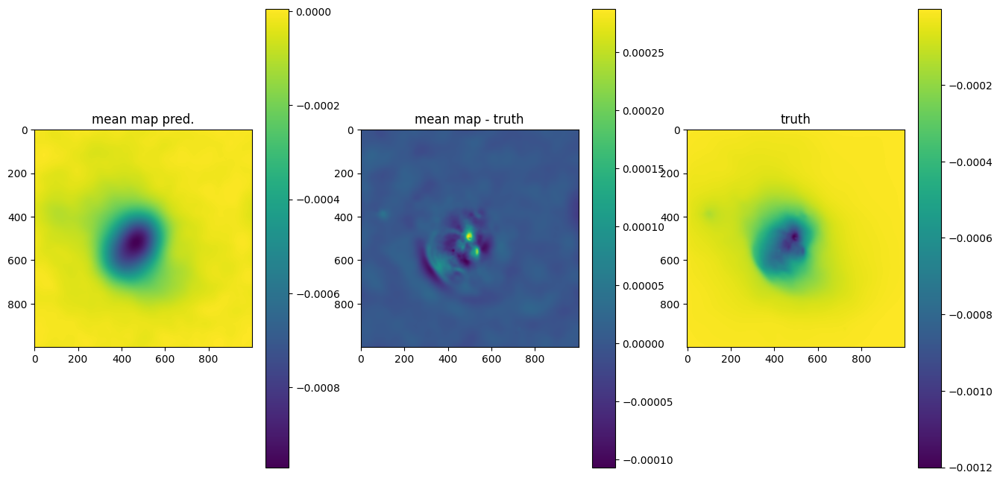

OPTIMIZE_KL: Starting 0023
SL: Iteration 0 ⛰:+8.7890e+16 Δ⛰:inf ➽:1.0320e+01
SL: Iteration 1 ⛰:+1.0004e+16 Δ⛰:7.7887e+16 ➽:1.0320e+01
SL: Iteration 2 ⛰:+9.7831e+14 Δ⛰:9.0252e+15 ➽:1.0320e+01
SL: Iteration 3 ⛰:+4.0526e+14 Δ⛰:5.7305e+14 ➽:1.0320e+01
SL: Iteration 4 ⛰:+1.8613e+14 Δ⛰:2.1913e+14 ➽:1.0320e+01
SL: Iteration 5 ⛰:+1.2990e+14 Δ⛰:5.6227e+13 ➽:1.0320e+01
SL: Iteration 6 ⛰:+9.2322e+13 Δ⛰:3.7580e+13 ➽:1.0320e+01
SL: Iteration 7 ⛰:+7.1019e+13 Δ⛰:2.1303e+13 ➽:1.0320e+01
SL: Iteration 8 ⛰:+6.9764e+13 Δ⛰:1.2550e+12 ➽:1.0320e+01
SL: Iteration 9 ⛰:+4.5413e+13 Δ⛰:2.4351e+13 ➽:1.0320e+01
SL: Iteration 10 ⛰:+3.8565e+13 Δ⛰:6.8486e+12 ➽:1.0320e+01
SL: Iteration 11 ⛰:+2.8944e+13 Δ⛰:9.6210e+12 ➽:1.0320e+01
SL: Iteration 12 ⛰:+2.3866e+13 Δ⛰:5.0776e+12 ➽:1.0320e+01
SL: Iteration 13 ⛰:+2.3661e+13 Δ⛰:2.0521e+11 ➽:1.0320e+01
SL: Iteration 14 ⛰:+2.3655e+13 Δ⛰:5.7729e+09 ➽:1.0320e+01
SL: Iteration 15 ⛰:+2.0064e+13 Δ⛰:3.5910e+12 ➽:1.0320e+01
SL: Iteration 16 ⛰:+1.6278e+13 Δ⛰:3.7864e+12 ➽:1.0320e+01
SL: 

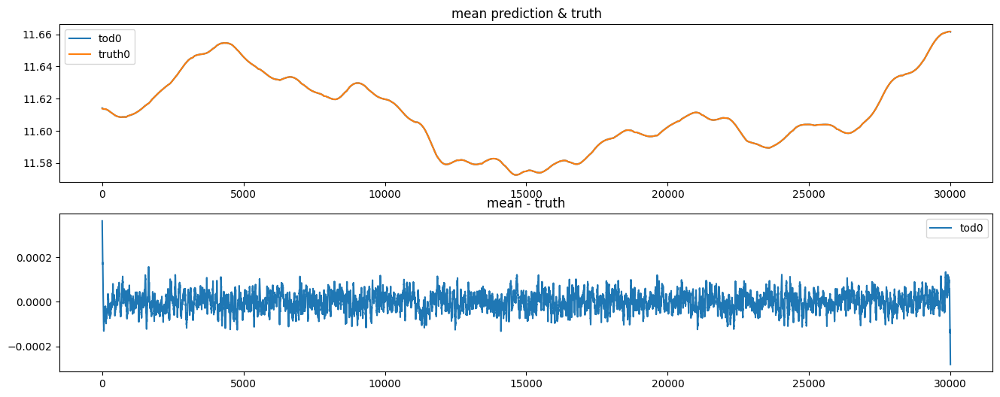

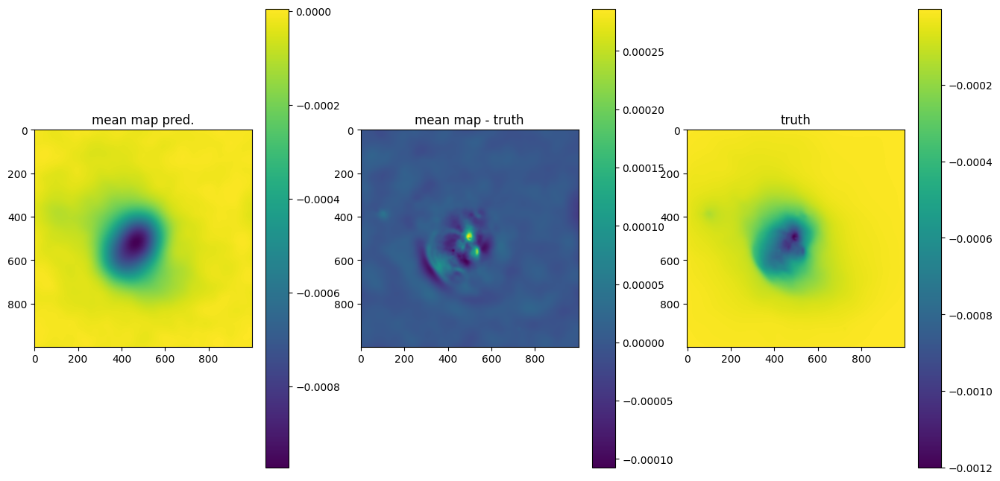

OPTIMIZE_KL: Starting 0024
SL: Iteration 0 ⛰:+1.2979e+17 Δ⛰:inf ➽:1.0320e+01
SL: Iteration 1 ⛰:+1.6367e+15 Δ⛰:1.2815e+17 ➽:1.0320e+01
SL: Iteration 2 ⛰:+6.9126e+14 Δ⛰:9.4546e+14 ➽:1.0320e+01
SL: Iteration 3 ⛰:+4.8423e+14 Δ⛰:2.0703e+14 ➽:1.0320e+01
SL: Iteration 4 ⛰:+1.7535e+14 Δ⛰:3.0888e+14 ➽:1.0320e+01
SL: Iteration 5 ⛰:+1.0052e+14 Δ⛰:7.4832e+13 ➽:1.0320e+01
SL: Iteration 6 ⛰:+6.1375e+13 Δ⛰:3.9147e+13 ➽:1.0320e+01
SL: Iteration 7 ⛰:+4.5908e+13 Δ⛰:1.5467e+13 ➽:1.0320e+01
SL: Iteration 8 ⛰:+4.5783e+13 Δ⛰:1.2466e+11 ➽:1.0320e+01
SL: Iteration 9 ⛰:+3.4621e+13 Δ⛰:1.1163e+13 ➽:1.0320e+01
SL: Iteration 10 ⛰:+2.6090e+13 Δ⛰:8.5302e+12 ➽:1.0320e+01
SL: Iteration 11 ⛰:+2.3315e+13 Δ⛰:2.7754e+12 ➽:1.0320e+01
SL: Iteration 12 ⛰:+2.0849e+13 Δ⛰:2.4662e+12 ➽:1.0320e+01
SL: Iteration 13 ⛰:+1.7876e+13 Δ⛰:2.9726e+12 ➽:1.0320e+01
SL: Iteration 14 ⛰:+1.7726e+13 Δ⛰:1.5006e+11 ➽:1.0320e+01
SL: Iteration 15 ⛰:+1.6836e+13 Δ⛰:8.8985e+11 ➽:1.0320e+01
SL: Iteration 16 ⛰:+1.4077e+13 Δ⛰:2.7595e+12 ➽:1.0320e+01
SL: 

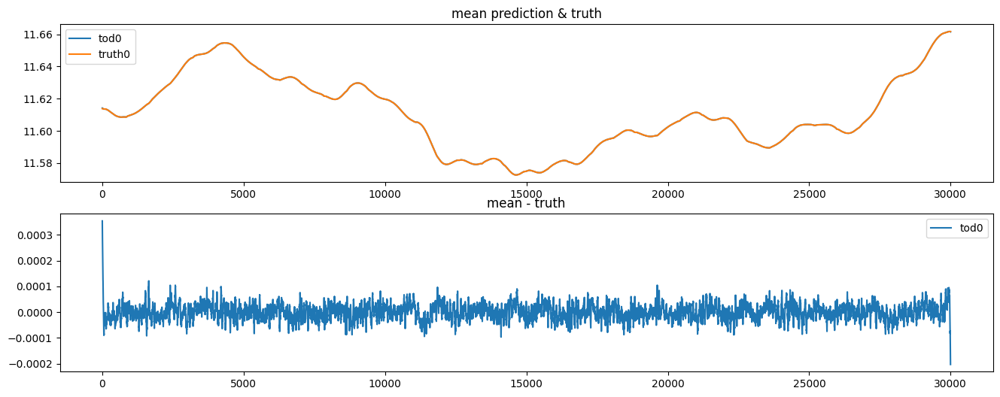

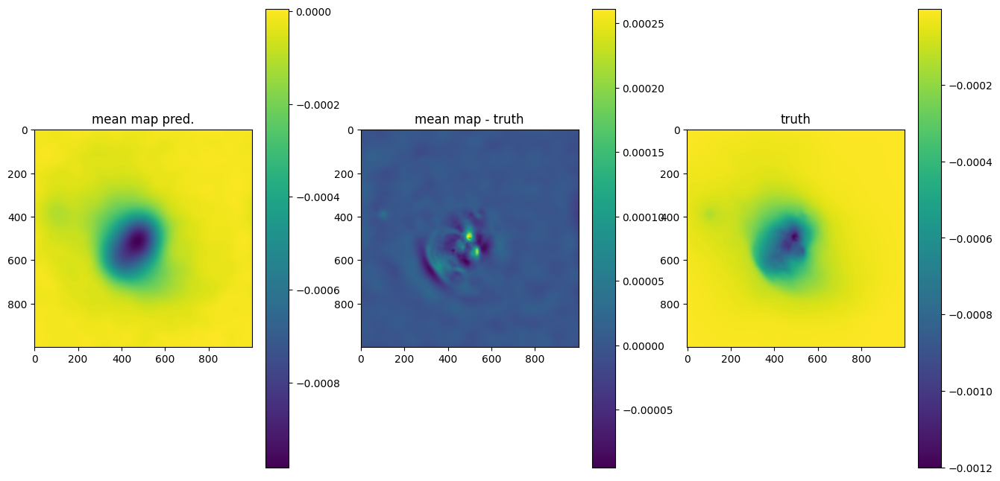

OPTIMIZE_KL: Starting 0025
SL: Iteration 0 ⛰:+2.1273e+17 Δ⛰:inf ➽:1.0320e+01
SL: Iteration 1 ⛰:+3.5767e+15 Δ⛰:2.0915e+17 ➽:1.0320e+01
SL: Iteration 2 ⛰:+1.5654e+15 Δ⛰:2.0113e+15 ➽:1.0320e+01
SL: Iteration 3 ⛰:+6.6571e+14 Δ⛰:8.9972e+14 ➽:1.0320e+01
SL: Iteration 4 ⛰:+2.9794e+14 Δ⛰:3.6777e+14 ➽:1.0320e+01
SL: Iteration 5 ⛰:+1.3171e+14 Δ⛰:1.6624e+14 ➽:1.0320e+01
SL: Iteration 6 ⛰:+8.1467e+13 Δ⛰:5.0242e+13 ➽:1.0320e+01
SL: Iteration 7 ⛰:+5.9770e+13 Δ⛰:2.1697e+13 ➽:1.0320e+01
SL: Iteration 8 ⛰:+5.4990e+13 Δ⛰:4.7802e+12 ➽:1.0320e+01
SL: Iteration 9 ⛰:+3.9759e+13 Δ⛰:1.5231e+13 ➽:1.0320e+01
SL: Iteration 10 ⛰:+3.2225e+13 Δ⛰:7.5336e+12 ➽:1.0320e+01
SL: Iteration 11 ⛰:+2.6676e+13 Δ⛰:5.5495e+12 ➽:1.0320e+01
SL: Iteration 12 ⛰:+2.3370e+13 Δ⛰:3.3058e+12 ➽:1.0320e+01
SL: Iteration 13 ⛰:+2.3297e+13 Δ⛰:7.3035e+10 ➽:1.0320e+01
SL: Iteration 14 ⛰:+2.3282e+13 Δ⛰:1.4446e+10 ➽:1.0320e+01
SL: Iteration 15 ⛰:+1.8350e+13 Δ⛰:4.9322e+12 ➽:1.0320e+01
SL: Iteration 16 ⛰:+1.4708e+13 Δ⛰:3.6416e+12 ➽:1.0320e+01
SL: 

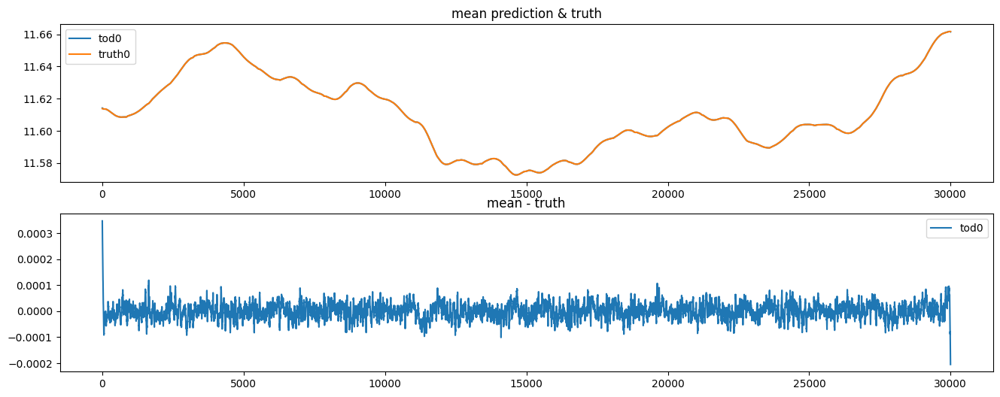

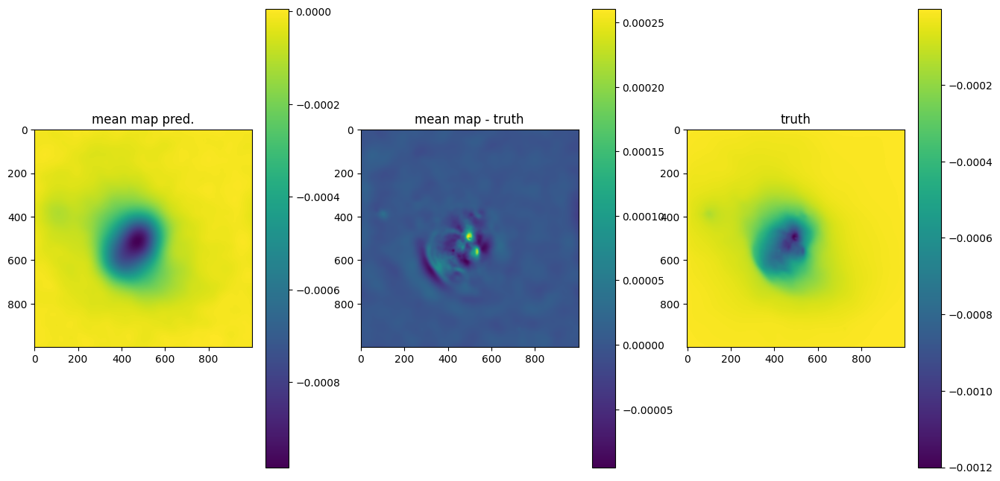

OPTIMIZE_KL: Starting 0026
SL: Iteration 0 ⛰:+2.5845e+17 Δ⛰:inf ➽:1.0320e+01
SL: Iteration 1 ⛰:+2.2716e+15 Δ⛰:2.5617e+17 ➽:1.0320e+01
SL: Iteration 2 ⛰:+9.4218e+14 Δ⛰:1.3294e+15 ➽:1.0320e+01
SL: Iteration 3 ⛰:+4.2213e+14 Δ⛰:5.2005e+14 ➽:1.0320e+01
SL: Iteration 4 ⛰:+1.9048e+14 Δ⛰:2.3165e+14 ➽:1.0320e+01
SL: Iteration 5 ⛰:+1.4692e+14 Δ⛰:4.3557e+13 ➽:1.0320e+01
SL: Iteration 6 ⛰:+7.6738e+13 Δ⛰:7.0182e+13 ➽:1.0320e+01
SL: Iteration 7 ⛰:+6.0663e+13 Δ⛰:1.6076e+13 ➽:1.0320e+01
SL: Iteration 8 ⛰:+5.6199e+13 Δ⛰:4.4635e+12 ➽:1.0320e+01
SL: Iteration 9 ⛰:+3.8319e+13 Δ⛰:1.7880e+13 ➽:1.0320e+01
SL: Iteration 10 ⛰:+2.8934e+13 Δ⛰:9.3843e+12 ➽:1.0320e+01
SL: Iteration 11 ⛰:+2.5565e+13 Δ⛰:3.3699e+12 ➽:1.0320e+01
SL: Iteration 12 ⛰:+2.0085e+13 Δ⛰:5.4794e+12 ➽:1.0320e+01
SL: Iteration 13 ⛰:+2.0070e+13 Δ⛰:1.5588e+10 ➽:1.0320e+01
SL: Iteration 14 ⛰:+1.8729e+13 Δ⛰:1.3408e+12 ➽:1.0320e+01
SL: Iteration 15 ⛰:+1.7792e+13 Δ⛰:9.3638e+11 ➽:1.0320e+01
SL: Iteration 16 ⛰:+1.5097e+13 Δ⛰:2.6952e+12 ➽:1.0320e+01
SL: 

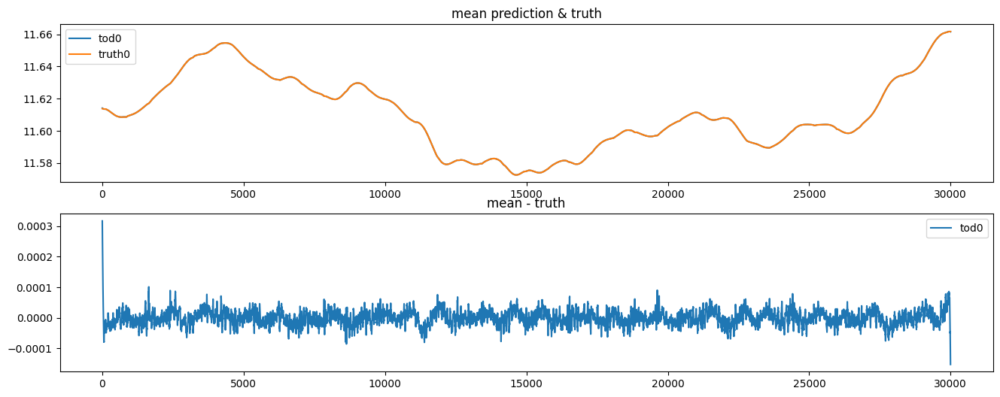

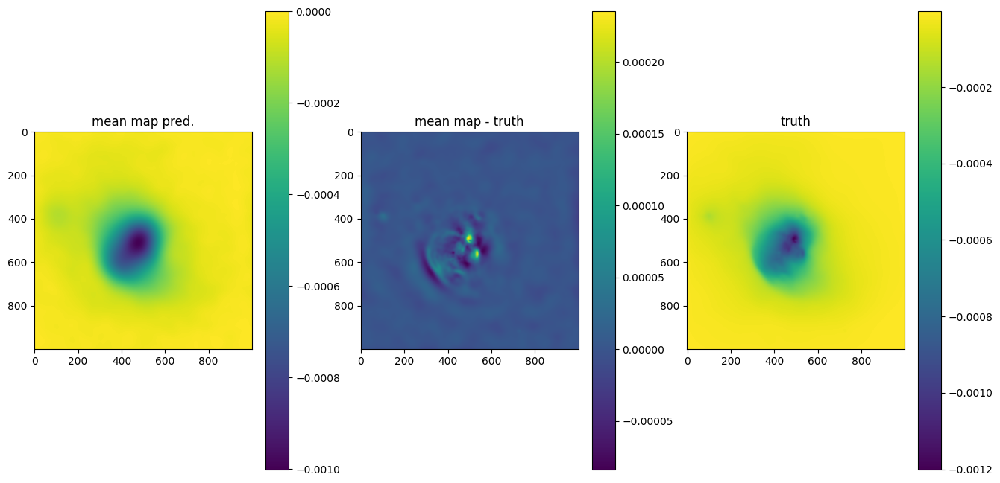

OPTIMIZE_KL: Starting 0027
SL: Iteration 0 ⛰:+2.2004e+17 Δ⛰:inf ➽:1.0320e+01
SL: Iteration 1 ⛰:+9.4669e+15 Δ⛰:2.1057e+17 ➽:1.0320e+01
SL: Iteration 2 ⛰:+1.4315e+15 Δ⛰:8.0354e+15 ➽:1.0320e+01
SL: Iteration 3 ⛰:+2.5236e+14 Δ⛰:1.1792e+15 ➽:1.0320e+01
SL: Iteration 4 ⛰:+1.1549e+14 Δ⛰:1.3687e+14 ➽:1.0320e+01
SL: Iteration 5 ⛰:+7.6265e+13 Δ⛰:3.9227e+13 ➽:1.0320e+01
SL: Iteration 6 ⛰:+5.5414e+13 Δ⛰:2.0851e+13 ➽:1.0320e+01
SL: Iteration 7 ⛰:+5.3006e+13 Δ⛰:2.4079e+12 ➽:1.0320e+01
SL: Iteration 8 ⛰:+4.5774e+13 Δ⛰:7.2327e+12 ➽:1.0320e+01
SL: Iteration 9 ⛰:+3.1372e+13 Δ⛰:1.4402e+13 ➽:1.0320e+01
SL: Iteration 10 ⛰:+2.1825e+13 Δ⛰:9.5473e+12 ➽:1.0320e+01
SL: Iteration 11 ⛰:+1.9099e+13 Δ⛰:2.7260e+12 ➽:1.0320e+01
SL: Iteration 12 ⛰:+1.7017e+13 Δ⛰:2.0818e+12 ➽:1.0320e+01
SL: Iteration 13 ⛰:+1.6877e+13 Δ⛰:1.3951e+11 ➽:1.0320e+01
SL: Iteration 14 ⛰:+1.6202e+13 Δ⛰:6.7527e+11 ➽:1.0320e+01
SL: Iteration 15 ⛰:+1.5113e+13 Δ⛰:1.0886e+12 ➽:1.0320e+01
SL: Iteration 16 ⛰:+1.1149e+13 Δ⛰:3.9647e+12 ➽:1.0320e+01
SL: 

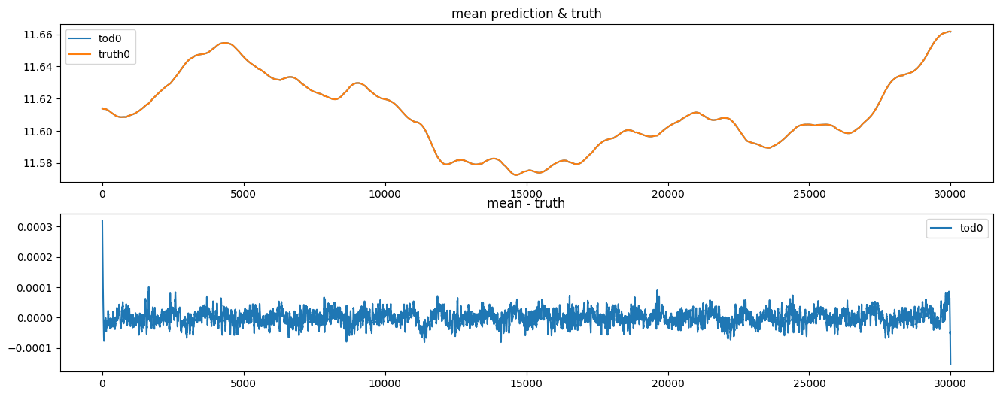

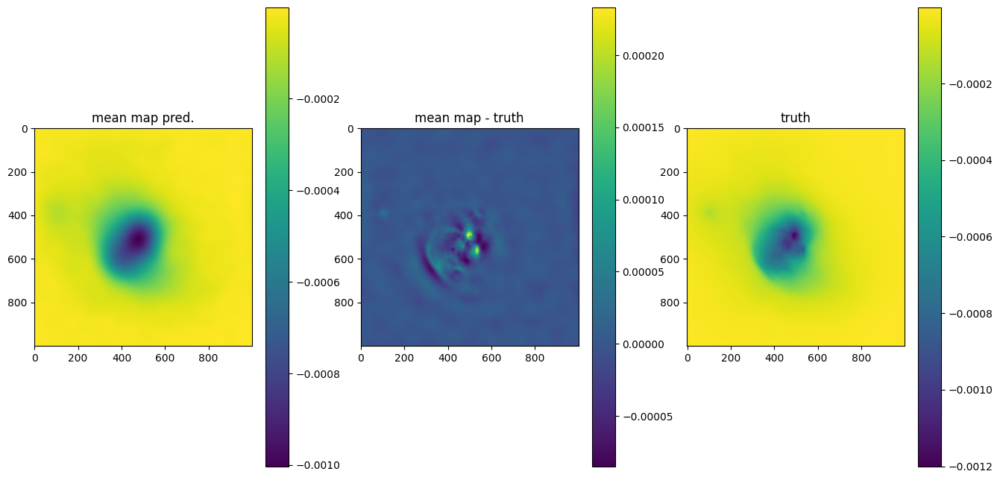

OPTIMIZE_KL: Starting 0028
SL: Iteration 0 ⛰:+1.0365e+16 Δ⛰:inf ➽:1.0320e+01
SL: Iteration 1 ⛰:+6.7559e+15 Δ⛰:3.6087e+15 ➽:1.0320e+01
SL: Iteration 2 ⛰:+8.9342e+14 Δ⛰:5.8625e+15 ➽:1.0320e+01
SL: Iteration 3 ⛰:+2.2742e+14 Δ⛰:6.6600e+14 ➽:1.0320e+01
SL: Iteration 4 ⛰:+1.1357e+14 Δ⛰:1.1385e+14 ➽:1.0320e+01
SL: Iteration 5 ⛰:+7.9861e+13 Δ⛰:3.3709e+13 ➽:1.0320e+01
SL: Iteration 6 ⛰:+5.9192e+13 Δ⛰:2.0668e+13 ➽:1.0320e+01
SL: Iteration 7 ⛰:+4.0769e+13 Δ⛰:1.8424e+13 ➽:1.0320e+01
SL: Iteration 8 ⛰:+4.0449e+13 Δ⛰:3.2011e+11 ➽:1.0320e+01
SL: Iteration 9 ⛰:+3.1117e+13 Δ⛰:9.3315e+12 ➽:1.0320e+01
SL: Iteration 10 ⛰:+2.5002e+13 Δ⛰:6.1152e+12 ➽:1.0320e+01
SL: Iteration 11 ⛰:+2.2433e+13 Δ⛰:2.5684e+12 ➽:1.0320e+01
SL: Iteration 12 ⛰:+1.9998e+13 Δ⛰:2.4351e+12 ➽:1.0320e+01
SL: Iteration 13 ⛰:+1.7835e+13 Δ⛰:2.1630e+12 ➽:1.0320e+01
SL: Iteration 14 ⛰:+1.7827e+13 Δ⛰:8.0038e+09 ➽:1.0320e+01
SL: Iteration 15 ⛰:+1.3660e+13 Δ⛰:4.1669e+12 ➽:1.0320e+01
SL: Iteration 16 ⛰:+1.1068e+13 Δ⛰:2.5928e+12 ➽:1.0320e+01
SL: 

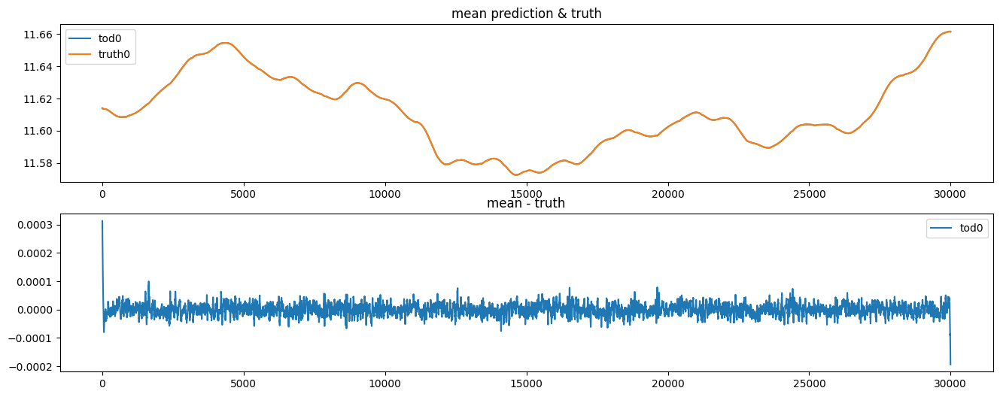

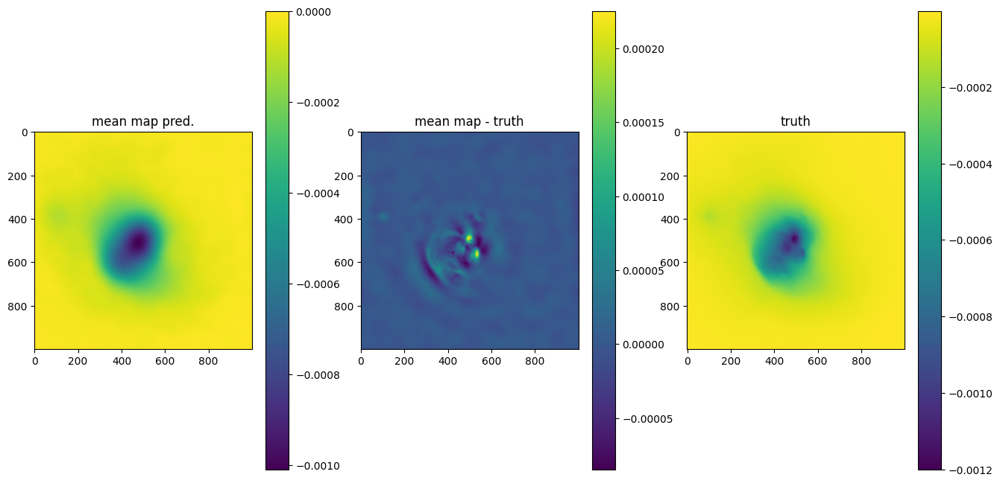

OPTIMIZE_KL: Starting 0029
SL: Iteration 0 ⛰:+1.4325e+16 Δ⛰:inf ➽:1.0320e+01
SL: Iteration 1 ⛰:+3.2642e+15 Δ⛰:1.1061e+16 ➽:1.0320e+01
SL: Iteration 2 ⛰:+1.3688e+15 Δ⛰:1.8953e+15 ➽:1.0320e+01
SL: Iteration 3 ⛰:+7.8731e+14 Δ⛰:5.8154e+14 ➽:1.0320e+01
SL: Iteration 4 ⛰:+1.8559e+14 Δ⛰:6.0172e+14 ➽:1.0320e+01
SL: Iteration 5 ⛰:+1.2930e+14 Δ⛰:5.6290e+13 ➽:1.0320e+01
SL: Iteration 6 ⛰:+8.3878e+13 Δ⛰:4.5421e+13 ➽:1.0320e+01
SL: Iteration 7 ⛰:+6.0726e+13 Δ⛰:2.3152e+13 ➽:1.0320e+01
SL: Iteration 8 ⛰:+6.0430e+13 Δ⛰:2.9583e+11 ➽:1.0320e+01
SL: Iteration 9 ⛰:+4.5002e+13 Δ⛰:1.5429e+13 ➽:1.0320e+01
SL: Iteration 10 ⛰:+3.8396e+13 Δ⛰:6.6060e+12 ➽:1.0320e+01
SL: Iteration 11 ⛰:+2.6239e+13 Δ⛰:1.2157e+13 ➽:1.0320e+01
SL: Iteration 12 ⛰:+2.3318e+13 Δ⛰:2.9205e+12 ➽:1.0320e+01
SL: Iteration 13 ⛰:+2.3283e+13 Δ⛰:3.5635e+10 ➽:1.0320e+01
SL: Iteration 14 ⛰:+2.3018e+13 Δ⛰:2.6463e+11 ➽:1.0320e+01
SL: Iteration 15 ⛰:+1.7498e+13 Δ⛰:5.5197e+12 ➽:1.0320e+01
SL: Iteration 16 ⛰:+1.4455e+13 Δ⛰:3.0438e+12 ➽:1.0320e+01
SL: 

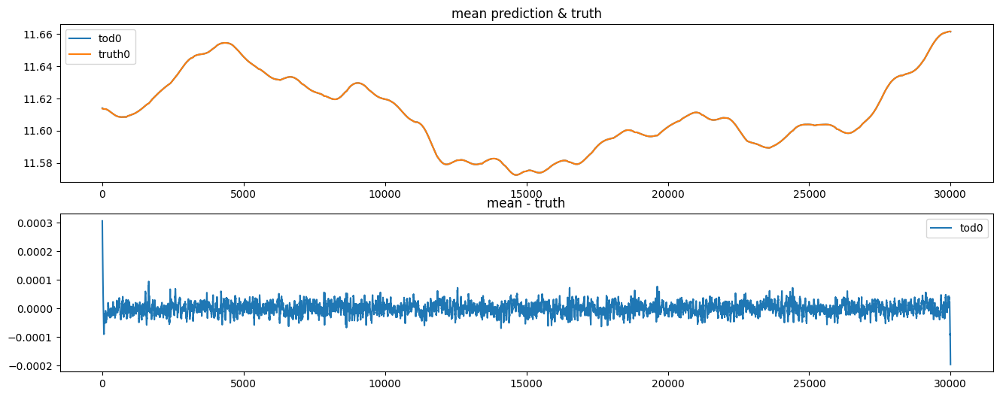

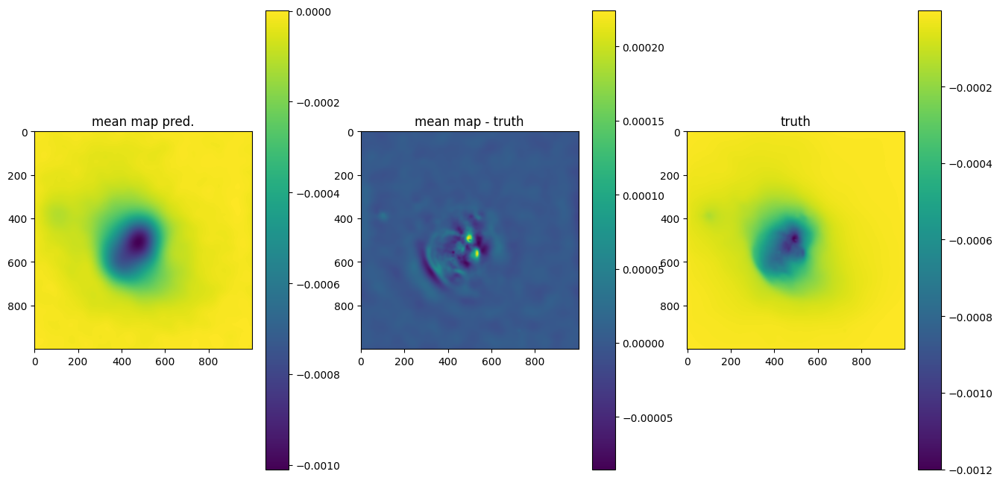

OPTIMIZE_KL: Starting 0030
SL: Iteration 0 ⛰:+3.0867e+15 Δ⛰:inf ➽:1.0320e+01
SL: Iteration 1 ⛰:+2.5665e+15 Δ⛰:5.2014e+14 ➽:1.0320e+01
SL: Iteration 2 ⛰:+7.6228e+14 Δ⛰:1.8043e+15 ➽:1.0320e+01
SL: Iteration 3 ⛰:+4.9376e+14 Δ⛰:2.6852e+14 ➽:1.0320e+01
SL: Iteration 4 ⛰:+1.9688e+14 Δ⛰:2.9688e+14 ➽:1.0320e+01
SL: Iteration 5 ⛰:+1.3892e+14 Δ⛰:5.7958e+13 ➽:1.0320e+01
SL: Iteration 6 ⛰:+6.9562e+13 Δ⛰:6.9356e+13 ➽:1.0320e+01
SL: Iteration 7 ⛰:+5.0299e+13 Δ⛰:1.9262e+13 ➽:1.0320e+01
SL: Iteration 8 ⛰:+5.0262e+13 Δ⛰:3.7212e+10 ➽:1.0320e+01
SL: Iteration 9 ⛰:+2.8692e+13 Δ⛰:2.1570e+13 ➽:1.0320e+01
SL: Iteration 10 ⛰:+2.2717e+13 Δ⛰:5.9746e+12 ➽:1.0320e+01
SL: Iteration 11 ⛰:+1.8896e+13 Δ⛰:3.8216e+12 ➽:1.0320e+01
SL: Iteration 12 ⛰:+1.4510e+13 Δ⛰:4.3859e+12 ➽:1.0320e+01
SL: Iteration 13 ⛰:+1.4372e+13 Δ⛰:1.3773e+11 ➽:1.0320e+01
SL: Iteration 14 ⛰:+1.4343e+13 Δ⛰:2.8851e+10 ➽:1.0320e+01
SL: Iteration 15 ⛰:+1.2638e+13 Δ⛰:1.7050e+12 ➽:1.0320e+01
SL: Iteration 16 ⛰:+1.0041e+13 Δ⛰:2.5969e+12 ➽:1.0320e+01
SL: 

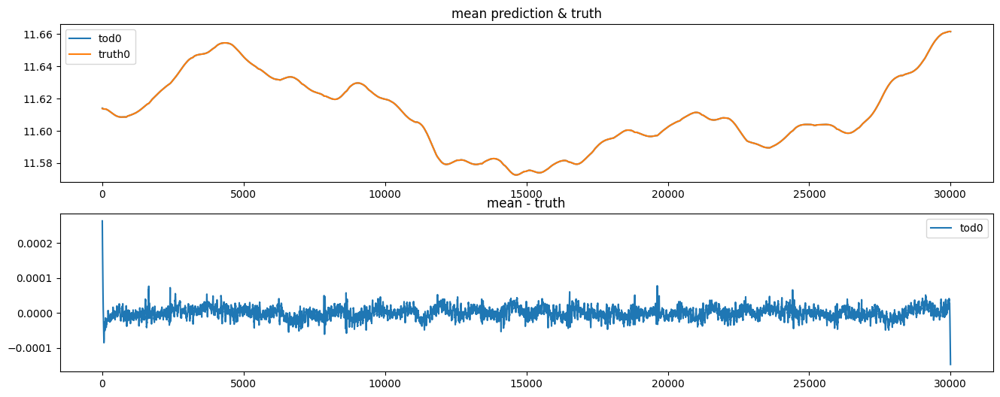

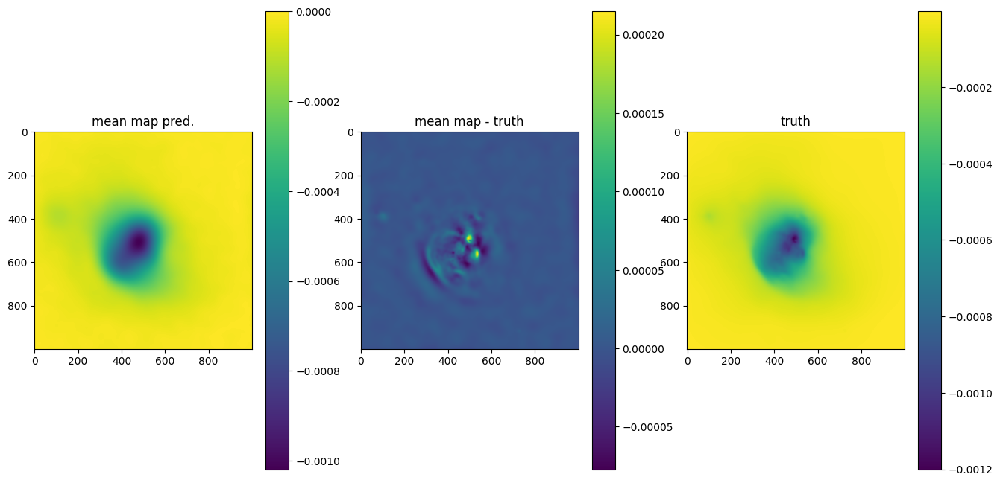

OPTIMIZE_KL: Starting 0031
SL: Iteration 0 ⛰:+8.8167e+16 Δ⛰:inf ➽:1.0320e+01
SL: Iteration 1 ⛰:+2.1953e+15 Δ⛰:8.5972e+16 ➽:1.0320e+01
SL: Iteration 2 ⛰:+8.4247e+14 Δ⛰:1.3528e+15 ➽:1.0320e+01
SL: Iteration 3 ⛰:+5.9756e+14 Δ⛰:2.4491e+14 ➽:1.0320e+01
SL: Iteration 4 ⛰:+2.4646e+14 Δ⛰:3.5110e+14 ➽:1.0320e+01
SL: Iteration 5 ⛰:+1.4962e+14 Δ⛰:9.6842e+13 ➽:1.0320e+01
SL: Iteration 6 ⛰:+9.8186e+13 Δ⛰:5.1433e+13 ➽:1.0320e+01
SL: Iteration 7 ⛰:+7.0012e+13 Δ⛰:2.8173e+13 ➽:1.0320e+01
SL: Iteration 8 ⛰:+6.8004e+13 Δ⛰:2.0083e+12 ➽:1.0320e+01
SL: Iteration 9 ⛰:+4.0149e+13 Δ⛰:2.7855e+13 ➽:1.0320e+01
SL: Iteration 10 ⛰:+2.5578e+13 Δ⛰:1.4572e+13 ➽:1.0320e+01
SL: Iteration 11 ⛰:+1.6983e+13 Δ⛰:8.5950e+12 ➽:1.0320e+01
SL: Iteration 12 ⛰:+1.4414e+13 Δ⛰:2.5692e+12 ➽:1.0320e+01
SL: Iteration 13 ⛰:+1.4410e+13 Δ⛰:3.4979e+09 ➽:1.0320e+01
SL: Iteration 14 ⛰:+1.4374e+13 Δ⛰:3.5782e+10 ➽:1.0320e+01
SL: Iteration 15 ⛰:+1.2940e+13 Δ⛰:1.4344e+12 ➽:1.0320e+01
SL: Iteration 16 ⛰:+1.1701e+13 Δ⛰:1.2394e+12 ➽:1.0320e+01
SL: 

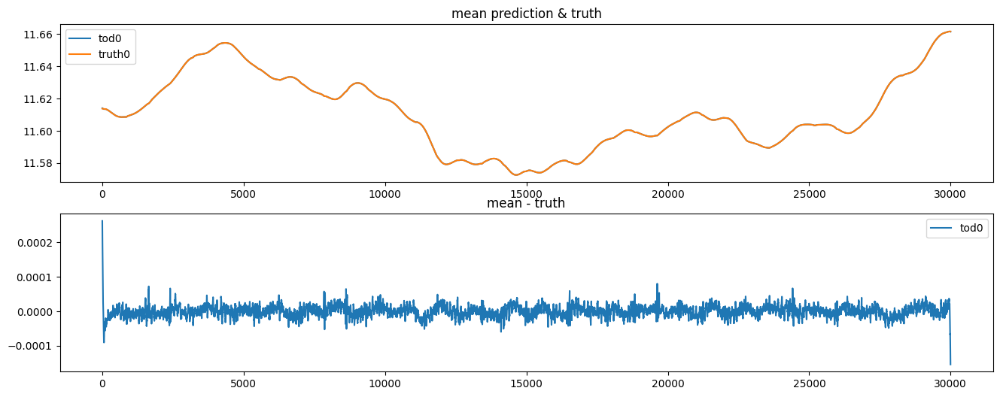

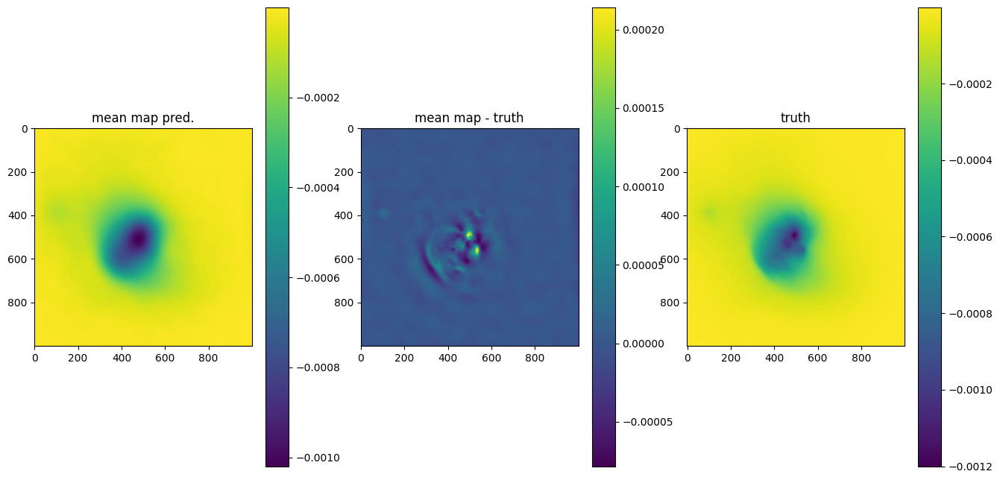

OPTIMIZE_KL: Starting 0032
SL: Iteration 0 ⛰:+2.8657e+16 Δ⛰:inf ➽:1.0320e+01
SL: Iteration 1 ⛰:+1.5979e+15 Δ⛰:2.7059e+16 ➽:1.0320e+01
SL: Iteration 2 ⛰:+3.7032e+14 Δ⛰:1.2276e+15 ➽:1.0320e+01
SL: Iteration 3 ⛰:+2.3180e+14 Δ⛰:1.3853e+14 ➽:1.0320e+01
SL: Iteration 4 ⛰:+1.7036e+14 Δ⛰:6.1441e+13 ➽:1.0320e+01
SL: Iteration 5 ⛰:+8.4331e+13 Δ⛰:8.6025e+13 ➽:1.0320e+01
SL: Iteration 6 ⛰:+6.5824e+13 Δ⛰:1.8507e+13 ➽:1.0320e+01
SL: Iteration 7 ⛰:+4.7321e+13 Δ⛰:1.8503e+13 ➽:1.0320e+01
SL: Iteration 8 ⛰:+4.5803e+13 Δ⛰:1.5175e+12 ➽:1.0320e+01
SL: Iteration 9 ⛰:+2.7893e+13 Δ⛰:1.7910e+13 ➽:1.0320e+01
SL: Iteration 10 ⛰:+1.9566e+13 Δ⛰:8.3275e+12 ➽:1.0320e+01
SL: Iteration 11 ⛰:+1.5501e+13 Δ⛰:4.0648e+12 ➽:1.0320e+01
SL: Iteration 12 ⛰:+1.2789e+13 Δ⛰:2.7123e+12 ➽:1.0320e+01
SL: Iteration 13 ⛰:+1.2716e+13 Δ⛰:7.2140e+10 ➽:1.0320e+01
SL: Iteration 14 ⛰:+1.2707e+13 Δ⛰:9.5487e+09 ➽:1.0320e+01
SL: Iteration 15 ⛰:+1.0292e+13 Δ⛰:2.4146e+12 ➽:1.0320e+01
SL: Iteration 16 ⛰:+8.4862e+12 Δ⛰:1.8061e+12 ➽:1.0320e+01
SL: 

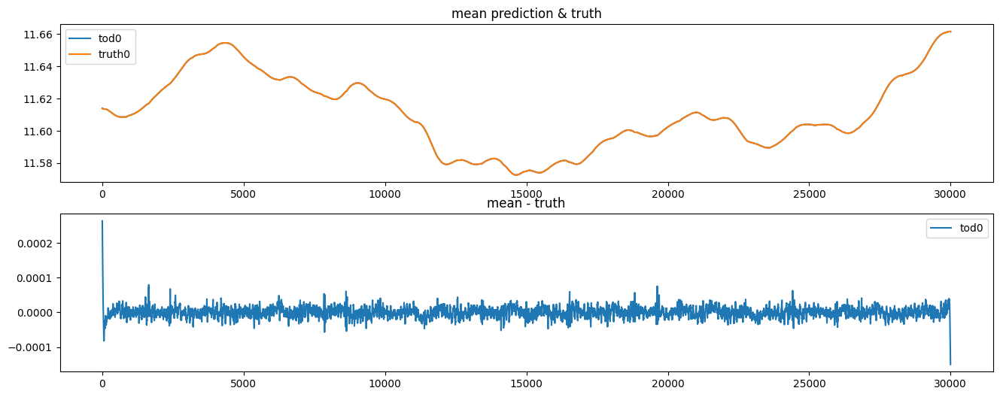

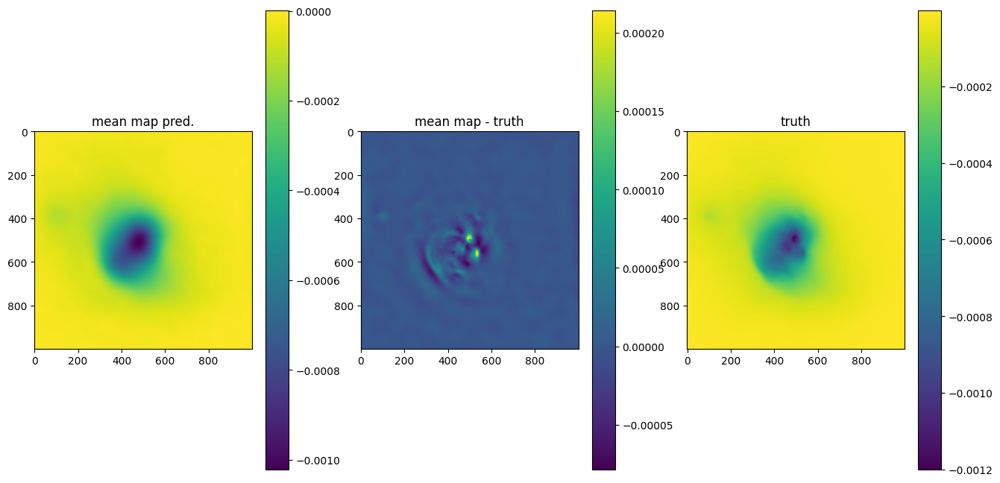

OPTIMIZE_KL: Starting 0033
SL: Iteration 0 ⛰:+9.9744e+16 Δ⛰:inf ➽:1.0320e+01
SL: Iteration 1 ⛰:+6.7778e+15 Δ⛰:9.2966e+16 ➽:1.0320e+01
SL: Iteration 2 ⛰:+1.2632e+15 Δ⛰:5.5147e+15 ➽:1.0320e+01
SL: Iteration 3 ⛰:+4.7502e+14 Δ⛰:7.8817e+14 ➽:1.0320e+01
SL: Iteration 4 ⛰:+2.5113e+14 Δ⛰:2.2388e+14 ➽:1.0320e+01
SL: Iteration 5 ⛰:+1.8997e+14 Δ⛰:6.1163e+13 ➽:1.0320e+01
SL: Iteration 6 ⛰:+8.5748e+13 Δ⛰:1.0422e+14 ➽:1.0320e+01
SL: Iteration 7 ⛰:+6.3014e+13 Δ⛰:2.2734e+13 ➽:1.0320e+01
SL: Iteration 8 ⛰:+6.1117e+13 Δ⛰:1.8973e+12 ➽:1.0320e+01
SL: Iteration 9 ⛰:+3.8817e+13 Δ⛰:2.2300e+13 ➽:1.0320e+01
SL: Iteration 10 ⛰:+2.8251e+13 Δ⛰:1.0566e+13 ➽:1.0320e+01
SL: Iteration 11 ⛰:+2.3644e+13 Δ⛰:4.6070e+12 ➽:1.0320e+01
SL: Iteration 12 ⛰:+1.8882e+13 Δ⛰:4.7623e+12 ➽:1.0320e+01
SL: Iteration 13 ⛰:+1.8726e+13 Δ⛰:1.5618e+11 ➽:1.0320e+01
SL: Iteration 14 ⛰:+1.8715e+13 Δ⛰:1.1091e+10 ➽:1.0320e+01
SL: Iteration 15 ⛰:+1.5178e+13 Δ⛰:3.5370e+12 ➽:1.0320e+01
SL: Iteration 16 ⛰:+1.3379e+13 Δ⛰:1.7987e+12 ➽:1.0320e+01
SL: 

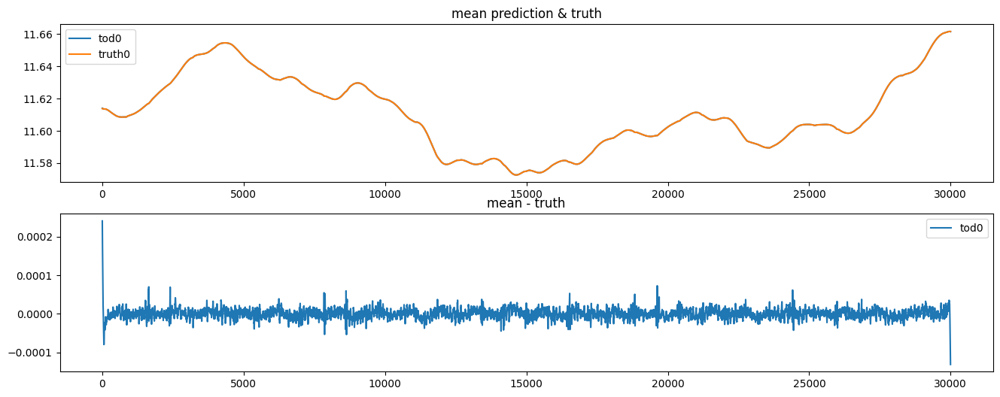

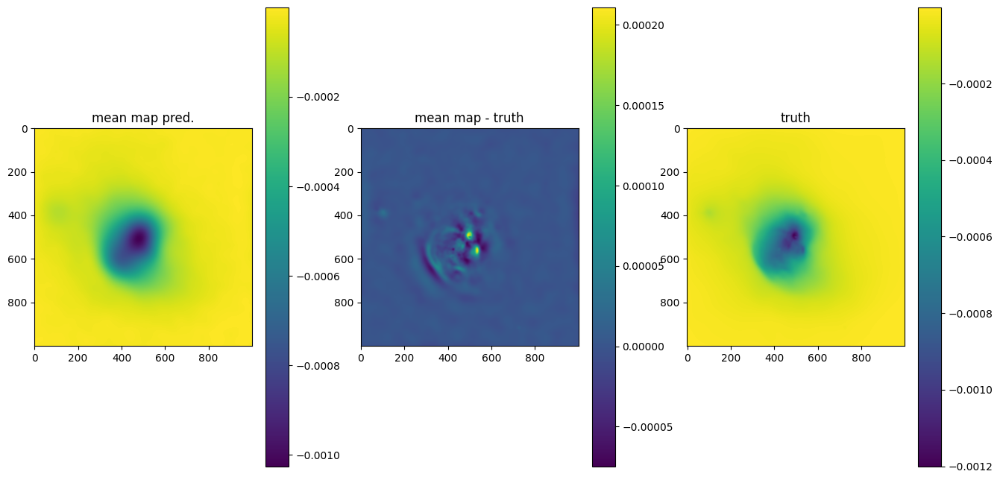

OPTIMIZE_KL: Starting 0034
SL: Iteration 0 ⛰:+1.7292e+16 Δ⛰:inf ➽:1.0320e+01
SL: Iteration 1 ⛰:+4.0669e+15 Δ⛰:1.3225e+16 ➽:1.0320e+01
SL: Iteration 2 ⛰:+6.2419e+14 Δ⛰:3.4427e+15 ➽:1.0320e+01
SL: Iteration 3 ⛰:+2.2597e+14 Δ⛰:3.9822e+14 ➽:1.0320e+01
SL: Iteration 4 ⛰:+9.5778e+13 Δ⛰:1.3019e+14 ➽:1.0320e+01
SL: Iteration 5 ⛰:+4.7267e+13 Δ⛰:4.8511e+13 ➽:1.0320e+01
SL: Iteration 6 ⛰:+4.0198e+13 Δ⛰:7.0688e+12 ➽:1.0320e+01
SL: Iteration 7 ⛰:+3.4844e+13 Δ⛰:5.3540e+12 ➽:1.0320e+01
SL: Iteration 8 ⛰:+2.9593e+13 Δ⛰:5.2516e+12 ➽:1.0320e+01
SL: Iteration 9 ⛰:+2.0971e+13 Δ⛰:8.6216e+12 ➽:1.0320e+01
SL: Iteration 10 ⛰:+1.7816e+13 Δ⛰:3.1551e+12 ➽:1.0320e+01
SL: Iteration 11 ⛰:+1.4448e+13 Δ⛰:3.3682e+12 ➽:1.0320e+01
SL: Iteration 12 ⛰:+1.1620e+13 Δ⛰:2.8275e+12 ➽:1.0320e+01
SL: Iteration 13 ⛰:+1.1613e+13 Δ⛰:7.2420e+09 ➽:1.0320e+01
SL: Iteration 14 ⛰:+1.0316e+13 Δ⛰:1.2974e+12 ➽:1.0320e+01
SL: Iteration 15 ⛰:+9.6142e+12 Δ⛰:7.0152e+11 ➽:1.0320e+01
SL: Iteration 16 ⛰:+7.6258e+12 Δ⛰:1.9884e+12 ➽:1.0320e+01
SL: 

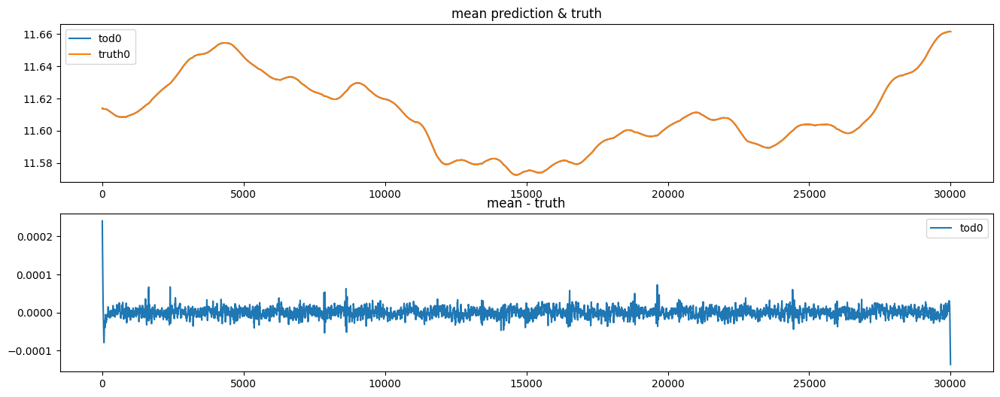

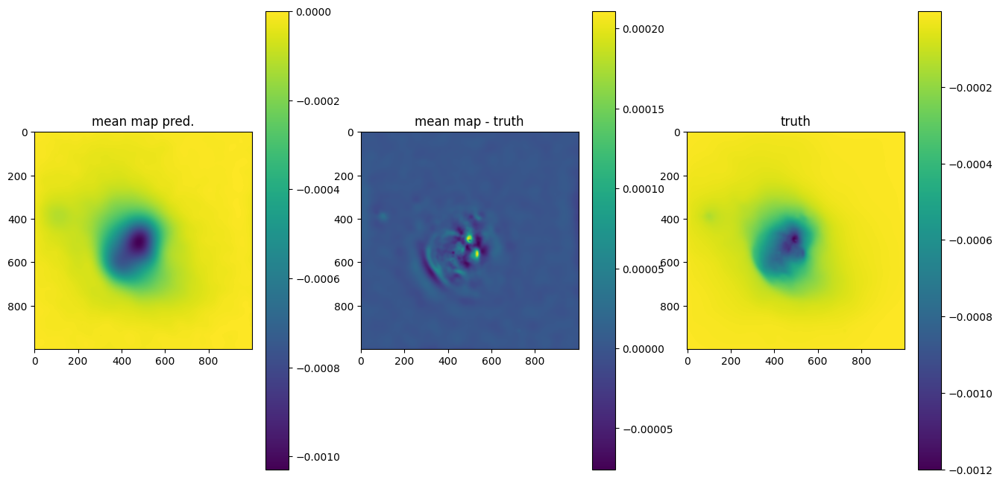

OPTIMIZE_KL: Starting 0035
SL: Iteration 0 ⛰:+4.7125e+17 Δ⛰:inf ➽:1.0320e+01
SL: Iteration 1 ⛰:+1.2851e+15 Δ⛰:4.6997e+17 ➽:1.0320e+01
SL: Iteration 2 ⛰:+4.5899e+14 Δ⛰:8.2615e+14 ➽:1.0320e+01
SL: Iteration 3 ⛰:+3.4277e+14 Δ⛰:1.1622e+14 ➽:1.0320e+01
SL: Iteration 4 ⛰:+2.2147e+14 Δ⛰:1.2130e+14 ➽:1.0320e+01
SL: Iteration 5 ⛰:+9.4366e+13 Δ⛰:1.2711e+14 ➽:1.0320e+01
SL: Iteration 6 ⛰:+7.0632e+13 Δ⛰:2.3734e+13 ➽:1.0320e+01
SL: Iteration 7 ⛰:+6.7443e+13 Δ⛰:3.1889e+12 ➽:1.0320e+01
SL: Iteration 8 ⛰:+4.0748e+13 Δ⛰:2.6695e+13 ➽:1.0320e+01
SL: Iteration 9 ⛰:+3.2469e+13 Δ⛰:8.2788e+12 ➽:1.0320e+01
SL: Iteration 10 ⛰:+2.4620e+13 Δ⛰:7.8491e+12 ➽:1.0320e+01
SL: Iteration 11 ⛰:+2.0329e+13 Δ⛰:4.2910e+12 ➽:1.0320e+01
SL: Iteration 12 ⛰:+1.4723e+13 Δ⛰:5.6063e+12 ➽:1.0320e+01
SL: Iteration 13 ⛰:+1.4615e+13 Δ⛰:1.0729e+11 ➽:1.0320e+01
SL: Iteration 14 ⛰:+1.4417e+13 Δ⛰:1.9868e+11 ➽:1.0320e+01
SL: Iteration 15 ⛰:+1.1837e+13 Δ⛰:2.5802e+12 ➽:1.0320e+01
SL: Iteration 16 ⛰:+1.0321e+13 Δ⛰:1.5159e+12 ➽:1.0320e+01
SL: 

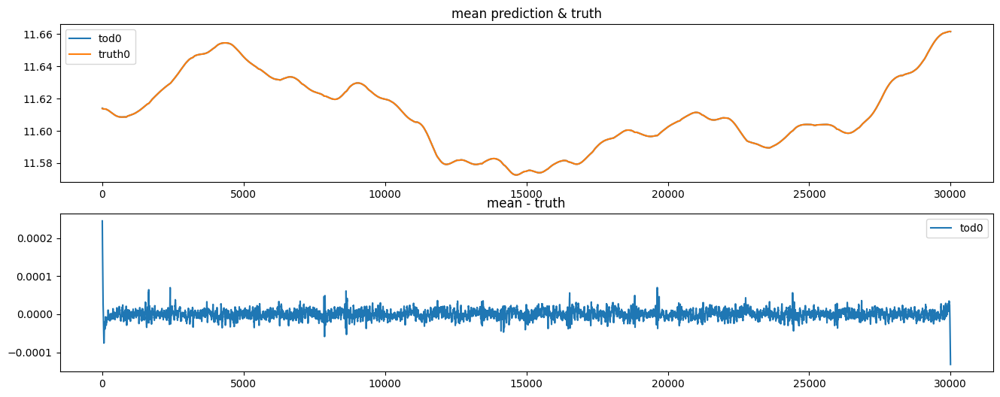

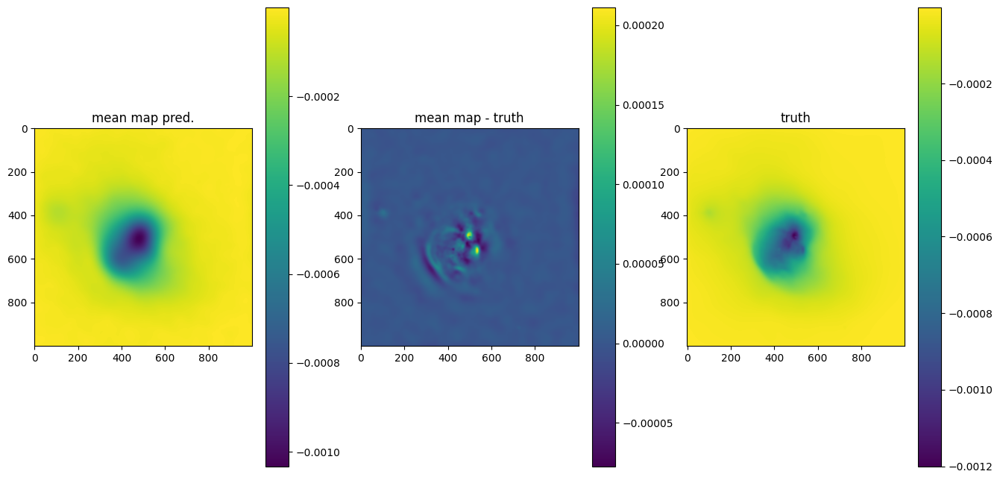

OPTIMIZE_KL: Starting 0036
SL: Iteration 0 ⛰:+2.5877e+16 Δ⛰:inf ➽:1.0320e+01
SL: Iteration 1 ⛰:+4.0018e+15 Δ⛰:2.1876e+16 ➽:1.0320e+01
SL: Iteration 2 ⛰:+9.1563e+14 Δ⛰:3.0862e+15 ➽:1.0320e+01
SL: Iteration 3 ⛰:+3.3460e+14 Δ⛰:5.8103e+14 ➽:1.0320e+01
SL: Iteration 4 ⛰:+1.7725e+14 Δ⛰:1.5735e+14 ➽:1.0320e+01
SL: Iteration 5 ⛰:+1.5897e+14 Δ⛰:1.8283e+13 ➽:1.0320e+01
SL: Iteration 6 ⛰:+1.0884e+14 Δ⛰:5.0132e+13 ➽:1.0320e+01
SL: Iteration 7 ⛰:+7.2235e+13 Δ⛰:3.6604e+13 ➽:1.0320e+01
SL: Iteration 8 ⛰:+7.2157e+13 Δ⛰:7.7719e+10 ➽:1.0320e+01
SL: Iteration 9 ⛰:+3.4947e+13 Δ⛰:3.7210e+13 ➽:1.0320e+01
SL: Iteration 10 ⛰:+2.7871e+13 Δ⛰:7.0763e+12 ➽:1.0320e+01
SL: Iteration 11 ⛰:+1.6739e+13 Δ⛰:1.1132e+13 ➽:1.0320e+01
SL: Iteration 12 ⛰:+1.0756e+13 Δ⛰:5.9832e+12 ➽:1.0320e+01
SL: Iteration 13 ⛰:+1.0704e+13 Δ⛰:5.1680e+10 ➽:1.0320e+01
SL: Iteration 14 ⛰:+1.0698e+13 Δ⛰:6.6515e+09 ➽:1.0320e+01
SL: Iteration 15 ⛰:+8.8112e+12 Δ⛰:1.8863e+12 ➽:1.0320e+01
SL: Iteration 16 ⛰:+6.5724e+12 Δ⛰:2.2389e+12 ➽:1.0320e+01
SL: 

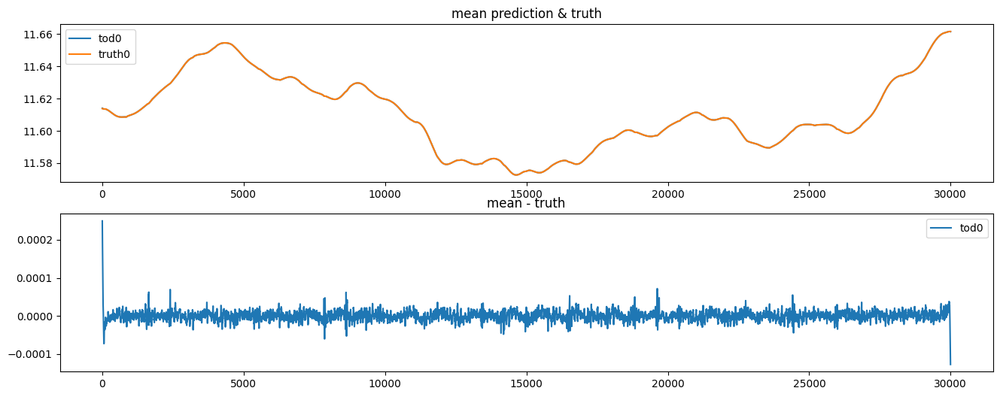

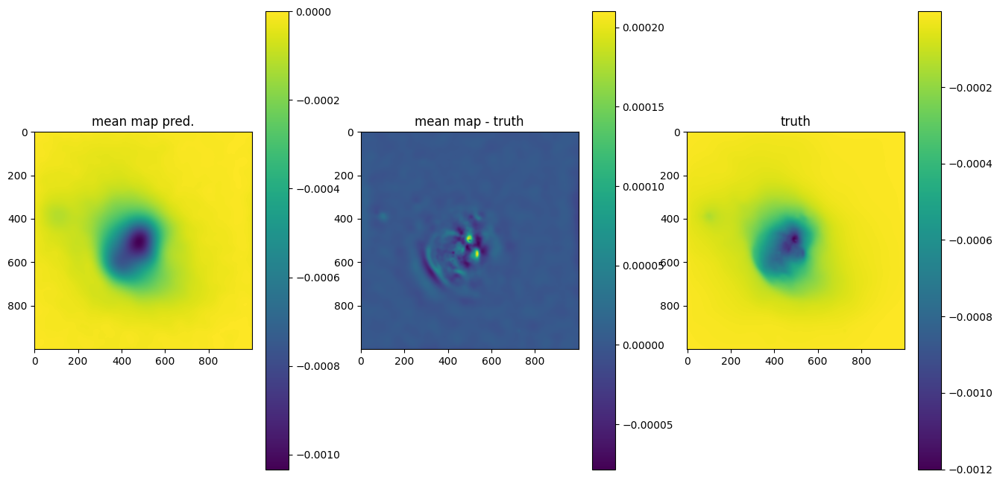

OPTIMIZE_KL: Starting 0037
SL: Iteration 0 ⛰:+1.4357e+17 Δ⛰:inf ➽:1.0320e+01
SL: Iteration 1 ⛰:+8.1622e+14 Δ⛰:1.4276e+17 ➽:1.0320e+01
SL: Iteration 2 ⛰:+5.4376e+14 Δ⛰:2.7245e+14 ➽:1.0320e+01
SL: Iteration 3 ⛰:+3.3652e+14 Δ⛰:2.0725e+14 ➽:1.0320e+01
SL: Iteration 4 ⛰:+1.0333e+14 Δ⛰:2.3319e+14 ➽:1.0320e+01
SL: Iteration 5 ⛰:+6.9658e+13 Δ⛰:3.3673e+13 ➽:1.0320e+01
SL: Iteration 6 ⛰:+3.7858e+13 Δ⛰:3.1800e+13 ➽:1.0320e+01
SL: Iteration 7 ⛰:+3.0905e+13 Δ⛰:6.9530e+12 ➽:1.0320e+01
SL: Iteration 8 ⛰:+2.8565e+13 Δ⛰:2.3400e+12 ➽:1.0320e+01
SL: Iteration 9 ⛰:+2.1552e+13 Δ⛰:7.0132e+12 ➽:1.0320e+01
SL: Iteration 10 ⛰:+1.5714e+13 Δ⛰:5.8384e+12 ➽:1.0320e+01
SL: Iteration 11 ⛰:+1.2864e+13 Δ⛰:2.8493e+12 ➽:1.0320e+01
SL: Iteration 12 ⛰:+1.0534e+13 Δ⛰:2.3306e+12 ➽:1.0320e+01
SL: Iteration 13 ⛰:+1.0506e+13 Δ⛰:2.7431e+10 ➽:1.0320e+01
SL: Iteration 14 ⛰:+9.3482e+12 Δ⛰:1.1581e+12 ➽:1.0320e+01
SL: Iteration 15 ⛰:+9.1861e+12 Δ⛰:1.6208e+11 ➽:1.0320e+01
SL: Iteration 16 ⛰:+7.2520e+12 Δ⛰:1.9342e+12 ➽:1.0320e+01
SL: 

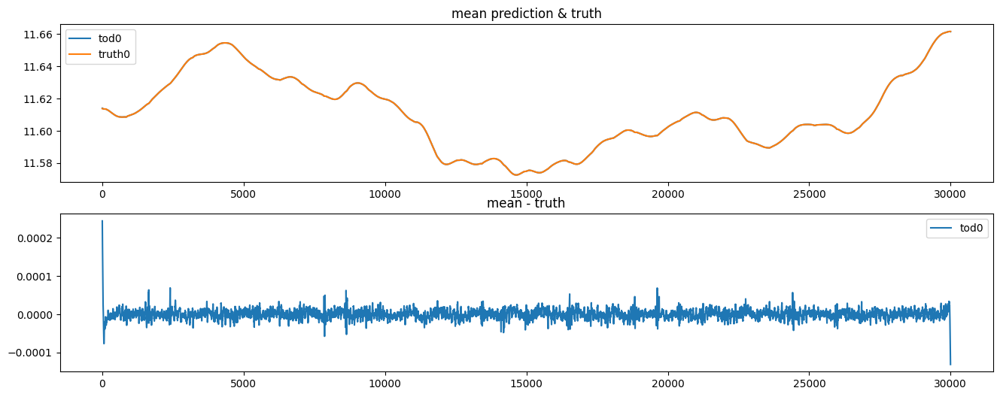

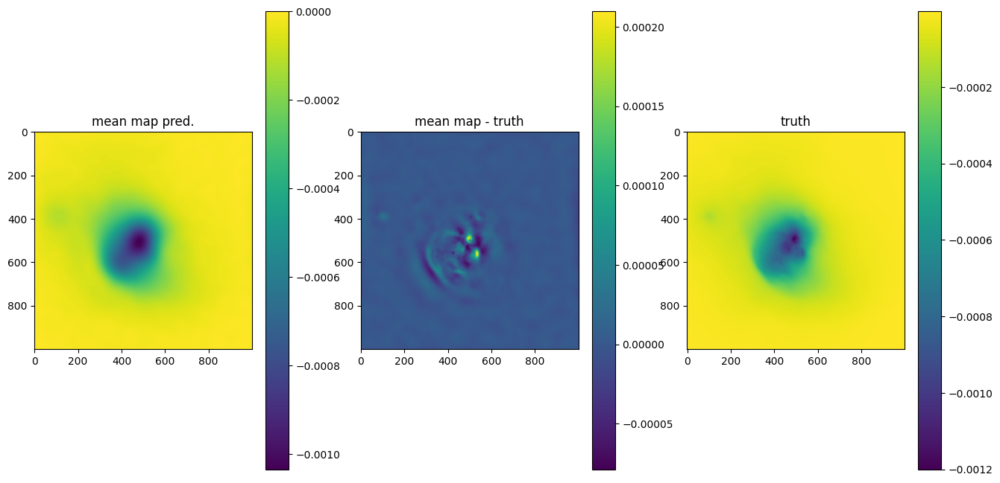

OPTIMIZE_KL: Starting 0038
SL: Iteration 0 ⛰:+1.4706e+17 Δ⛰:inf ➽:1.0320e+01
SL: Iteration 1 ⛰:+4.4896e+15 Δ⛰:1.4258e+17 ➽:1.0320e+01
SL: Iteration 2 ⛰:+1.8441e+15 Δ⛰:2.6455e+15 ➽:1.0320e+01
SL: Iteration 3 ⛰:+4.8967e+14 Δ⛰:1.3544e+15 ➽:1.0320e+01
SL: Iteration 4 ⛰:+3.8435e+14 Δ⛰:1.0532e+14 ➽:1.0320e+01
SL: Iteration 5 ⛰:+1.8919e+14 Δ⛰:1.9516e+14 ➽:1.0320e+01
SL: Iteration 6 ⛰:+1.0016e+14 Δ⛰:8.9028e+13 ➽:1.0320e+01
SL: Iteration 7 ⛰:+8.5364e+13 Δ⛰:1.4799e+13 ➽:1.0320e+01
SL: Iteration 8 ⛰:+7.2157e+13 Δ⛰:1.3207e+13 ➽:1.0320e+01
SL: Iteration 9 ⛰:+3.5466e+13 Δ⛰:3.6692e+13 ➽:1.0320e+01
SL: Iteration 10 ⛰:+2.4336e+13 Δ⛰:1.1130e+13 ➽:1.0320e+01
SL: Iteration 11 ⛰:+1.9901e+13 Δ⛰:4.4343e+12 ➽:1.0320e+01
SL: Iteration 12 ⛰:+1.4445e+13 Δ⛰:5.4566e+12 ➽:1.0320e+01
SL: Iteration 13 ⛰:+1.4403e+13 Δ⛰:4.1565e+10 ➽:1.0320e+01
SL: Iteration 14 ⛰:+1.4220e+13 Δ⛰:1.8280e+11 ➽:1.0320e+01
SL: Iteration 15 ⛰:+1.2889e+13 Δ⛰:1.3319e+12 ➽:1.0320e+01
SL: Iteration 16 ⛰:+1.0090e+13 Δ⛰:2.7988e+12 ➽:1.0320e+01
SL: 

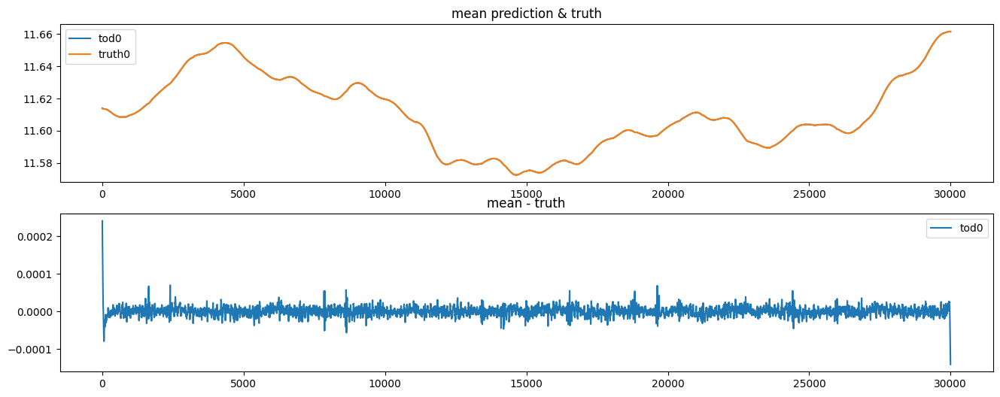

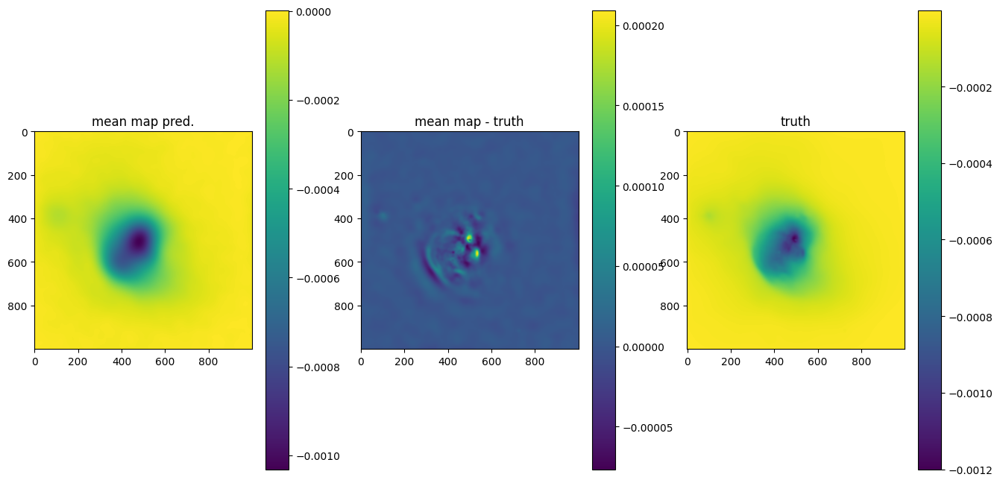

OPTIMIZE_KL: Starting 0039
SL: Iteration 0 ⛰:+5.1902e+15 Δ⛰:inf ➽:1.0320e+01
SL: Iteration 1 ⛰:+3.6566e+15 Δ⛰:1.5336e+15 ➽:1.0320e+01
SL: Iteration 2 ⛰:+6.3017e+14 Δ⛰:3.0264e+15 ➽:1.0320e+01
SL: Iteration 3 ⛰:+4.0432e+14 Δ⛰:2.2585e+14 ➽:1.0320e+01
SL: Iteration 4 ⛰:+2.3926e+14 Δ⛰:1.6506e+14 ➽:1.0320e+01
SL: Iteration 5 ⛰:+1.5497e+14 Δ⛰:8.4287e+13 ➽:1.0320e+01
SL: Iteration 6 ⛰:+6.4747e+13 Δ⛰:9.0223e+13 ➽:1.0320e+01
SL: Iteration 7 ⛰:+4.9553e+13 Δ⛰:1.5194e+13 ➽:1.0320e+01
SL: Iteration 8 ⛰:+4.9534e+13 Δ⛰:1.9011e+10 ➽:1.0320e+01
SL: Iteration 9 ⛰:+3.0502e+13 Δ⛰:1.9032e+13 ➽:1.0320e+01
SL: Iteration 10 ⛰:+2.6001e+13 Δ⛰:4.5013e+12 ➽:1.0320e+01
SL: Iteration 11 ⛰:+1.9311e+13 Δ⛰:6.6894e+12 ➽:1.0320e+01
SL: Iteration 12 ⛰:+1.4655e+13 Δ⛰:4.6569e+12 ➽:1.0320e+01
SL: Iteration 13 ⛰:+1.4624e+13 Δ⛰:3.0710e+10 ➽:1.0320e+01
SL: Iteration 14 ⛰:+1.4619e+13 Δ⛰:5.0644e+09 ➽:1.0320e+01
SL: Iteration 15 ⛰:+1.3035e+13 Δ⛰:1.5841e+12 ➽:1.0320e+01
SL: Iteration 16 ⛰:+8.5915e+12 Δ⛰:4.4432e+12 ➽:1.0320e+01
SL: 

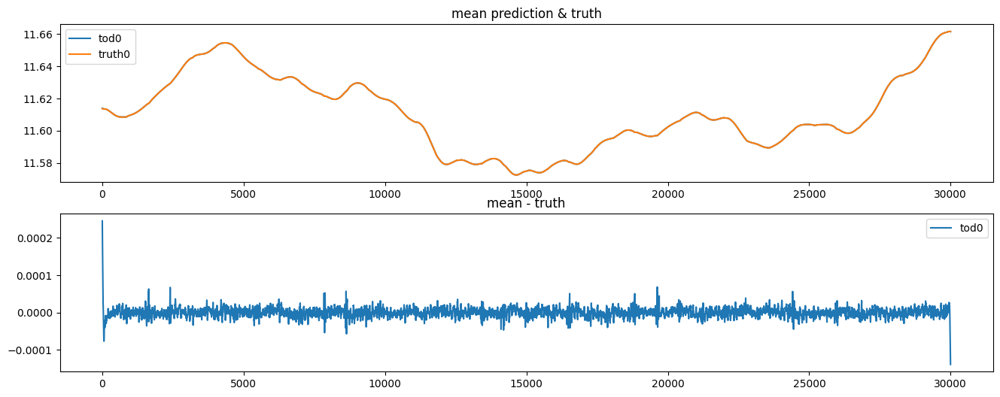

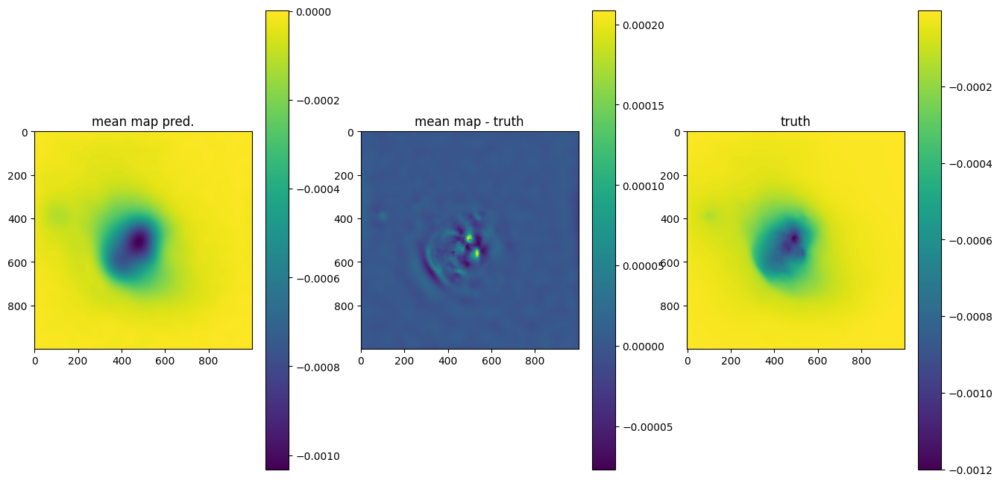

OPTIMIZE_KL: Starting 0040
SL: Iteration 0 ⛰:+2.3163e+15 Δ⛰:inf ➽:1.0320e+01
SL: Iteration 1 ⛰:+2.1141e+15 Δ⛰:2.0223e+14 ➽:1.0320e+01
SL: Iteration 2 ⛰:+7.5941e+14 Δ⛰:1.3547e+15 ➽:1.0320e+01
SL: Iteration 3 ⛰:+1.8745e+14 Δ⛰:5.7196e+14 ➽:1.0320e+01
SL: Iteration 4 ⛰:+1.3980e+14 Δ⛰:4.7647e+13 ➽:1.0320e+01
SL: Iteration 5 ⛰:+1.0023e+14 Δ⛰:3.9570e+13 ➽:1.0320e+01
SL: Iteration 6 ⛰:+7.1475e+13 Δ⛰:2.8755e+13 ➽:1.0320e+01
SL: Iteration 7 ⛰:+5.1016e+13 Δ⛰:2.0459e+13 ➽:1.0320e+01
SL: Iteration 8 ⛰:+5.0939e+13 Δ⛰:7.7122e+10 ➽:1.0320e+01
SL: Iteration 9 ⛰:+2.5848e+13 Δ⛰:2.5090e+13 ➽:1.0320e+01
SL: Iteration 10 ⛰:+2.0922e+13 Δ⛰:4.9263e+12 ➽:1.0320e+01
SL: Iteration 11 ⛰:+1.7606e+13 Δ⛰:3.3158e+12 ➽:1.0320e+01
SL: Iteration 12 ⛰:+1.4570e+13 Δ⛰:3.0359e+12 ➽:1.0320e+01
SL: Iteration 13 ⛰:+1.4128e+13 Δ⛰:4.4244e+11 ➽:1.0320e+01
SL: Iteration 14 ⛰:+1.4054e+13 Δ⛰:7.4109e+10 ➽:1.0320e+01
SL: Iteration 15 ⛰:+1.1113e+13 Δ⛰:2.9404e+12 ➽:1.0320e+01
SL: Iteration 16 ⛰:+6.7658e+12 Δ⛰:4.3476e+12 ➽:1.0320e+01
SL: 

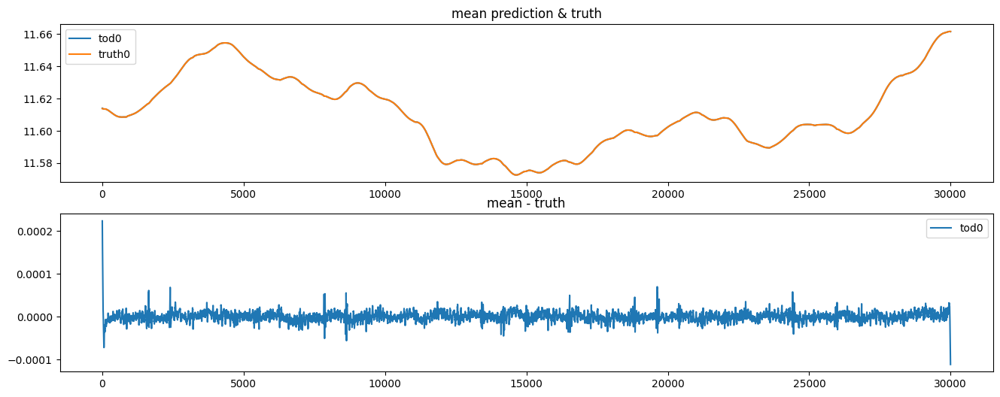

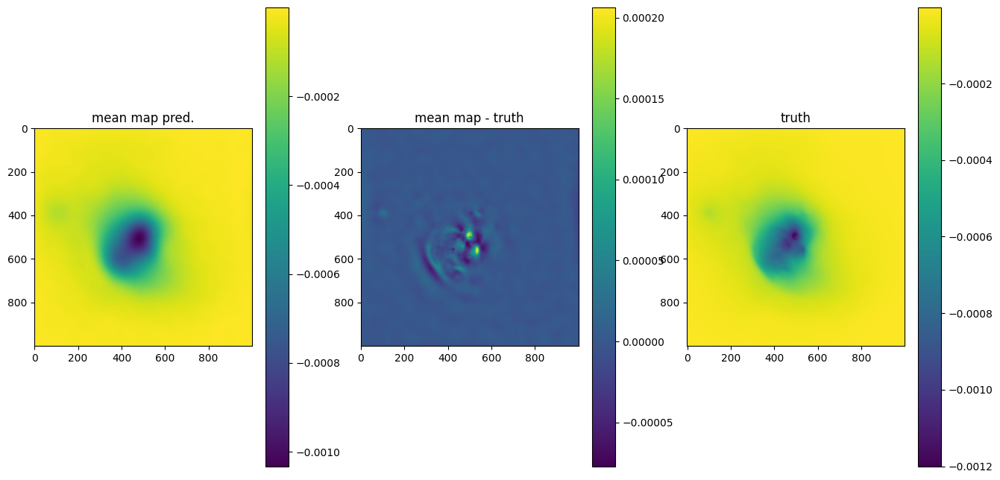

In [24]:
# n_it = 10
n_it = 40
# delta = 1e-4 # default
# delta = 1e-8 # map
# tod
# if noiselevel == 0.0: delta = 1e-6
if noiselevel == 0.0: delta = 1e-4
# if noiselevel == 0.0: delta = 1e-11
elif noiselevel == 0.1: delta = 1e-10
elif noiselevel == 0.5: delta = 1e-10
elif noiselevel == 1.0: delta = 1e-4
n_samples = 4 # no samples -> maximum aposteriory posterior

key, k_i, k_o = random.split(key, 3)

# callback fn for plotting during optimisation:
def callback(samples, opt_state):
    mean, std = jft.mean_and_std(tuple(signal_response_tod(s) for s in samples))

    fig_tods, axes_tods = plt.subplots(2, 1, figsize=(16, 6))

    # for i in range(0, mean.shape[0], mean.shape[0]//10):
    for i in range(n):
        axes_tods[0].plot(np.arange(0, mean.shape[1]), mean[i], label=f"tod{i}")
        axes_tods[0].plot(truth[i], label=f"truth{i}")
        axes_tods[1].plot(np.arange(0, mean.shape[1]), mean[i] - truth[i], label=f"tod{i}")

    axes_tods[0].title.set_text('mean prediction & truth')
    axes_tods[0].legend()
    axes_tods[1].title.set_text('mean - truth')
    axes_tods[1].legend()

    fig_map, axes_map = plt.subplots(1, 3, figsize=(16, 8))

    mean_map, _ = jft.mean_and_std(tuple(gp_map(s) for s in samples))

    im0 = axes_map[0].imshow(mean_map)
    axes_map[0].title.set_text('mean map pred.')
    fig_map.colorbar(im0)

    im1 = axes_map[1].imshow(mean_map - mapdata_truth[0])
    axes_map[1].title.set_text('mean map - truth')
    fig_map.colorbar(im1)

    im2 = axes_map[2].imshow(mapdata_truth[0])
    axes_map[2].title.set_text('truth')
    fig_map.colorbar(im2)

    plt.show()
    

samples, state = jft.optimize_kl(
    lh, # likelihood
    jft.Vector(lh.init(k_i)), # initial position in model space (initialisation)
    n_total_iterations=n_it, # no of optimisation steps (global)
    n_samples=n_samples, # draw samples
    key=k_o, # random jax init
    draw_linear_kwargs=dict( # sampling parameters
        cg_name="SL",
        cg_kwargs=dict(absdelta=delta * jft.size(lh.domain) / 10.0, maxiter=60),
        # cg_kwargs=dict(absdelta=delta * jft.size(lh.domain) / 10.0, maxiter=10),
    ),
    nonlinearly_update_kwargs=dict( # map from multivariate gaussian to more compl. distribution (coordinate transformations)
        minimize_kwargs=dict(
            name="SN",
            xtol=delta,
            cg_kwargs=dict(name=None),
            maxiter=5,
        )
    ),
    kl_kwargs=dict( # shift transformed multivar gauss to best match true posterior
        minimize_kwargs=dict(
            name="M", xtol=delta, cg_kwargs=dict(name=None), maxiter=60
            # name="M", xtol=delta, cg_kwargs=dict(name=None), maxiter=10
        )
    ),
    # sample_mode="nonlinear_resample", # how steps are combined (samples + nonlin + KL)
    sample_mode = lambda x: "nonlinear_resample" if x >= 1 else "linear_resample",
    callback=callback,
)

In [25]:
printfitresults()

Fit Results (res, init, std)

TODs:
	fluctuations: 0.003150361116904203, 0.005, 0.005
	loglogvarslope: -2.955390257654977, -3, 0.5
	zeromode std (LogNormal): 0.0006004722109742918, 0.0005, 0.001
map:
	fluctuations: 0.0001687938428848615, 1e-06, 1e-06
	loglogvarslope: -5.912800234719596, -2.5, 0.5
	zeromode std (LogNormal): 2.1518599370739774e-09, 1e-08, 1e-07


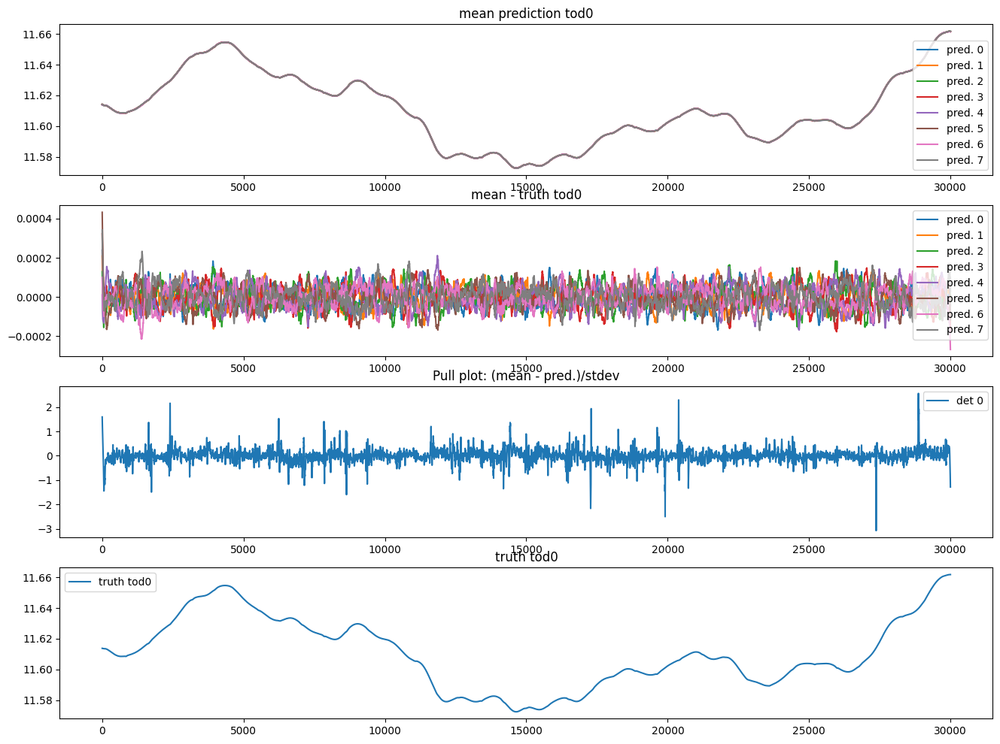

In [26]:
mean, std = jft.mean_and_std(tuple(signal_response_tod(s) for s in samples))

fig, axes = plt.subplots(4, 1, figsize=(16, 12))
i = 0
j = 0
# for i in range(mean.shape[0]):
for s in samples:
    pred = signal_response_tod(s)
    
    im0 = axes[0].plot(np.arange(0, pred.shape[1]), pred[i], label=f"pred. {j}")
    im1 = axes[1].plot(np.arange(0, pred.shape[1]), pred[i] - truth[i], label=f"pred. {j}")
    j += 1

im2 = axes[2].plot(np.arange(0, pred.shape[1]), (mean[i] - truth[i])/std[i], label=f"det {i}")
im3 = axes[3].plot(truth[i], label=f"truth tod{i}")
axes[0].title.set_text(f"mean prediction tod{i}")
axes[0].legend()
axes[1].title.set_text(f"mean - truth tod{i}")
axes[1].legend()
axes[2].title.set_text(f"Pull plot: (mean - pred.)/stdev")
axes[2].legend()
axes[3].title.set_text(f"truth tod{i}")
axes[3].legend()

plt.show()

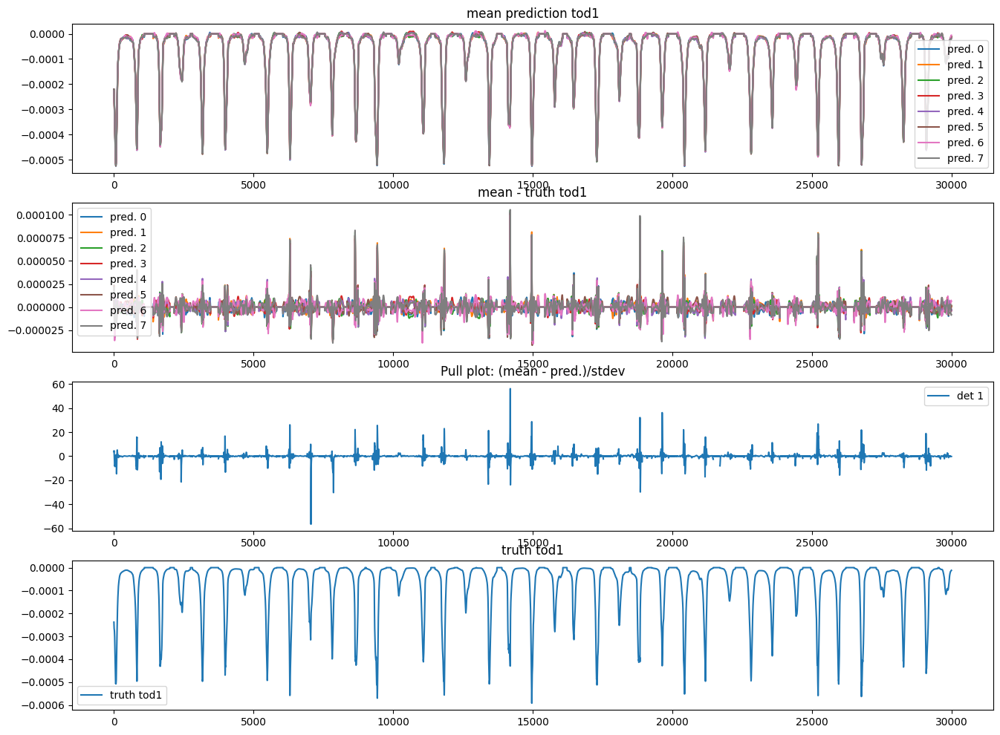

In [27]:
ig, axes = plt.subplots(4, 1, figsize=(16, 12))
i = 1
j = 0
# for i in range(mean.shape[0]):
for s in samples:
    pred = signal_response_tod(s)
    
    im0 = axes[0].plot(np.arange(0, pred.shape[1]), pred[i], label=f"pred. {j}")
    im1 = axes[1].plot(np.arange(0, pred.shape[1]), pred[i] - truth[i], label=f"pred. {j}")
    j += 1

im2 = axes[2].plot(np.arange(0, pred.shape[1]), (mean[i] - truth[i])/std[i], label=f"det {i}")
im3 = axes[3].plot(truth[i], label=f"truth tod{i}")
axes[0].title.set_text(f"mean prediction tod{i}")
axes[0].legend()
axes[1].title.set_text(f"mean - truth tod{i}")
axes[1].legend()
axes[2].title.set_text(f"Pull plot: (mean - pred.)/stdev")
axes[2].legend()
axes[3].title.set_text(f"truth tod{i}")
axes[3].legend()

plt.show()